# Introductory example: 1D Heat equation

We have to solve
$$\frac{\partial u (x,t)}{\partial t} = D^2 \frac{\partial^2 u (x,t)}{\partial x^2} \,, $$
Using the separation of variables
$$ u(x,t) = X(x) T(t)$$
we can recast the PDE into
$$ X \dot T = D^2 X'' T \longrightarrow \frac{\dot T}{T} = D^2 \frac{X''}{X} = - \lambda^2 \,, \qquad \forall \lambda \in \mathbb{R}$$
i.e.
$$ T(t) = T_0 \exp( - \lambda^2 (t - t_0) )\,, \qquad X(x) = X_0 \cos \left( {\frac{\lambda}{D}} \, (x-x_0) \right) $$

The full Cauchy system is thus ($t_0 = 0 = x_0$)
\begin{align}
&\frac{\partial u (x,t)}{\partial t} = D^2 \frac{\partial^2 u (x,t)}{\partial x^2} \\
&u(x, 0) = T_0 X_0 \cos \left( {\frac{\lambda}{D}} \, x \right) \\
&u\left(t, x=\pm \frac{\pi}{2} {\frac{D}{\lambda}} \right) =  0
\end{align}
Notice that we have a heat injection in $(x,t)=(0,0)$:
$$u(t=0, x=0) = T_0 X_0$$

### Tuning the parameters
Now, tuning the parameters to be numerically tratable
$$ T_0 = X_0 = 1, \quad \lambda = \frac{\pi D}{2}\,,$$
We have
\begin{align}
&\frac{\partial u (x,t)}{\partial t} = D^2 \frac{\partial^2 u (x,t)}{\partial x^2} \\
&u(t=0, x) = \cos \left( \frac{\pi}{2} \, x \right) \\
&u\left(t, x=\pm 1\right) =  0
\end{align}
whose exact solution is
$$ u(x,t) = X(x) T(t), \quad \text{where} \quad T(t) = T_0 \exp\left( -  \frac{\pi^2 D^2}{4}\, t  \right)\,, \; X(x) = X_0 \cos \left( \frac{\pi}{2} \, x \right) $$


#### The Outward flux

Notice that the heat flux at the boundary is
\begin{align}
\left. \Phi \right|_{\partial \Omega} &= \sum_i \left. \hat{n}_i \cdot \nabla u  \right|_{\partial \Omega} = \sum_{\pm} \left. \mp\partial_x u  \right|_{x = \pm 1} \\
&= \sum_{\pm} \left. \pm \frac{\pi X_0}{2} \sin \left( \frac{\pi}{2} \, x \right)\right|_{x = \pm 1} T(t)\\
&= \pi X_0 T(t)
\end{align}


------
Extra: reviews on PINN

[1] https://www.nature.com/articles/s42254-021-00314-5

[2] https://arxiv.org/pdf/2202.06416.pdf

[3] https://www.mdpi.com/2504-2289/6/4/140


In [ ]:
# auto reload packages
%load_ext autoreload
%autoreload 2

In [ ]:
from typing import Type, Union
import gc
import tqdm
import math
from collections import OrderedDict
try:
    import tqdm
except:
    %pip install tqdm
    import tqdm

import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")
import matplotlib.pyplot as plt

Device: cuda:0


## 0. Exact solution for Separable problem

In [ ]:
def exact_solution_func(coords: torch.Tensor, diffusion_param: float = 0.1) -> torch.Tensor:
    """
    Method to generate the exact solution function.
    """
    pi_fact = float(torch.pi/2)
    return torch.exp(- (pi_fact**2)*(diffusion_param**2)*coords[:, 0]) * torch.cos(pi_fact * coords[:, 1])

def exact_solution_func_np(T: np.array, X: np.array, diffusion_param: float = 0.1) -> np.array:
    """
    Method to generate the exact solution function.
    """
    pi_fact = float(np.pi/2)
    return np.exp(- (pi_fact**2)*(diffusion_param**2)*T) * np.cos(pi_fact * X)

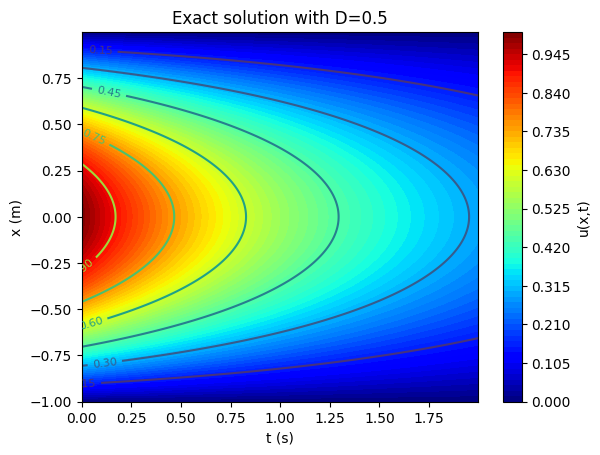

In [ ]:
N_POINTS = 10000

diffusion_parameter = 0.5

t = np.arange( 0.0,  2.0, 0.001)
x = np.arange(-1.0, +1.0, 0.001)

pi_fact = float(np.pi/2)

T, X = np.meshgrid(t, x)
Z = exact_solution_func_np(T, X, diffusion_param=diffusion_parameter )
#and then comes the plot,
plt.contourf(
    T, X, Z,
    levels=75,
    origin = 'lower',
    cmap='jet',
    alpha = 1.0
)
cbar = plt.colorbar()
cbar.set_label('u(x,t)')

#optional countour lines:
contours = plt.contour(
    T, X, Z,
    #colors='green'
    cmap='viridis'
)
plt.clabel(contours, inline=True, fontsize=8)

plt.title(f"Exact solution with D={diffusion_parameter:.1f}")
plt.xlabel('t (s)')
plt.ylabel('x (m)')

plt.show()

### 0.0. [EXTRA] From Random extraction to $R_2$ quasirandom extraction

In [ ]:
class R2_extraction:
    def __init__(
        self,
        dimension: int = 2 ,
    ):
        self.d = dimension
        self.phi_dict = {}

    def r_d_extraction(self, N_points: int):
        """
        Method to perform the quasi-random R_d extraction;
        see https://extremelearning.com.au/unreasonable-effectiveness-of-quasirandom-sequences/
        """
        d = self.d
        g = self.phi(d)
        alpha = np.zeros(d)
        for j in range(d):
            alpha[j] = pow(1/g, j+1) %1
        z = np.zeros((N_points, d))
        # This number can be any real number.
        # Common default setting is typically seed=0
        # But seed = 0.5 is generally better.
        seed = 0.5 * np.random.rand(1)[0]
        for i in range(N_points):
            z[i] = (seed + alpha*(i+1))

        z = z %1
        return torch.tensor(z)

    def phi(self, d: int):
        """
        Compute the golden number in d dims;
        it then stores it into a dict for later use.
        """
        _key = f"{d}"
        if _key not in self.phi_dict:
            x=2.0000
            for i in range(10):
                x = pow(1+x,1/(d+1))

            self.phi_dict[_key] = x
        return self.phi_dict[_key]

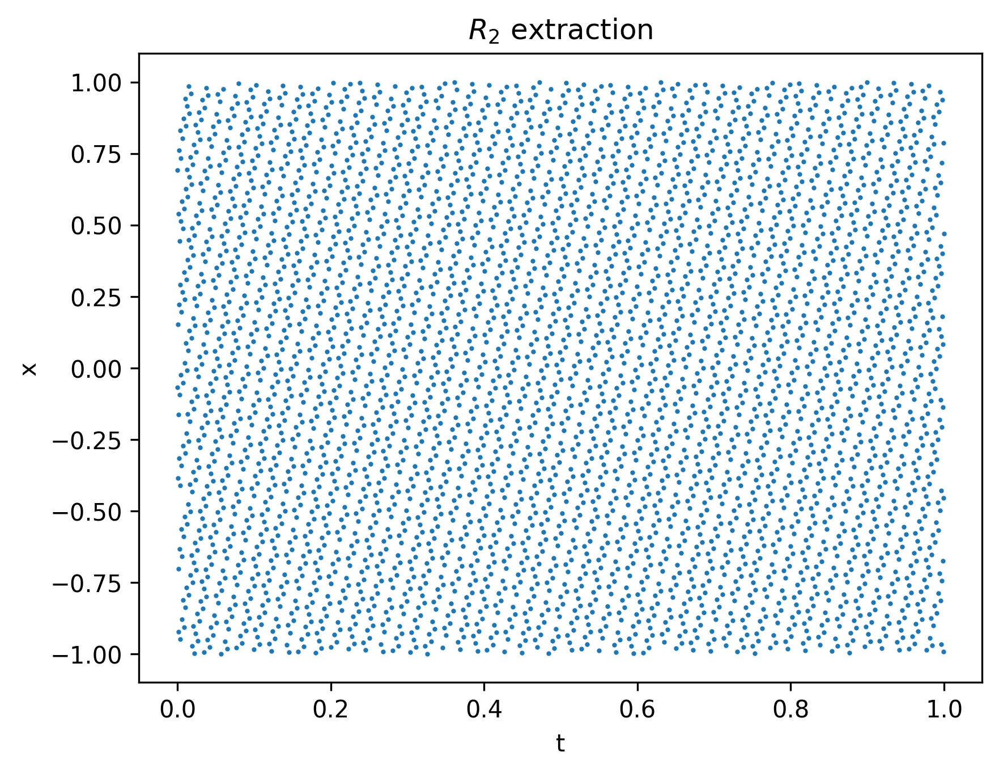

In [ ]:
r2_extractor = R2_extraction(dimension=2)

plt.figure(dpi=300)
plt.title("$R_2$ extraction")

coords = r2_extractor.r_d_extraction(N_points=4096)
coords[:, 1] = 2*coords[:, 1] - 1.0
plt.scatter(coords[:, 0], coords[:, 1], s=1, label = '$R_2$')

plt.xlabel('t')
plt.ylabel('x')

plt.show()

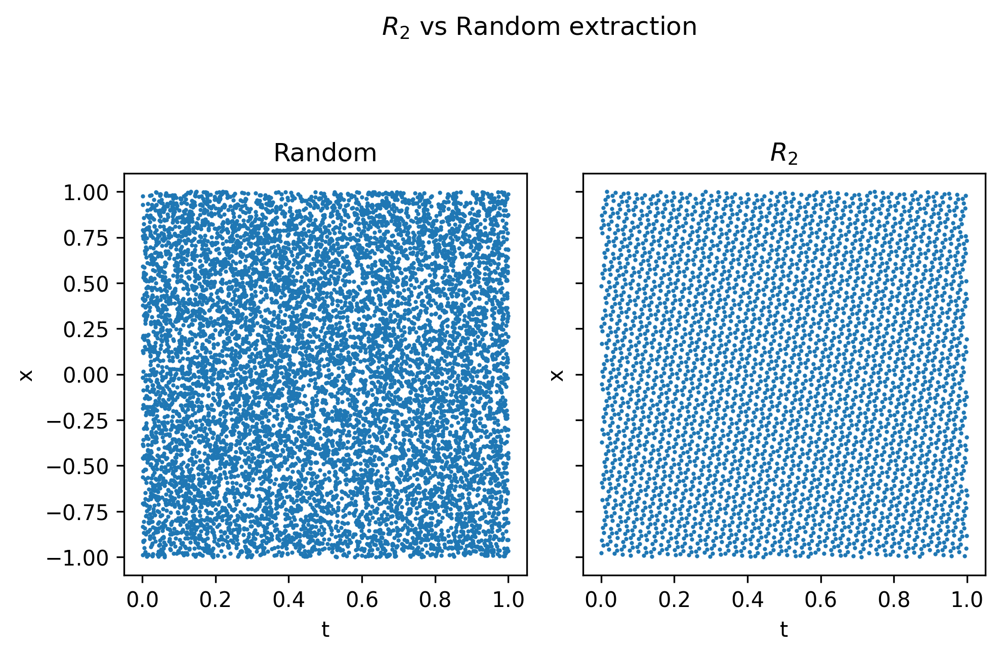

In [ ]:
fig, axs = plt.subplots(nrows=1, ncols=2, dpi=300,  sharey=True)
fig.suptitle("$R_2$ vs Random extraction")
fig.tight_layout(h_pad = 2)

coords = torch.cat( (
    torch.rand(N_POINTS).unsqueeze(-1),      # t
    2*torch.rand(N_POINTS).unsqueeze(-1) - 1), # x
    dim=-1
)
axs[0].scatter(coords[:, 0], coords[:, 1], s=1, label = 'Random')
axs[0].set_title('Random')

coords = r2_extractor.r_d_extraction(N_points=4096)
coords[:, 1] = 2*coords[:, 1] - 1.0
axs[1].scatter(coords[:, 0], coords[:, 1], s=1, label = '$R_2$')
axs[1].set_title('$R_2$')

for ax in axs:
    ax.set_xlabel('t')
    ax.set_ylabel('x')
    ax.set_box_aspect(1)

plt.show()

## 1. Define a DNN as torch module

In [ ]:
class PINN_DNN(nn.Module):
    """
    Basic Deep Neural Network
    """
    def __init__(
        self,
        n_inputs : int,      # number of inputs, e.g. x,y,z,t,....
        n_outputs: int,      # number of outputs, e.g. u,v,P, T, ....
        hidden_dims: list,   # number of hidden layers
        dropout: float = 0.2,# Dropout
        activation_func = nn.ReLU(), # activation function hidden layers
    ):
        super(PINN_DNN, self).__init__()
        self.n_layers = len(hidden_dims)
        self.dropout_prob = dropout
        self.activation_func = activation_func

        layers = OrderedDict()
        for i in range(self.n_layers):
            # Input layer
            if i == 0:
                layers[f"fc{i}"] = nn.Linear(n_inputs, hidden_dims[0], bias=False)
            # Hidden Layer(s)
            else:
                layers[f"fc{i}"] = nn.Linear(hidden_dims[i-1], hidden_dims[i], bias=False)
            layers[f"act_{i}"]   = self.activation_func
            layers[f"dropout_{i}"] = nn.Dropout(p=self.dropout_prob)

        # Output Layers
        layers[f"fc_{i+1}"] = nn.Linear(hidden_dims[-1], n_outputs, bias=True)

        self.network = nn.Sequential(layers)
        self.reset_parameters()

    def reset_parameters(self):
        """
        Initialisation method for the DNN layers weights (and biases)
        """
        for layer in self.network:
            if not isinstance(layer, nn.Linear):
                continue
            nn.init.normal_(layer.weight, std=1 / math.sqrt(layer.out_features) )
            if layer.bias is not None:
                fan_in, _ = nn.init._calculate_fan_in_and_fan_out(layer.weight)
                bound = 1 / math.sqrt(fan_in)
                nn.init.uniform_(layer.bias, -bound, bound)

    def forward(self, x):
        return self.network(x)

## 2. Define the PDE class with torch.autograd

In [ ]:
class Heat_1D_PDE:
    """
        Class computing the 1D Heat PDE equation:
            u_t - D^2 u_xx = 0

        --------------------------
        Args:
            nu    (float): Float parameter describind the ratio between the dynamic viscosity mu and the matter density rho.

        Methods:
            compute_heat      (coords, pred_funcs): returns the computed Heat eq.
    """
    def __init__(
        self,
        D: float = 0.5,     # PDE coefficient
    ):
        self.D = D

    def compute_heat(self, coords: torch.Tensor, pred_func: torch.Tensor) -> torch.Tensor:
        """
        Compute 1D Heat equation
            u_t - D^2 u_xx
        It should equate to zero.

        Args:
            coords    (torch.Tensor): (t,x) coords.
            pred_func (torch.Tensor): (u) evaluated at (t,x)
        """
        # compute derivatives

        u_t  = self.get_derivative(pred_func, coords, 1)[:,0]

        u_x  = self.get_derivative(pred_func, coords, 1)[:,1]
        u_xx = self.get_derivative(u_x, coords, 1)[:,1]

        # return evaluated PDE
        return u_t - (self.D**2) * u_xx

    def get_derivative(self, y, x, n: int = 1):
        """
        General formula to compute the n-th order derivative of y = f(x) with respect to x
        """
        if n == 0:
            return y
        else:
            dy_dx = torch.autograd.grad(y, x, torch.ones_like(y).to(y.device), create_graph=True, retain_graph=True, allow_unused=True)[0]
        return self.get_derivative(dy_dx, x, n - 1)

### 2.0 test the PDE class

In [ ]:
"""
    Test the Heat_1D_PDE class
"""
D_param = 0.5

test_pde  = Heat_1D_PDE(D=D_param)
model_try = PINN_DNN(n_inputs=2, n_outputs=1, hidden_dims=[4,8,4])

N_POINTS = 10000
coords = torch.cat( (
    torch.rand(N_POINTS).unsqueeze(-1),        # t
    2*torch.rand(N_POINTS).unsqueeze(-1) - 1), # x
    dim=-1
)
X = Variable(coords, requires_grad=True)
pred_func = model_try(X)
true_func = exact_solution_func(X, diffusion_param=D_param)
true_func_t = test_pde.get_derivative(true_func, X, 1)[:,0]
true_func_xx= test_pde.get_derivative(true_func, X, 2)[:,1]

heat_true = test_pde.compute_heat(X, true_func)
heat_pred = test_pde.compute_heat(X, pred_func)

print(f"True: {heat_true.mean()}")
print(f"Pred: {heat_pred.mean()}")

True: 2.5109443413384724e-08
Pred: -0.24901720881462097


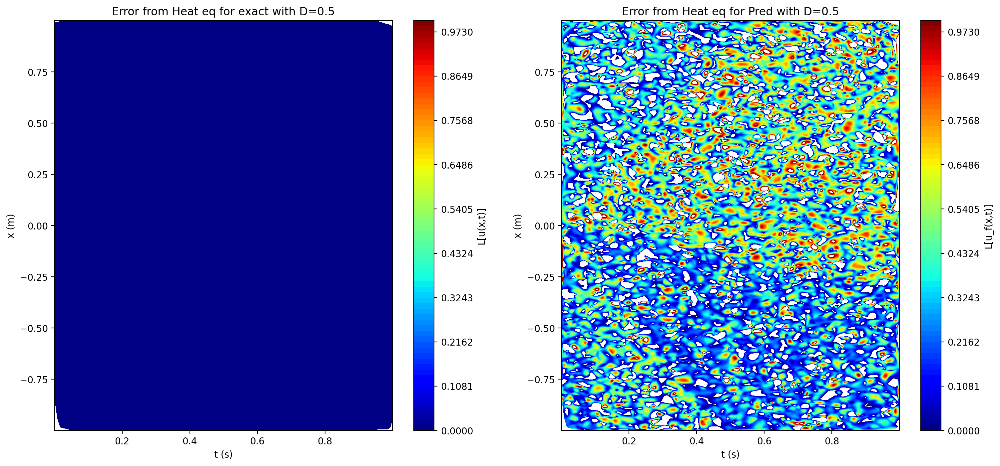

In [ ]:
import scipy.interpolate

N_POINTS = 10000

t = coords[:, 0].numpy()
x = coords[:, 1].numpy()

pi_fact = float(np.pi/2)

N_plot = 1000 #number of points for plotting/interpolation

T = np.linspace(t.min(), t.max(), N_plot)
X = np.linspace(x.min(), x.max(), N_plot)
zi = heat_true #/ (true_func + 1e-8)
zi = torch.abs(zi)
zi = zi.detach().numpy()
Z = scipy.interpolate.griddata((t, x), zi, (T[None,:], X[:,None]), method='linear')

zii = torch.abs(heat_pred)
zii = zii.detach().numpy()
Z_false = scipy.interpolate.griddata((t, x), zii, (T[None,:], X[:,None]), method='cubic')

# ===== Figure ======
fig, axs = plt.subplots(nrows=1, ncols=2, dpi=200, figsize=(18,8))
#and then comes the plot, with the colour-blind-friendly viridis colourmap
levels = np.linspace(0, 1, 75)
im0 = axs[0].contourf(
    T, X, Z,
    levels=levels,
    origin = 'lower',
    cmap='jet',
    alpha = 1.0
)
cbar0 = plt.colorbar(im0, ax=axs[0])
cbar0.set_label('L[u(x,t)]')

#optional countour lines:
#contours = axs[0].contour(T, X, Z, colors='yellow');
#axs[0].clabel(contours, inline=True, fontsize=8)

axs[0].set_title(f"Error from Heat eq for exact with D={D_param}")
axs[0].set_xlabel('t (s)')
axs[0].set_ylabel('x (m)')

#levels = np.linspace(heat_pred.min().item(), heat_pred.max().item(), 75)
im1 = axs[1].contourf(
    T, X, Z_false,
    levels=levels,
    origin = 'lower',
    cmap='jet',
    alpha = 1.0
)
cbar1 = plt.colorbar(im1, ax=axs[1])
cbar1.set_label('L[u_f(x,t)]')

#optional countour lines:
#contours = axs[1].contour(T, X, Z_false, colors='yellow');
#axs[1].clabel(contours, inline=True, fontsize=8)

axs[1].set_title(f"Error from Heat eq for Pred with D={D_param}")
axs[1].set_xlabel('t (s)')
axs[1].set_ylabel('x (m)')

plt.show()

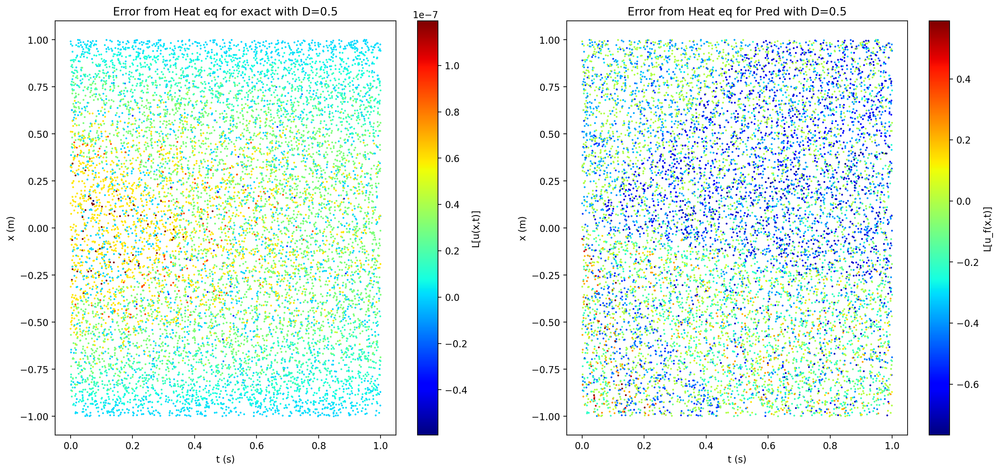

In [ ]:
fig, axs = plt.subplots(nrows=1, ncols=2, dpi=200, figsize=(18,8))

im0 = axs[0].scatter(
    coords[:,0], coords[:,1],
    c=heat_true.detach(),
    cmap='jet',
    s = 1.0
)
cbar0 = plt.colorbar(im0, ax=axs[0])
cbar0.set_label('L[u(x,t)]')

axs[0].set_title(f"Error from Heat eq for exact with D={D_param}")
axs[0].set_xlabel('t (s)')
axs[0].set_ylabel('x (m)')

#levels = np.linspace(heat_pred.min().item(), heat_pred.max().item(), 75)
im1 = axs[1].scatter(
    coords[:,0], coords[:,1],
    c=heat_pred.detach(),
    cmap='jet',
    s = 1.0
)
cbar1 = plt.colorbar(im1, ax=axs[1])
cbar1.set_label('L[u_f(x,t)]')

axs[1].set_title(f"Error from Heat eq for Pred with D={D_param}")
axs[1].set_xlabel('t (s)')
axs[1].set_ylabel('x (m)')

plt.show()

## 3. Boundary Conditions

In [ ]:
class Heat_1D_BC:
    def __init__(
        self,
        cost_function = nn.MSELoss()
    ):
        # Cost function
        self.cost_function = cost_function

    def boundary_cond(self, coords: torch.Tensor, pred_func: torch.Tensor) -> torch.Tensor:
        """
        Class for computing BC
            u(t, x=±1) = 0

        Args:
             coords    (torch.Tensor) : The coords at the spatial boundary
             pred_func (torch.Tensor) : The predicted function at those points
        Returns
             bc_loss (torch.tensor)
        """
        true_b  = torch.zeros_like(pred_func)
        bc_loss = self.cost_function(pred_func, true_b)

        return torch.mean( bc_loss )

    def initial_cond(self, coords: torch.Tensor, pred_func: torch.Tensor) -> torch.Tensor:
        """
        Class for computing IC
            u(x, t=0) = cos(π x/2)

        Args:
             coords    (torch.Tensor) : The coords at the Initial Time
             pred_func (torch.Tensor) : The predicted function at those points
        Returns
             ic_loss (torch.tensor)
        """
        pi_fact = float(torch.pi/2)
        x = coords[:, 1].detach().cpu().numpy()
        true_b  = np.cos(pi_fact*x)

        ic_loss = self.cost_function(pred_func, torch.tensor(true_b, requires_grad=False).unsqueeze(-1).to(pred_func.device) )

        return torch.mean( ic_loss )

### 3.0 Test Boundary Class

True Initial Condition: 3.2716078487435914e-16
Pred Initial Condition: 0.9261643290519714

True Boundary Condition: 1.09600578836373e-15
Pred Boundary Condition: 0.3442102372646332


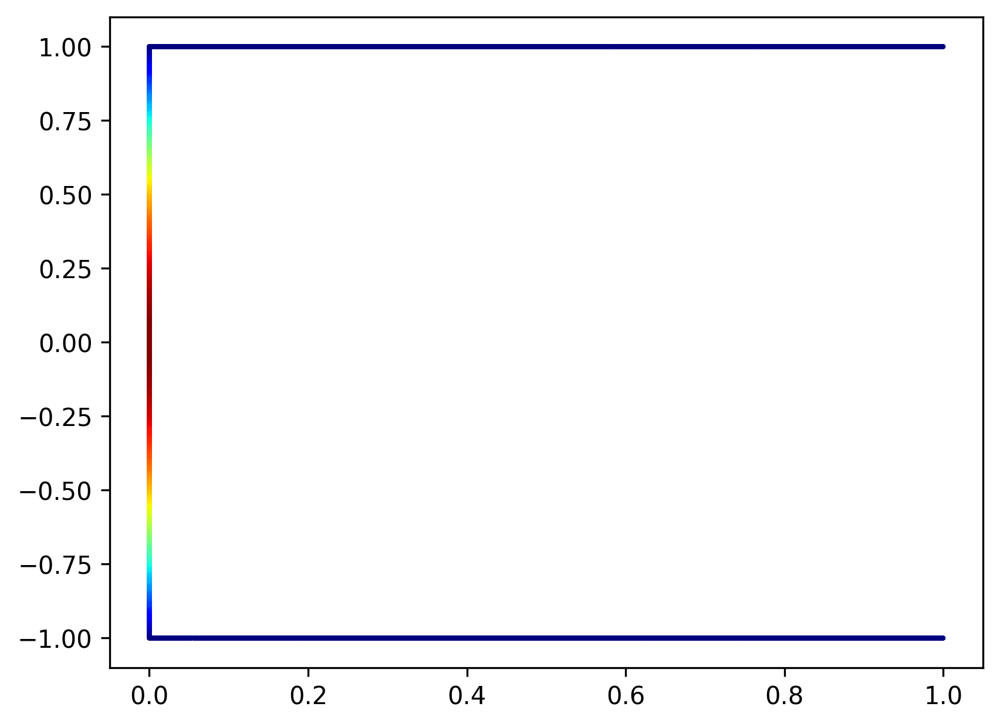

In [ ]:
"""
    Test the BC_PDE class
"""
D_param = 0.5

test_bc = Heat_1D_BC( )
model_try = PINN_DNN(n_inputs=2, n_outputs=1, hidden_dims=[4,8,4])

N_POINTS = 10000
ic_coords = torch.cat( (
      torch.zeros(N_POINTS).unsqueeze(-1),      # t
      2*torch.rand(N_POINTS).unsqueeze(-1) - 1  # x
    ),
    dim=-1
)

X = Variable(ic_coords, requires_grad=True)
pred_func_ic = model_try(X)
true_func_ic = exact_solution_func(X, diffusion_param=D_param)

heat_ic_true = test_bc.initial_cond(X, true_func_ic.unsqueeze(-1))
heat_ic_pred = test_bc.initial_cond(X, pred_func_ic)

print(f"True Initial Condition: {heat_ic_true}")
print(f"Pred Initial Condition: {heat_ic_pred}\n")


bc_coords_p = torch.cat( (
      torch.rand(N_POINTS//2).unsqueeze(-1), # t
      +torch.ones(N_POINTS//2).unsqueeze(-1)  # x
    ),
    dim=-1
)
bc_coords_m = torch.cat( (
      torch.rand(N_POINTS//2).unsqueeze(-1), # t
      -torch.ones(N_POINTS//2).unsqueeze(-1)  # x
    ),
    dim=-1
)
bc_coords = torch.cat([bc_coords_p, bc_coords_m])
X = Variable(bc_coords, requires_grad=True)
pred_func_bc = model_try(X)
true_func_bc = exact_solution_func(X, diffusion_param=D_param)
heat_bc_true = test_bc.boundary_cond(X, true_func_bc)
heat_bc_pred = test_bc.boundary_cond(X, pred_func_bc)

print(f"True Boundary Condition: {heat_bc_true}")
print(f"Pred Boundary Condition: {heat_bc_pred}")

plt.figure(dpi=300)
plt.scatter( ic_coords[:, 0], ic_coords[:, 1], c=true_func_ic.detach().squeeze().cpu(), s=1, cmap='jet' )
plt.scatter( bc_coords[:, 0], bc_coords[:, 1], c=true_func_bc.detach().squeeze().cpu(), s=1, cmap='jet', vmin=0, vmax=1 )
plt.show()

## 4. Assemble PINN model

#### Soft Adapt:

Here we have a total loss which is a weighted sum of multiple terms:
$$\mathcal{L} = w_{rec} \mathcal{L}_{rec} (u, u_{t}) + w_{pde} \mathcal{L}_{pde} (u_t) + w_{bc} \mathcal{L}_{bc} (u_t)$$

The idea of SoftAdapt is to see the $w=w(i)$ as function of the epoch $i$; let us say $a = {rec, pde, bc}$. Then
$$w_a (i) = \text{softmax} \left[ \frac{L_a (i)}{L_a (i-1) +\epsilon} - \mu(i)   \right]$$
where $L_a(i)$ is the $a-$loss at epoch $i$, $\epsilon$ a small parameter to prevend division by zero, and
$$\mu(i) = \max_a \frac{L_a (i)}{L_a (i-1)}$$

#### Learning rate annealing:

$$\mathcal{L} \supseteq \mathcal{L}_{pde} (u_t) + w_{bc} \mathcal{L}_{bc} (u_t)$$

we can have a dynamical $w_{bc}$ obtained by an exponential moving average, controlled by an hyperparameter $\alpha$; in fact, we first compute

$$\bar w = \frac{\max |\nabla_\theta \mathcal{L}_{pde} (\theta) |}{ \text{mean} |\nabla_\theta \mathcal{L}_{bc} (\theta) |}$$
where $\theta$ indicates the set of DNN model parameters; then, the $w_{bc} (i)$ is given by
$$w_{bc} (i) = \alpha \bar w + (1-\alpha) w_{bc} (i-1)$$

--------------
Refs:

[1] https://towardsdatascience.com/improving-pinns-through-adaptive-loss-balancing-55662759e701 , https://github.com/rbischof/relative_balancing , https://arxiv.org/abs/2110.09813

[2] https://docs.nvidia.com/deeplearning/modulus/modulus-v2209/user_guide/theory/advanced_schemes.html#softadapt , original paper: https://arxiv.org/pdf/1912.12355.pdf

[3] https://docs.nvidia.com/deeplearning/modulus/modulus-v2209/user_guide/theory/advanced_schemes.html#learning-rate-annealing . original paper https://arxiv.org/pdf/2001.04536.pdf



In [ ]:
import json

def write_line_to_file(LOG_FILE: str, log_line: str):
    with open(LOG_FILE, 'a') as f:
        f.write(log_line)

def store_hyp_dict(json_file: str, hyperparam_kwargs: dict, _indent: int = 4):
    with open(json_file, 'w') as fp:
        json.dump(hyperparam_kwargs, fp, indent=_indent)

In [ ]:
# Checkpoints (to save model parameters during training)
# this is implemented by writing a python class that uses the torch.save method
class SaveBestModel:
    def __init__(
        self,
        model_name: str = 'best_model',
        best_valid_loss=float('inf')
    ): #object initialized with best_loss = +infinite
        self.best_valid_loss = best_valid_loss
        self.model_name = model_name

    def __call__(
        self, current_valid_loss,
        epoch, model, optimizer, criterion
    ):
        if current_valid_loss < self.best_valid_loss:
            self.best_valid_loss = current_valid_loss
            print(f"\nBest validation loss: {self.best_valid_loss}")
            print(f"\nSaving best model for epoch: {epoch}\n")
            # method to save a model (the state_dict: a python dictionary object that
            # maps each layer to its parameter tensor) and other useful parametrers
            # see: https://pytorch.org/tutorials/beginner/saving_loading_models.html
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'loss': criterion,
                }, f'{self.model_name}.pth')

In [ ]:
import datetime
import time

class PINN(nn.Module):
    """
    Full PINN Class for the FORWARD problem.

    It incorporates:
        1. The PINN DNN (in self.DNN)
        2. The PDE      (in self._PDE)
        3. The BC       (in self._BC)

    It exposes the train_model() method to solve the PINN forward problem, by Performing a training with ADAM optimiser

    The train_model() method is thus:
        1. ADAM loop
            1.1. call training_step() for adam
            1.2. Store best model
            1.3. Perform step for learning rate stepper
            1.4. Logs
            1.5. Check if patience reached;

    Args:
        For Args see init method.

    Methods:
        init_model      ()  : init the model.
        load_best_model ()  : reload the best model.
        forward         (x) : DNN Forward passing
        pde_loss        (x, pred_funcs) : Compute PDE loss using self.cost_function
        ic_loss         (x, pred_funcs) : Compute IC  loss using BC class
        bc_loss         (x, pred_funcs) : Compute BC  loss using BC class
        soft_adapt      (losses, previous_losses, eps = 1e-8) : perform SoftAdapt algorithm.
        generate_coords ()  : generate the coords
        closure         ()  : method performing the backprop. Fundamental for L-BFGS part, it is also used for ADAM.
        training_step   (epoch, use_adam)   : Single training step.
        train_model     ()  : Main method. Trains the model.
        store_training_df   ()  : utils method to store the training history as csv
    """
    def __init__(
        self,
        use_rec: bool = True, # parameter to flag False if PINN solve PDE without reconstruction info
        # DNN
        n_inputs : int = 2,      # number of inputs, e.g. x,y,z,t,....
        n_outputs: int = 1,      # number of outputs, e.g. u,v,P, T, ....
        hidden_layers: list = [4, 8, 16, 8], # number of hidden layers
        dropout: float = 0.2,  # Dropout
        activation_func = nn.Tanh(),
        learning_rate: float = 0.001,
        # True func
        exact_solution_func = exact_solution_func,
        # Geometry
        time_interval : list = [0.0,  +1.0] ,
        space_interval: list = [-1.0, +1.0] ,
        # PDE
        diffusion_coefficient: float = 0.5,     # PDE coefficient
        # Training
        patience_training: int = 200,
        epochs: int = 1000,
        N_batches: int = 32,
        patience_lr: int = 50,
        # Soft adapt
        use_softadapt : bool = False,
        softadapt_starting_epoch : int = 5,
        # Loss weights
        weight_rec: float = 1.0,
        weight_pde: float = 1.0,
        weight_bc : float = 1.0,
        weight_ic : float = 1.0,
        # dataloaders
        fun_batch_size: int = 4096,
        pde_batch_size: int = 4096,
        bc_batch_size: int = 1024,
        ic_batch_size: int = 1024,
        # device
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu"),
        # Model name
        BASE_PATH_TO_STORE: str = '.',
        model_name: str = 'pinne_heat',
    ):
        """
        Init method.

        Args:
            use_rec     (bool, optional)    : Boolean to pick if rec_loss should be used. Defaults to True.
            n_inputs    (int, optional)     : Number of DNN inputs. Defaults to 2.
            n_outputs   (int, optional)     : Number of DNN outputs. Defaults to 1.
            hidden_layers (list, optional)  : Listof hidden layers dims. Defaults to [4, 8, 16, 8].
            learning_rate (float, optional) : Adam Learning rate. Defaults to 0.001.
            exact_solution_func     (function, optional): Method to generate the exact solution. Defaults to exact_solution_func.
            diffusion_coefficient   (float, optional)   : Heat diffusion coefficient. Defaults to 0.5.
            patience_training       (int, optional)     : Patience in ADAM training. Defaults to 200.
            epochs                  (int, optional)     : Total Number of ADAM epochs. Defaults to 1000.
            N_batches               (int, optional)     : Number of ADAM Batches. Defaults to 32.
            patience_lr             (int, optional)     : Patience for LR stepper. Defaults to 50.
            use_softadapt            (bool, optional) : Boolean to decide whether to use SoftAdapt algorithm. Defaults to True,
            softadapt_starting_epoch (int, optional)  : SoftAdapt starting epoch. Defaults to 5.
            weight_rec  (float, optional)   : Reconstruction Loss weight. Defaults to 1.0.
            weight_pde  (float, optional)   : PDE Loss weight. Defaults to 1.0.
            weight_bc   (float, optional)   : BC Loss weight. Defaults to 1.0.
            weight_ic   (float, optional)   : IC Loss weight. Defaults to 1.0.
            fun_batch_size  (int, optional) : Batch Size for computing rec loss. Defaults to 4096.
            pde_batch_size  (int, optional) : Batch Size for computing pde loss. Defaults to 4096.
            bc_batch_size   (int, optional) : Batch Size for computing bc  loss. Defaults to 1024.
            device      (_type_, optional)  : Device. Defaults to torch.device("cuda:0" if torch.cuda.is_available() else "cpu").
            BASE_PATH_TO_STORE  (str, optional) : Path to store training and model data. Defaults to '.'.
            model_name          (str, optional) : Model name. Defaults to 'pinne_heat'.
        """
        super(PINN, self).__init__()
        self.use_rec = use_rec
        # geometry
        self._t_min , self._t_max = time_interval
        self._x_min , self._x_max = space_interval
        # ==== DNN PART ==================
        self.n_inputs      = n_inputs
        self.n_outputs     = n_outputs
        self.hidden_layers = hidden_layers
        self.n_layers      = len(hidden_layers)
        self.dropout_prob  = dropout
        self.activation_func = activation_func
        self.learning_rate = learning_rate
        self.device = device
        # ==== SoftAdapt PART ==================
        self.use_softadapt = use_softadapt
        self.softadapt_starting_epoch = softadapt_starting_epoch if softadapt_starting_epoch >= 2 else 2
        # ====  PDE params PART ==================
        self.diffusion_coefficient = diffusion_coefficient
        self.exact_solution_func   = exact_solution_func

        # ==== PINN-DNN PART ==================
        # Dataloader
        self.fun_batch_size = fun_batch_size
        self.pde_batch_size = pde_batch_size
        self.ic_batch_size  = ic_batch_size
        self.bc_batch_size  = bc_batch_size
        self.N_batches   = N_batches
        # training vars
        self.patience_training = patience_training
        self.epochs = epochs
        self.patience_lr     = patience_lr
        # Loss weights
        self.weight_rec = weight_rec
        self.weight_pde = weight_pde
        self.weight_bc  = weight_bc
        self.weight_ic  = weight_ic
        # DNN
        self.model_kwargs = {
           "n_inputs"     : self.n_inputs,
            "n_outputs"   : self.n_outputs,
            "hidden_dims" : self.hidden_layers,
            "dropout"     : self.dropout_prob,
        }
        self.init_model()
        # Optimisers
        self.optimizer = torch.optim.Adam(
            self.DNN.parameters(),
            lr=self.learning_rate,
        )
        # LR scheduler
        self.lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            self.optimizer,
            mode='min',
            factor  = 0.1, # Factor by which the learning rate will be reduced. new_lr = lr * factor. Default: 0.1.
            patience= self.patience_lr, #  Number of epochs with no improvement after which learning rate will be reduced.
        )

        # cost function
        self.cost_function = nn.MSELoss() # Mean squared error

        # ==== PDE PART ==================
        # PDE+BC
        self._PDE = Heat_1D_PDE(D=self.diffusion_coefficient)
        self._BC  = Heat_1D_BC(
            cost_function = self.cost_function
        )

        # save best model
        self.BASE_PATH_TO_STORE = BASE_PATH_TO_STORE
        self.model_name = model_name
        self.full_path_to_store = f"{BASE_PATH_TO_STORE}/{model_name}"
        self.save_best_model = SaveBestModel(model_name=self.full_path_to_store) #initialize checkpoint function

        # Storing
        # === STORE HYPERPARAMETERS =====
        self.hyperparam_kwargs = {
            # Model kwargs
            **self.model_kwargs,
            "activation_func" : f"{self.activation_func}",
            # Dataset info
            'train_size': (self.pde_batch_size+self.bc_batch_size)*self.epochs,
            # Hyperparameters
            'epochs'   : self.epochs,
            'patience' : self.patience_training,
            'lr_patience': self.patience_lr
        }
        store_hyp_dict(f'{self.full_path_to_store}.json', self.hyperparam_kwargs)
        # logs
        self.LOG_FILE = f"{self.full_path_to_store}.txt"

        # === Training vars =====
        self.training_rec_loss = []
        self.training_pde_loss = []
        self.training_bc_loss  = []
        self.training_ic_loss  = []

        self.training_loss   = []
        self.learning_rates  = []

        self.weight_rec_history = []
        self.weight_pde_history = []
        self.weight_bc_history  = []
        self.weight_ic_history  = []

        self.Delta_training = 0 # Delta value for L-FBGS traingin

        self.current_epoch = 0 # store current epoch to pass to closure for soft-adapt

    def init_model(self):
        self.DNN = PINN_DNN(
            activation_func=self.activation_func,
            **self.model_kwargs,
        ).to(self.device)

    def load_best_model(self):
        try:
            # load the best model
            RELOAD_MODEL_NAME = f"{self.full_path_to_store}.pth"
            checkpoint = torch.load(RELOAD_MODEL_NAME)
            self.init_model()
            self.DNN.load_state_dict(checkpoint['model_state_dict'])
            print(f"Loaded best model: {RELOAD_MODEL_NAME} at epoch: {checkpoint['epoch']}\n")
        except Exception as e:
            print(f"Impossible to load {RELOAD_MODEL_NAME}\nError: {e}\n")
            pass

    def forward(self, x):
        """
        Forward step via DNN
        """
        pred_funcs = self.DNN(x)
        return pred_funcs

    def pde_loss(self, x, pred_funcs):
        """
        Method to compute the PDE loss;
        the PDE class gives the evaluation of the LHS of the PDE system, i.e.
            PDE[u](t,x) = 0
        Here we use the cost function to compute the loss.
        """
        heat_eq = self._PDE.compute_heat(x, pred_funcs)

        # The PDE loss is the mean of the squared (0 - PDE)^2 -- see nVidia Modulus example docs
        loss_pde  = self.cost_function(
            heat_eq,
            torch.zeros_like(heat_eq).to(heat_eq.device)
        )

        return loss_pde

    def bc_loss(self, x, preds_funcs):
        """
        Method to compute the Boundary Condition Loss.
        It is already implemented into the BC class, so we simply invoke it.
        """
        bc_loss = self._BC.boundary_cond(x, preds_funcs)
        return bc_loss

    def ic_loss(self, x, preds_funcs):
        """
        Method to compute the Initial Condition Loss.
        It is already implemented into the BC class, so we simply invoke it.
        """
        ic_loss = self._BC.initial_cond(x, preds_funcs)
        return ic_loss

    def soft_adapt(self, losses: list, previous_losses: list, eps: float = 1e-8) -> list:
        """
        Performs the softadapt computation:

        Args:
            losses          (list) : list of losses to compute softadapt on
            previous_losses (list) : list of losses at previous step
            eps (float) : Factor to avoid division by zero. Defaults to 1e-8

        Returns
            (list) list of W params
        """
        Li = np.array(losses)
        Lo = np.array(previous_losses)

        _ratio = (Li)/(Lo + eps)
        _mu = np.max(_ratio)

        _ratio = torch.tensor(_ratio, requires_grad=False)

        _w = nn.functional.softmax(_ratio - _mu)

        return _w.tolist()

    def generate_coords(self):
        """
        Method to generate the coords.
        Notice that we have implemented here a RANDOM EXTRACTOR.

        Returns
            coords    (torch.Tensor) : bulk coordinates
            ic_coords (torch.Tensor) : IC coordinates
            bc_coords (torch.Tensor) : BC coordinates
        """
        coords = torch.cat(
            (
                self._t_min + (self._t_max - self._t_min)*torch.rand(self.pde_batch_size).unsqueeze(-1), # t
                self._x_min + (self._x_max - self._x_min)*torch.rand(self.pde_batch_size).unsqueeze(-1)  # x
            ),
            dim=-1
        )
        coords = Variable(coords.float(), requires_grad=True)
        # initial cond
        ic_coords = torch.cat(
            (
                self._t_min * torch.ones(self.ic_batch_size).unsqueeze(-1), # t
                self._x_min + (self._x_max - self._x_min)*torch.rand(self.ic_batch_size).unsqueeze(-1)  # x
            ),
            dim=-1
        )
        # bc
        bc_coords_p = torch.cat(
            (
                self._t_min + (self._t_max - self._t_min)*torch.rand(self.bc_batch_size//2).unsqueeze(-1), # t
                self._x_max*torch.ones(self.bc_batch_size//2).unsqueeze(-1)  # x
            ),
            dim=-1
        )
        bc_coords_m = torch.cat(
            (
                self._t_min + (self._t_max - self._t_min)*torch.rand(self.bc_batch_size//2).unsqueeze(-1), # t
                self._x_min*torch.ones(self.bc_batch_size//2).unsqueeze(-1)  # x
            ),
            dim=-1
        )
        bc_coords = torch.cat([bc_coords_m, bc_coords_p])

        ic_coords = Variable(ic_coords.float(), requires_grad=True)
        bc_coords = Variable(bc_coords.float(), requires_grad=True)
        # to device
        coords     = coords.to(self.device)
        ic_coords  = ic_coords.to(self.device)
        bc_coords  = bc_coords.to(self.device)

        return coords, ic_coords, bc_coords

    def closure(self):
        """
        Example of closure func:

        if torch.is_grad_enabled():
            self.lbfgs_optimizer.zero_grad()
        output = self(X_)
        loss = self.lossFct(output, y_)
        if loss.requires_grad:
            loss.backward()
        return loss
        """
        self.optimizer.zero_grad()
        # =================== random extraction =====================
        # func + pde
        coords, ic_coords, bc_coords = self.generate_coords()
        # =================== forward =====================
        true_funcs = self.exact_solution_func(coords)# true
        pred_funcs = self.forward(coords)            # DNN pred
        pred_ic    = self.forward(ic_coords)         # DNN pred - ic
        pred_bc    = self.forward(bc_coords)         # DNN pred - bc
        # =================== Losses =====================
        pde_loss = self.pde_loss(coords, pred_funcs)                                                                        # PDE loss
        ic_loss  = self.ic_loss(ic_coords, pred_ic)                                                                         # BC loss
        bc_loss  = self.bc_loss(bc_coords, pred_bc)                                                                         # BC loss
        rec_loss = self.cost_function(pred_funcs, true_funcs.unsqueeze(-1)) if self.use_rec else torch.zeros_like(pde_loss) # rec loss
        # =================== soft-adapt =================
        if self.use_softadapt and self.current_epoch >= self.softadapt_starting_epoch:
            if self.use_rec:
                _losses   =  [rec_loss.item(), pde_loss.item(), ic_loss.item(), bc_loss.item() ]
                _p_losses =  [self.training_rec_loss[-1], self.training_pde_loss[-1], self.training_ic_loss[-1], self.training_bc_loss[-1] ]
                self.weight_rec, self.weight_pde, self.weight_ic, self.weight_bc = self.soft_adapt(
                    losses          = _losses ,
                    previous_losses = _p_losses
                )
            else:
                _losses   = [pde_loss.item(), ic_loss.item(), bc_loss.item() ]
                _p_losses = [self.training_pde_loss[-1],  self.training_ic_loss[-1], self.training_bc_loss[-1] ]
                self.weight_pde, self.weight_ic, self.weight_bc = self.soft_adapt(
                    losses          = _losses ,
                    previous_losses = _p_losses
                )

        # full loss
        loss = self.weight_pde * pde_loss + self.weight_ic * ic_loss  + self.weight_bc * bc_loss  # <=== Full loss here ====
        if self.use_rec:
            loss += self.weight_rec * rec_loss
        # Normalise loss
        loss = loss/( self.weight_rec + self.weight_pde + self.weight_ic + self.weight_bc ) if  self.use_rec else  loss/( self.weight_pde + self.weight_ic + self.weight_bc )

        # Append
        self.train_loss += loss.item()
        self.train_rec_loss += rec_loss.item()
        self.train_pde_loss += pde_loss.item()
        self.train_ic_loss  += ic_loss.item()
        self.train_bc_loss  += bc_loss.item()
        #==== backward ======================
        loss.backward(retain_graph=True)

        return loss

    def training_step(self, epoch: int, use_adam: bool = True):
        """
        Single Epoch training step
        """
        # =====================================================
        # Training
        self.DNN.train()
        self.train_loss = 0
        self.train_rec_loss = 0
        self.train_pde_loss = 0
        self.train_ic_loss  = 0
        self.train_bc_loss  = 0
        # =================== Batches iterations - only ADAM =====================
        for _ in tqdm.tqdm(range(self.N_batches)):
            # =================== closure ====================
            self.optimizer.step(self.closure)
        # =================== compute LOSS ====================
        # set divisor for batches
        _divisor = self.N_batches
        # training loss
        tr_loss = self.train_loss/_divisor
        # others
        tr_rec_loss = self.train_rec_loss/_divisor
        tr_pde_loss = self.train_pde_loss/_divisor
        tr_ic_loss  = self.train_ic_loss /_divisor
        tr_bc_loss  = self.train_bc_loss /_divisor
        # === Append Losses ========
        self.training_loss.append(tr_loss) ## Full trainloss
        # others
        self.training_rec_loss.append(tr_rec_loss)
        self.training_pde_loss.append(tr_pde_loss)
        self.training_ic_loss.append(tr_ic_loss)
        self.training_bc_loss.append(tr_bc_loss)
        # append weights
        self.weight_rec_history.append(self.weight_rec)
        self.weight_pde_history.append(self.weight_pde)
        self.weight_ic_history.append(self.weight_ic)
        self.weight_bc_history.append(self.weight_bc)

        return tr_loss

    def train_model(self):
        t0 = time.time()

        self.training_rec_loss = []
        self.training_pde_loss = []
        self.training_ic_loss  = []
        self.training_bc_loss  = []

        self.training_loss   = []
        self.learning_rates  = []
        #==== ADAM TRAINING LOOP ================================================================================
        for epoch in range(0, self.epochs):
            self.current_epoch = epoch
            loss = self.training_step(epoch)

            #=== GO ON ====
            #save best model
            self.save_best_model(loss, epoch, self.DNN, self.optimizer, self.cost_function)

            # Learning Rate stepper
            current_lr = self.optimizer.param_groups[0]['lr']
            self.learning_rates.append(current_lr)
            # update learning rate schedule
            self.lr_scheduler.step(loss) ### NB: ONLY FOR ReduceLROnPlateau

            # =================== log ========================
            log_line = f'====> Epoch: {epoch}\tTraining loss: {loss:.6f}\tlr: {current_lr:.2e}\tTime: {datetime.datetime.now().strftime("%Y-%m-%d_%H:%M:%S")}\n'
            print(log_line)
            write_line_to_file(LOG_FILE=self.LOG_FILE, log_line=log_line)

            # update number of epochs passed
            self.Delta_training += 1
            # Check patience
            if self.patience_training > 0 and len(self.training_loss) - np.array(self.training_loss).argmin() > self.patience_training:
                break_log = f"\nPatience treshold = {self.patience_training} reached.\nExiting at epoch {epoch}.\n"
                print(break_log)
                write_line_to_file(LOG_FILE=self.LOG_FILE, log_line=break_log)
                break

        # Close up
        log_line = f'\n\nTotal ADAM training time: {time.time() - t0}\tEnd time: {datetime.datetime.now().strftime("%Y-%m-%d_%H:%M:%S")}\n\n'
        print(log_line)
        write_line_to_file(LOG_FILE=self.LOG_FILE, log_line=log_line)

        # store history df
        self.store_training_df()

    def store_training_df(self):
        # store as pandas csv
        df_train = pd.DataFrame(
            {
                "epochs"          : [ epoch for epoch in range(len(self.training_loss)) ],
                "training_loss"   : self.training_loss,
                'lr'              : self.learning_rates,
                "rec_train_losses": self.training_rec_loss,
                "pde_train_losses": self.training_pde_loss,
                "ic_train_losses" : self.training_ic_loss,
                "bc_train_losses" : self.training_bc_loss,
                "weight_rec"      : self.weight_rec_history,
                "weight_pde"      : self.weight_pde_history,
                "weight_ic"       : self.weight_ic_history,
                "weight_bc"       : self.weight_bc_history,
            }
        )
        df_train.to_csv(f'{self.BASE_PATH_TO_STORE}/{self.model_name}_history.csv')

### 4.0 Try model implementation

In [ ]:
try:
    from torchsummary import summary
except:
    %pip install torchsummary
    from torchsummary import summary

D_param = 0.5

pinn_model = PINN(
    time_interval = [0.0,  +1.0] ,
    space_interval= [-1.0, +1.0] ,
    diffusion_coefficient = D_param,
    hidden_layers = [
        #128, 128, 128
        #512, 512, 512
        64, 64, 64, 64, 64
    ],
    activation_func=nn.GELU(), #nn.Tanh(),
    exact_solution_func=lambda x: exact_solution_func(x, diffusion_param=D_param) ,
    learning_rate = 0.001,
    BASE_PATH_TO_STORE='./model_data',
    model_name = 'pinne_heat_prova',
    use_rec = False,
    #use_softadapt = False,
    weight_rec = 1.0,
    weight_pde = 1.0,
    weight_bc  = 1.0,
    weight_ic  = 1.0,
    #weight_pde = 0.5,
    #weight_bc  = 1.5,
    #weight_ic  = 4.5,
    pde_batch_size = 4096,
    bc_batch_size  = 4096,
    ic_batch_size  = 4096,
    # Training
    patience_training = 200,
    epochs      = 1000,
    N_batches   = 32,
    patience_lr = 50,
)

print(pinn_model.DNN)

print(f"\n\nTorchSummary:\n")
summary(pinn_model.DNN, input_size=( 2, ), batch_size=4096, device=pinn_model.device.type)

PINN_DNN(
  (activation_func): GELU(approximate='none')
  (network): Sequential(
    (fc0): Linear(in_features=2, out_features=64, bias=False)
    (act_0): GELU(approximate='none')
    (dropout_0): Dropout(p=0.2, inplace=False)
    (fc1): Linear(in_features=64, out_features=64, bias=False)
    (act_1): GELU(approximate='none')
    (dropout_1): Dropout(p=0.2, inplace=False)
    (fc2): Linear(in_features=64, out_features=64, bias=False)
    (act_2): GELU(approximate='none')
    (dropout_2): Dropout(p=0.2, inplace=False)
    (fc3): Linear(in_features=64, out_features=64, bias=False)
    (act_3): GELU(approximate='none')
    (dropout_3): Dropout(p=0.2, inplace=False)
    (fc4): Linear(in_features=64, out_features=64, bias=False)
    (act_4): GELU(approximate='none')
    (dropout_4): Dropout(p=0.2, inplace=False)
    (fc_5): Linear(in_features=64, out_features=1, bias=True)
  )
)


TorchSummary:

----------------------------------------------------------------
        Layer (type)          

## 5. Train model

In [ ]:
pinn_model.train_model()

100%|██████████| 32/32 [00:00<00:00, 81.68it/s]



Best validation loss: 0.19531339267268777

Saving best model for epoch: 0

====> Epoch: 0	Training loss: 0.195313	lr: 1.00e-03	Time: 2023-10-30_08:44:42



100%|██████████| 32/32 [00:00<00:00, 93.54it/s]



Best validation loss: 0.18101525027304888

Saving best model for epoch: 1

====> Epoch: 1	Training loss: 0.181015	lr: 1.00e-03	Time: 2023-10-30_08:44:42



100%|██████████| 32/32 [00:00<00:00, 93.06it/s]



Best validation loss: 0.16840790724381804

Saving best model for epoch: 2

====> Epoch: 2	Training loss: 0.168408	lr: 1.00e-03	Time: 2023-10-30_08:44:43



100%|██████████| 32/32 [00:00<00:00, 102.18it/s]



Best validation loss: 0.15746477479115129

Saving best model for epoch: 3

====> Epoch: 3	Training loss: 0.157465	lr: 1.00e-03	Time: 2023-10-30_08:44:43



100%|██████████| 32/32 [00:00<00:00, 101.90it/s]



Best validation loss: 0.1477751829661429

Saving best model for epoch: 4

====> Epoch: 4	Training loss: 0.147775	lr: 1.00e-03	Time: 2023-10-30_08:44:43



100%|██████████| 32/32 [00:00<00:00, 101.51it/s]



Best validation loss: 0.13838437013328075

Saving best model for epoch: 5

====> Epoch: 5	Training loss: 0.138384	lr: 1.00e-03	Time: 2023-10-30_08:44:44



100%|██████████| 32/32 [00:00<00:00, 101.63it/s]



Best validation loss: 0.12987435748800635

Saving best model for epoch: 6

====> Epoch: 6	Training loss: 0.129874	lr: 1.00e-03	Time: 2023-10-30_08:44:44



100%|██████████| 32/32 [00:00<00:00, 100.90it/s]



Best validation loss: 0.12215890944935381

Saving best model for epoch: 7

====> Epoch: 7	Training loss: 0.122159	lr: 1.00e-03	Time: 2023-10-30_08:44:44



100%|██████████| 32/32 [00:00<00:00, 102.49it/s]



Best validation loss: 0.11459819343872368

Saving best model for epoch: 8

====> Epoch: 8	Training loss: 0.114598	lr: 1.00e-03	Time: 2023-10-30_08:44:45



100%|██████████| 32/32 [00:00<00:00, 99.75it/s] 



Best validation loss: 0.10761041520163417

Saving best model for epoch: 9

====> Epoch: 9	Training loss: 0.107610	lr: 1.00e-03	Time: 2023-10-30_08:44:45



100%|██████████| 32/32 [00:00<00:00, 100.69it/s]



Best validation loss: 0.10156767768785357

Saving best model for epoch: 10

====> Epoch: 10	Training loss: 0.101568	lr: 1.00e-03	Time: 2023-10-30_08:44:45



100%|██████████| 32/32 [00:00<00:00, 102.42it/s]



Best validation loss: 0.09448725497350097

Saving best model for epoch: 11

====> Epoch: 11	Training loss: 0.094487	lr: 1.00e-03	Time: 2023-10-30_08:44:46



100%|██████████| 32/32 [00:00<00:00, 101.24it/s]



Best validation loss: 0.08863962604664266

Saving best model for epoch: 12

====> Epoch: 12	Training loss: 0.088640	lr: 1.00e-03	Time: 2023-10-30_08:44:46



100%|██████████| 32/32 [00:00<00:00, 100.49it/s]



Best validation loss: 0.0836418813560158

Saving best model for epoch: 13

====> Epoch: 13	Training loss: 0.083642	lr: 1.00e-03	Time: 2023-10-30_08:44:46



100%|██████████| 32/32 [00:00<00:00, 102.36it/s]



Best validation loss: 0.07779802149161696

Saving best model for epoch: 14

====> Epoch: 14	Training loss: 0.077798	lr: 1.00e-03	Time: 2023-10-30_08:44:47



100%|██████████| 32/32 [00:00<00:00, 102.69it/s]



Best validation loss: 0.07263643853366375

Saving best model for epoch: 15

====> Epoch: 15	Training loss: 0.072636	lr: 1.00e-03	Time: 2023-10-30_08:44:47



100%|██████████| 32/32 [00:00<00:00, 101.38it/s]



Best validation loss: 0.06746950396336615

Saving best model for epoch: 16

====> Epoch: 16	Training loss: 0.067470	lr: 1.00e-03	Time: 2023-10-30_08:44:47



100%|██████████| 32/32 [00:00<00:00, 102.43it/s]



Best validation loss: 0.06130061601288617

Saving best model for epoch: 17

====> Epoch: 17	Training loss: 0.061301	lr: 1.00e-03	Time: 2023-10-30_08:44:48



100%|██████████| 32/32 [00:00<00:00, 102.37it/s]



Best validation loss: 0.0552393333055079

Saving best model for epoch: 18

====> Epoch: 18	Training loss: 0.055239	lr: 1.00e-03	Time: 2023-10-30_08:44:48



100%|██████████| 32/32 [00:00<00:00, 101.05it/s]



Best validation loss: 0.04982982948422432

Saving best model for epoch: 19

====> Epoch: 19	Training loss: 0.049830	lr: 1.00e-03	Time: 2023-10-30_08:44:48



100%|██████████| 32/32 [00:00<00:00, 102.31it/s]



Best validation loss: 0.045210617245174944

Saving best model for epoch: 20

====> Epoch: 20	Training loss: 0.045211	lr: 1.00e-03	Time: 2023-10-30_08:44:48



100%|██████████| 32/32 [00:00<00:00, 100.34it/s]



Best validation loss: 0.04154036403633654

Saving best model for epoch: 21

====> Epoch: 21	Training loss: 0.041540	lr: 1.00e-03	Time: 2023-10-30_08:44:49



100%|██████████| 32/32 [00:00<00:00, 102.27it/s]



Best validation loss: 0.03865407407283783

Saving best model for epoch: 22

====> Epoch: 22	Training loss: 0.038654	lr: 1.00e-03	Time: 2023-10-30_08:44:49



100%|██████████| 32/32 [00:00<00:00, 100.72it/s]



Best validation loss: 0.03619551379233599

Saving best model for epoch: 23

====> Epoch: 23	Training loss: 0.036196	lr: 1.00e-03	Time: 2023-10-30_08:44:49



100%|██████████| 32/32 [00:00<00:00, 102.40it/s]



Best validation loss: 0.03416939184535295

Saving best model for epoch: 24

====> Epoch: 24	Training loss: 0.034169	lr: 1.00e-03	Time: 2023-10-30_08:44:50



100%|██████████| 32/32 [00:00<00:00, 101.11it/s]



Best validation loss: 0.03251791070215404

Saving best model for epoch: 25

====> Epoch: 25	Training loss: 0.032518	lr: 1.00e-03	Time: 2023-10-30_08:44:50



100%|██████████| 32/32 [00:00<00:00, 99.99it/s]



Best validation loss: 0.030844385968521237

Saving best model for epoch: 26

====> Epoch: 26	Training loss: 0.030844	lr: 1.00e-03	Time: 2023-10-30_08:44:50



100%|██████████| 32/32 [00:00<00:00, 99.40it/s] 



Best validation loss: 0.029452655580826104

Saving best model for epoch: 27

====> Epoch: 27	Training loss: 0.029453	lr: 1.00e-03	Time: 2023-10-30_08:44:51



100%|██████████| 32/32 [00:00<00:00, 93.06it/s]



Best validation loss: 0.027893791964743286

Saving best model for epoch: 28

====> Epoch: 28	Training loss: 0.027894	lr: 1.00e-03	Time: 2023-10-30_08:44:51



100%|██████████| 32/32 [00:00<00:00, 94.57it/s]



Best validation loss: 0.027037864143494517

Saving best model for epoch: 29

====> Epoch: 29	Training loss: 0.027038	lr: 1.00e-03	Time: 2023-10-30_08:44:51



100%|██████████| 32/32 [00:00<00:00, 95.28it/s]



Best validation loss: 0.025737829273566604

Saving best model for epoch: 30

====> Epoch: 30	Training loss: 0.025738	lr: 1.00e-03	Time: 2023-10-30_08:44:52



100%|██████████| 32/32 [00:00<00:00, 95.78it/s]



Best validation loss: 0.024875849543605

Saving best model for epoch: 31

====> Epoch: 31	Training loss: 0.024876	lr: 1.00e-03	Time: 2023-10-30_08:44:52



100%|██████████| 32/32 [00:00<00:00, 93.19it/s]



Best validation loss: 0.02376641338923946

Saving best model for epoch: 32

====> Epoch: 32	Training loss: 0.023766	lr: 1.00e-03	Time: 2023-10-30_08:44:52



100%|██████████| 32/32 [00:00<00:00, 93.57it/s]



Best validation loss: 0.02305335848359391

Saving best model for epoch: 33

====> Epoch: 33	Training loss: 0.023053	lr: 1.00e-03	Time: 2023-10-30_08:44:53



100%|██████████| 32/32 [00:00<00:00, 95.48it/s]



Best validation loss: 0.022443964960984886

Saving best model for epoch: 34

====> Epoch: 34	Training loss: 0.022444	lr: 1.00e-03	Time: 2023-10-30_08:44:53



100%|██████████| 32/32 [00:00<00:00, 94.39it/s]



Best validation loss: 0.02150034566875547

Saving best model for epoch: 35

====> Epoch: 35	Training loss: 0.021500	lr: 1.00e-03	Time: 2023-10-30_08:44:53



100%|██████████| 32/32 [00:00<00:00, 95.76it/s]



Best validation loss: 0.020847934240009636

Saving best model for epoch: 36

====> Epoch: 36	Training loss: 0.020848	lr: 1.00e-03	Time: 2023-10-30_08:44:54



100%|██████████| 32/32 [00:00<00:00, 95.82it/s]



Best validation loss: 0.020272970956284553

Saving best model for epoch: 37

====> Epoch: 37	Training loss: 0.020273	lr: 1.00e-03	Time: 2023-10-30_08:44:54



100%|██████████| 32/32 [00:00<00:00, 95.10it/s]



Best validation loss: 0.0195511961937882

Saving best model for epoch: 38

====> Epoch: 38	Training loss: 0.019551	lr: 1.00e-03	Time: 2023-10-30_08:44:54



100%|██████████| 32/32 [00:00<00:00, 92.41it/s]



Best validation loss: 0.018886246369220316

Saving best model for epoch: 39

====> Epoch: 39	Training loss: 0.018886	lr: 1.00e-03	Time: 2023-10-30_08:44:55



100%|██████████| 32/32 [00:00<00:00, 93.66it/s]



Best validation loss: 0.01831036590738222

Saving best model for epoch: 40

====> Epoch: 40	Training loss: 0.018310	lr: 1.00e-03	Time: 2023-10-30_08:44:55



100%|██████████| 32/32 [00:00<00:00, 91.71it/s]



Best validation loss: 0.017850364441983402

Saving best model for epoch: 41

====> Epoch: 41	Training loss: 0.017850	lr: 1.00e-03	Time: 2023-10-30_08:44:56



100%|██████████| 32/32 [00:00<00:00, 94.56it/s]



Best validation loss: 0.017170880862977356

Saving best model for epoch: 42

====> Epoch: 42	Training loss: 0.017171	lr: 1.00e-03	Time: 2023-10-30_08:44:56



100%|██████████| 32/32 [00:00<00:00, 96.00it/s]



Best validation loss: 0.016747964022215456

Saving best model for epoch: 43

====> Epoch: 43	Training loss: 0.016748	lr: 1.00e-03	Time: 2023-10-30_08:44:56



100%|██████████| 32/32 [00:00<00:00, 92.79it/s]



Best validation loss: 0.016407200775574893

Saving best model for epoch: 44

====> Epoch: 44	Training loss: 0.016407	lr: 1.00e-03	Time: 2023-10-30_08:44:57



100%|██████████| 32/32 [00:00<00:00, 95.06it/s]



Best validation loss: 0.015873309661401436

Saving best model for epoch: 45

====> Epoch: 45	Training loss: 0.015873	lr: 1.00e-03	Time: 2023-10-30_08:44:57



100%|██████████| 32/32 [00:00<00:00, 95.40it/s]



Best validation loss: 0.015318873571231961

Saving best model for epoch: 46

====> Epoch: 46	Training loss: 0.015319	lr: 1.00e-03	Time: 2023-10-30_08:44:57



100%|██████████| 32/32 [00:00<00:00, 95.54it/s]



Best validation loss: 0.014889000536641106

Saving best model for epoch: 47

====> Epoch: 47	Training loss: 0.014889	lr: 1.00e-03	Time: 2023-10-30_08:44:58



100%|██████████| 32/32 [00:00<00:00, 93.42it/s]



Best validation loss: 0.014536323375068605

Saving best model for epoch: 48

====> Epoch: 48	Training loss: 0.014536	lr: 1.00e-03	Time: 2023-10-30_08:44:58



100%|██████████| 32/32 [00:00<00:00, 95.59it/s]



Best validation loss: 0.014146821369649842

Saving best model for epoch: 49

====> Epoch: 49	Training loss: 0.014147	lr: 1.00e-03	Time: 2023-10-30_08:44:58



100%|██████████| 32/32 [00:00<00:00, 90.69it/s]



Best validation loss: 0.013681861804798245

Saving best model for epoch: 50

====> Epoch: 50	Training loss: 0.013682	lr: 1.00e-03	Time: 2023-10-30_08:44:59



100%|██████████| 32/32 [00:00<00:00, 89.81it/s]



Best validation loss: 0.01342399069108069

Saving best model for epoch: 51

====> Epoch: 51	Training loss: 0.013424	lr: 1.00e-03	Time: 2023-10-30_08:44:59



100%|██████████| 32/32 [00:00<00:00, 92.25it/s]



Best validation loss: 0.013135136105120182

Saving best model for epoch: 52

====> Epoch: 52	Training loss: 0.013135	lr: 1.00e-03	Time: 2023-10-30_08:44:59



100%|██████████| 32/32 [00:00<00:00, 90.23it/s]



Best validation loss: 0.01275536441244185

Saving best model for epoch: 53

====> Epoch: 53	Training loss: 0.012755	lr: 1.00e-03	Time: 2023-10-30_08:45:00



100%|██████████| 32/32 [00:00<00:00, 91.93it/s]



Best validation loss: 0.012427637266227975

Saving best model for epoch: 54

====> Epoch: 54	Training loss: 0.012428	lr: 1.00e-03	Time: 2023-10-30_08:45:00



100%|██████████| 32/32 [00:00<00:00, 92.38it/s]



Best validation loss: 0.012108698661904782

Saving best model for epoch: 55

====> Epoch: 55	Training loss: 0.012109	lr: 1.00e-03	Time: 2023-10-30_08:45:00



100%|██████████| 32/32 [00:00<00:00, 89.96it/s]



Best validation loss: 0.011875979631440714

Saving best model for epoch: 56

====> Epoch: 56	Training loss: 0.011876	lr: 1.00e-03	Time: 2023-10-30_08:45:01



100%|██████████| 32/32 [00:00<00:00, 91.34it/s]



Best validation loss: 0.011556878744158894

Saving best model for epoch: 57

====> Epoch: 57	Training loss: 0.011557	lr: 1.00e-03	Time: 2023-10-30_08:45:01



100%|██████████| 32/32 [00:00<00:00, 93.93it/s]



Best validation loss: 0.01137070360709913

Saving best model for epoch: 58

====> Epoch: 58	Training loss: 0.011371	lr: 1.00e-03	Time: 2023-10-30_08:45:01



100%|██████████| 32/32 [00:00<00:00, 88.15it/s]



Best validation loss: 0.011173497448908165

Saving best model for epoch: 59

====> Epoch: 59	Training loss: 0.011173	lr: 1.00e-03	Time: 2023-10-30_08:45:02



100%|██████████| 32/32 [00:00<00:00, 93.61it/s]



Best validation loss: 0.010867754026548937

Saving best model for epoch: 60

====> Epoch: 60	Training loss: 0.010868	lr: 1.00e-03	Time: 2023-10-30_08:45:02



100%|██████████| 32/32 [00:00<00:00, 93.67it/s]



Best validation loss: 0.010671785799786448

Saving best model for epoch: 61

====> Epoch: 61	Training loss: 0.010672	lr: 1.00e-03	Time: 2023-10-30_08:45:02



100%|██████████| 32/32 [00:00<00:00, 90.08it/s]



Best validation loss: 0.01037721085594967

Saving best model for epoch: 62

====> Epoch: 62	Training loss: 0.010377	lr: 1.00e-03	Time: 2023-10-30_08:45:03



100%|██████████| 32/32 [00:00<00:00, 92.76it/s]



Best validation loss: 0.010267348960042

Saving best model for epoch: 63

====> Epoch: 63	Training loss: 0.010267	lr: 1.00e-03	Time: 2023-10-30_08:45:03



100%|██████████| 32/32 [00:00<00:00, 91.90it/s]



Best validation loss: 0.010003881092416123

Saving best model for epoch: 64

====> Epoch: 64	Training loss: 0.010004	lr: 1.00e-03	Time: 2023-10-30_08:45:04



100%|██████████| 32/32 [00:00<00:00, 93.70it/s]



Best validation loss: 0.009855033364146948

Saving best model for epoch: 65

====> Epoch: 65	Training loss: 0.009855	lr: 1.00e-03	Time: 2023-10-30_08:45:04



100%|██████████| 32/32 [00:00<00:00, 92.84it/s]



Best validation loss: 0.009688023186754435

Saving best model for epoch: 66

====> Epoch: 66	Training loss: 0.009688	lr: 1.00e-03	Time: 2023-10-30_08:45:04



100%|██████████| 32/32 [00:00<00:00, 89.34it/s]



Best validation loss: 0.009438766079256311

Saving best model for epoch: 67

====> Epoch: 67	Training loss: 0.009439	lr: 1.00e-03	Time: 2023-10-30_08:45:05



100%|██████████| 32/32 [00:00<00:00, 91.40it/s]



Best validation loss: 0.009346658072900027

Saving best model for epoch: 68

====> Epoch: 68	Training loss: 0.009347	lr: 1.00e-03	Time: 2023-10-30_08:45:05



100%|██████████| 32/32 [00:00<00:00, 94.39it/s]



Best validation loss: 0.009149900812190026

Saving best model for epoch: 69

====> Epoch: 69	Training loss: 0.009150	lr: 1.00e-03	Time: 2023-10-30_08:45:05



100%|██████████| 32/32 [00:00<00:00, 93.16it/s]



Best validation loss: 0.009017688978929073

Saving best model for epoch: 70

====> Epoch: 70	Training loss: 0.009018	lr: 1.00e-03	Time: 2023-10-30_08:45:06



100%|██████████| 32/32 [00:00<00:00, 93.08it/s]



Best validation loss: 0.008884706097887829

Saving best model for epoch: 71

====> Epoch: 71	Training loss: 0.008885	lr: 1.00e-03	Time: 2023-10-30_08:45:06



100%|██████████| 32/32 [00:00<00:00, 94.36it/s]



Best validation loss: 0.008748909807763994

Saving best model for epoch: 72

====> Epoch: 72	Training loss: 0.008749	lr: 1.00e-03	Time: 2023-10-30_08:45:06



100%|██████████| 32/32 [00:00<00:00, 92.87it/s]



Best validation loss: 0.00864906032802537

Saving best model for epoch: 73

====> Epoch: 73	Training loss: 0.008649	lr: 1.00e-03	Time: 2023-10-30_08:45:07



100%|██████████| 32/32 [00:00<00:00, 93.50it/s]



Best validation loss: 0.008518153219483793

Saving best model for epoch: 74

====> Epoch: 74	Training loss: 0.008518	lr: 1.00e-03	Time: 2023-10-30_08:45:07



100%|██████████| 32/32 [00:00<00:00, 93.24it/s]



Best validation loss: 0.008371257543331012

Saving best model for epoch: 75

====> Epoch: 75	Training loss: 0.008371	lr: 1.00e-03	Time: 2023-10-30_08:45:07



100%|██████████| 32/32 [00:00<00:00, 93.46it/s]



Best validation loss: 0.008335196442203596

Saving best model for epoch: 76

====> Epoch: 76	Training loss: 0.008335	lr: 1.00e-03	Time: 2023-10-30_08:45:08



100%|██████████| 32/32 [00:00<00:00, 92.26it/s]



Best validation loss: 0.008217453461838886

Saving best model for epoch: 77

====> Epoch: 77	Training loss: 0.008217	lr: 1.00e-03	Time: 2023-10-30_08:45:08



100%|██████████| 32/32 [00:00<00:00, 92.60it/s]



Best validation loss: 0.008028099837247282

Saving best model for epoch: 78

====> Epoch: 78	Training loss: 0.008028	lr: 1.00e-03	Time: 2023-10-30_08:45:08



100%|██████████| 32/32 [00:00<00:00, 92.63it/s]



Best validation loss: 0.007986276788869873

Saving best model for epoch: 79

====> Epoch: 79	Training loss: 0.007986	lr: 1.00e-03	Time: 2023-10-30_08:45:09



100%|██████████| 32/32 [00:00<00:00, 93.12it/s]



Best validation loss: 0.007921819007606246

Saving best model for epoch: 80

====> Epoch: 80	Training loss: 0.007922	lr: 1.00e-03	Time: 2023-10-30_08:45:09



100%|██████████| 32/32 [00:00<00:00, 92.93it/s]



Best validation loss: 0.007865289589972235

Saving best model for epoch: 81

====> Epoch: 81	Training loss: 0.007865	lr: 1.00e-03	Time: 2023-10-30_08:45:09



100%|██████████| 32/32 [00:00<00:00, 91.82it/s]



Best validation loss: 0.007752121629891917

Saving best model for epoch: 82

====> Epoch: 82	Training loss: 0.007752	lr: 1.00e-03	Time: 2023-10-30_08:45:10



100%|██████████| 32/32 [00:00<00:00, 92.94it/s]



Best validation loss: 0.0076314628386171535

Saving best model for epoch: 83

====> Epoch: 83	Training loss: 0.007631	lr: 1.00e-03	Time: 2023-10-30_08:45:10



100%|██████████| 32/32 [00:00<00:00, 93.04it/s]


====> Epoch: 84	Training loss: 0.007642	lr: 1.00e-03	Time: 2023-10-30_08:45:11



100%|██████████| 32/32 [00:00<00:00, 90.40it/s]



Best validation loss: 0.007551457965746522

Saving best model for epoch: 85

====> Epoch: 85	Training loss: 0.007551	lr: 1.00e-03	Time: 2023-10-30_08:45:11



100%|██████████| 32/32 [00:00<00:00, 95.69it/s]



Best validation loss: 0.00749428833660204

Saving best model for epoch: 86

====> Epoch: 86	Training loss: 0.007494	lr: 1.00e-03	Time: 2023-10-30_08:45:11



100%|██████████| 32/32 [00:00<00:00, 95.34it/s]



Best validation loss: 0.0074582709930837154

Saving best model for epoch: 87

====> Epoch: 87	Training loss: 0.007458	lr: 1.00e-03	Time: 2023-10-30_08:45:12



100%|██████████| 32/32 [00:00<00:00, 95.33it/s]



Best validation loss: 0.00738665577955544

Saving best model for epoch: 88

====> Epoch: 88	Training loss: 0.007387	lr: 1.00e-03	Time: 2023-10-30_08:45:12



100%|██████████| 32/32 [00:00<00:00, 95.47it/s]


====> Epoch: 89	Training loss: 0.007407	lr: 1.00e-03	Time: 2023-10-30_08:45:12



100%|██████████| 32/32 [00:00<00:00, 95.43it/s]



Best validation loss: 0.007287686355994083

Saving best model for epoch: 90

====> Epoch: 90	Training loss: 0.007288	lr: 1.00e-03	Time: 2023-10-30_08:45:13



100%|██████████| 32/32 [00:00<00:00, 95.43it/s]



Best validation loss: 0.007232190560898744

Saving best model for epoch: 91

====> Epoch: 91	Training loss: 0.007232	lr: 1.00e-03	Time: 2023-10-30_08:45:13



100%|██████████| 32/32 [00:00<00:00, 94.44it/s]



Best validation loss: 0.007195722384494729

Saving best model for epoch: 92

====> Epoch: 92	Training loss: 0.007196	lr: 1.00e-03	Time: 2023-10-30_08:45:13



100%|██████████| 32/32 [00:00<00:00, 100.20it/s]



Best validation loss: 0.0071272215427597985

Saving best model for epoch: 93

====> Epoch: 93	Training loss: 0.007127	lr: 1.00e-03	Time: 2023-10-30_08:45:14



100%|██████████| 32/32 [00:00<00:00, 100.03it/s]



Best validation loss: 0.007052122542518191

Saving best model for epoch: 94

====> Epoch: 94	Training loss: 0.007052	lr: 1.00e-03	Time: 2023-10-30_08:45:14



100%|██████████| 32/32 [00:00<00:00, 100.33it/s]


====> Epoch: 95	Training loss: 0.007077	lr: 1.00e-03	Time: 2023-10-30_08:45:14



100%|██████████| 32/32 [00:00<00:00, 102.01it/s]



Best validation loss: 0.007019009790383279

Saving best model for epoch: 96

====> Epoch: 96	Training loss: 0.007019	lr: 1.00e-03	Time: 2023-10-30_08:45:15



100%|██████████| 32/32 [00:00<00:00, 98.30it/s] 


====> Epoch: 97	Training loss: 0.007035	lr: 1.00e-03	Time: 2023-10-30_08:45:15



100%|██████████| 32/32 [00:00<00:00, 99.97it/s] 



Best validation loss: 0.007004987128311768

Saving best model for epoch: 98

====> Epoch: 98	Training loss: 0.007005	lr: 1.00e-03	Time: 2023-10-30_08:45:15



100%|██████████| 32/32 [00:00<00:00, 102.03it/s]



Best validation loss: 0.006970409405766986

Saving best model for epoch: 99

====> Epoch: 99	Training loss: 0.006970	lr: 1.00e-03	Time: 2023-10-30_08:45:16



100%|██████████| 32/32 [00:00<00:00, 100.06it/s]



Best validation loss: 0.0069233121030265465

Saving best model for epoch: 100

====> Epoch: 100	Training loss: 0.006923	lr: 1.00e-03	Time: 2023-10-30_08:45:16



100%|██████████| 32/32 [00:00<00:00, 101.34it/s]



Best validation loss: 0.006870443336083554

Saving best model for epoch: 101

====> Epoch: 101	Training loss: 0.006870	lr: 1.00e-03	Time: 2023-10-30_08:45:16



100%|██████████| 32/32 [00:00<00:00, 101.77it/s]



Best validation loss: 0.006834146013716236

Saving best model for epoch: 102

====> Epoch: 102	Training loss: 0.006834	lr: 1.00e-03	Time: 2023-10-30_08:45:17



100%|██████████| 32/32 [00:00<00:00, 101.56it/s]



Best validation loss: 0.0067804661666741595

Saving best model for epoch: 103

====> Epoch: 103	Training loss: 0.006780	lr: 1.00e-03	Time: 2023-10-30_08:45:17



100%|██████████| 32/32 [00:00<00:00, 99.05it/s]



Best validation loss: 0.0067554854322224855

Saving best model for epoch: 104

====> Epoch: 104	Training loss: 0.006755	lr: 1.00e-03	Time: 2023-10-30_08:45:17



100%|██████████| 32/32 [00:00<00:00, 102.10it/s]



Best validation loss: 0.006750418193405494

Saving best model for epoch: 105

====> Epoch: 105	Training loss: 0.006750	lr: 1.00e-03	Time: 2023-10-30_08:45:17



100%|██████████| 32/32 [00:00<00:00, 101.81it/s]



Best validation loss: 0.006732242560246959

Saving best model for epoch: 106

====> Epoch: 106	Training loss: 0.006732	lr: 1.00e-03	Time: 2023-10-30_08:45:18



100%|██████████| 32/32 [00:00<00:00, 99.06it/s]



Best validation loss: 0.006715880590490997

Saving best model for epoch: 107

====> Epoch: 107	Training loss: 0.006716	lr: 1.00e-03	Time: 2023-10-30_08:45:18



100%|██████████| 32/32 [00:00<00:00, 101.65it/s]



Best validation loss: 0.0066600494319573045

Saving best model for epoch: 108

====> Epoch: 108	Training loss: 0.006660	lr: 1.00e-03	Time: 2023-10-30_08:45:18



100%|██████████| 32/32 [00:00<00:00, 99.96it/s] 


====> Epoch: 109	Training loss: 0.006665	lr: 1.00e-03	Time: 2023-10-30_08:45:19



100%|██████████| 32/32 [00:00<00:00, 101.43it/s]


====> Epoch: 110	Training loss: 0.006673	lr: 1.00e-03	Time: 2023-10-30_08:45:19



100%|██████████| 32/32 [00:00<00:00, 101.62it/s]


====> Epoch: 111	Training loss: 0.006671	lr: 1.00e-03	Time: 2023-10-30_08:45:19



100%|██████████| 32/32 [00:00<00:00, 99.70it/s] 



Best validation loss: 0.006619491017772816

Saving best model for epoch: 112

====> Epoch: 112	Training loss: 0.006619	lr: 1.00e-03	Time: 2023-10-30_08:45:20



100%|██████████| 32/32 [00:00<00:00, 99.10it/s] 



Best validation loss: 0.0065236757072852924

Saving best model for epoch: 113

====> Epoch: 113	Training loss: 0.006524	lr: 1.00e-03	Time: 2023-10-30_08:45:20



100%|██████████| 32/32 [00:00<00:00, 101.96it/s]


====> Epoch: 114	Training loss: 0.006533	lr: 1.00e-03	Time: 2023-10-30_08:45:20



100%|██████████| 32/32 [00:00<00:00, 99.21it/s] 


====> Epoch: 115	Training loss: 0.006528	lr: 1.00e-03	Time: 2023-10-30_08:45:21



100%|██████████| 32/32 [00:00<00:00, 97.13it/s]



Best validation loss: 0.006484727331553586

Saving best model for epoch: 116

====> Epoch: 116	Training loss: 0.006485	lr: 1.00e-03	Time: 2023-10-30_08:45:21



100%|██████████| 32/32 [00:00<00:00, 102.18it/s]



Best validation loss: 0.006445165578043088

Saving best model for epoch: 117

====> Epoch: 117	Training loss: 0.006445	lr: 1.00e-03	Time: 2023-10-30_08:45:21



100%|██████████| 32/32 [00:00<00:00, 101.53it/s]


====> Epoch: 118	Training loss: 0.006495	lr: 1.00e-03	Time: 2023-10-30_08:45:22



100%|██████████| 32/32 [00:00<00:00, 100.63it/s]


====> Epoch: 119	Training loss: 0.006489	lr: 1.00e-03	Time: 2023-10-30_08:45:22



100%|██████████| 32/32 [00:00<00:00, 98.69it/s]


====> Epoch: 120	Training loss: 0.006456	lr: 1.00e-03	Time: 2023-10-30_08:45:22



100%|██████████| 32/32 [00:00<00:00, 101.42it/s]



Best validation loss: 0.006410422007320449

Saving best model for epoch: 121

====> Epoch: 121	Training loss: 0.006410	lr: 1.00e-03	Time: 2023-10-30_08:45:23



100%|██████████| 32/32 [00:00<00:00, 97.96it/s]



Best validation loss: 0.006394018229912035

Saving best model for epoch: 122

====> Epoch: 122	Training loss: 0.006394	lr: 1.00e-03	Time: 2023-10-30_08:45:23



100%|██████████| 32/32 [00:00<00:00, 97.72it/s]



Best validation loss: 0.006389734568074346

Saving best model for epoch: 123

====> Epoch: 123	Training loss: 0.006390	lr: 1.00e-03	Time: 2023-10-30_08:45:23



100%|██████████| 32/32 [00:00<00:00, 102.13it/s]



Best validation loss: 0.006343230081256479

Saving best model for epoch: 124

====> Epoch: 124	Training loss: 0.006343	lr: 1.00e-03	Time: 2023-10-30_08:45:24



100%|██████████| 32/32 [00:00<00:00, 101.70it/s]



Best validation loss: 0.006333665674901567

Saving best model for epoch: 125

====> Epoch: 125	Training loss: 0.006334	lr: 1.00e-03	Time: 2023-10-30_08:45:24



100%|██████████| 32/32 [00:00<00:00, 100.67it/s]



Best validation loss: 0.0062958201742731035

Saving best model for epoch: 126

====> Epoch: 126	Training loss: 0.006296	lr: 1.00e-03	Time: 2023-10-30_08:45:24



100%|██████████| 32/32 [00:00<00:00, 101.83it/s]


====> Epoch: 127	Training loss: 0.006302	lr: 1.00e-03	Time: 2023-10-30_08:45:25



100%|██████████| 32/32 [00:00<00:00, 98.55it/s] 



Best validation loss: 0.006275657331570983

Saving best model for epoch: 128

====> Epoch: 128	Training loss: 0.006276	lr: 1.00e-03	Time: 2023-10-30_08:45:25



100%|██████████| 32/32 [00:00<00:00, 96.07it/s] 


====> Epoch: 129	Training loss: 0.006298	lr: 1.00e-03	Time: 2023-10-30_08:45:25



100%|██████████| 32/32 [00:00<00:00, 101.18it/s]


====> Epoch: 130	Training loss: 0.006280	lr: 1.00e-03	Time: 2023-10-30_08:45:26



100%|██████████| 32/32 [00:00<00:00, 99.04it/s] 



Best validation loss: 0.006272653874475509

Saving best model for epoch: 131

====> Epoch: 131	Training loss: 0.006273	lr: 1.00e-03	Time: 2023-10-30_08:45:26



100%|██████████| 32/32 [00:00<00:00, 100.85it/s]



Best validation loss: 0.006245486365514807

Saving best model for epoch: 132

====> Epoch: 132	Training loss: 0.006245	lr: 1.00e-03	Time: 2023-10-30_08:45:26



100%|██████████| 32/32 [00:00<00:00, 102.27it/s]



Best validation loss: 0.006204868244822137

Saving best model for epoch: 133

====> Epoch: 133	Training loss: 0.006205	lr: 1.00e-03	Time: 2023-10-30_08:45:27



100%|██████████| 32/32 [00:00<00:00, 100.51it/s]


====> Epoch: 134	Training loss: 0.006241	lr: 1.00e-03	Time: 2023-10-30_08:45:27



100%|██████████| 32/32 [00:00<00:00, 101.67it/s]


====> Epoch: 135	Training loss: 0.006246	lr: 1.00e-03	Time: 2023-10-30_08:45:27



100%|██████████| 32/32 [00:00<00:00, 101.93it/s]



Best validation loss: 0.006175717688165605

Saving best model for epoch: 136

====> Epoch: 136	Training loss: 0.006176	lr: 1.00e-03	Time: 2023-10-30_08:45:27



100%|██████████| 32/32 [00:00<00:00, 101.90it/s]


====> Epoch: 137	Training loss: 0.006185	lr: 1.00e-03	Time: 2023-10-30_08:45:28



100%|██████████| 32/32 [00:00<00:00, 101.80it/s]



Best validation loss: 0.006148969507194124

Saving best model for epoch: 138

====> Epoch: 138	Training loss: 0.006149	lr: 1.00e-03	Time: 2023-10-30_08:45:28



100%|██████████| 32/32 [00:00<00:00, 99.76it/s] 


====> Epoch: 139	Training loss: 0.006151	lr: 1.00e-03	Time: 2023-10-30_08:45:28



100%|██████████| 32/32 [00:00<00:00, 98.27it/s] 



Best validation loss: 0.00610604221583344

Saving best model for epoch: 140

====> Epoch: 140	Training loss: 0.006106	lr: 1.00e-03	Time: 2023-10-30_08:45:29



100%|██████████| 32/32 [00:00<00:00, 101.42it/s]


====> Epoch: 141	Training loss: 0.006119	lr: 1.00e-03	Time: 2023-10-30_08:45:29



100%|██████████| 32/32 [00:00<00:00, 98.98it/s] 


====> Epoch: 142	Training loss: 0.006118	lr: 1.00e-03	Time: 2023-10-30_08:45:29



100%|██████████| 32/32 [00:00<00:00, 101.23it/s]



Best validation loss: 0.006082194187911227

Saving best model for epoch: 143

====> Epoch: 143	Training loss: 0.006082	lr: 1.00e-03	Time: 2023-10-30_08:45:30



100%|██████████| 32/32 [00:00<00:00, 100.86it/s]


====> Epoch: 144	Training loss: 0.006101	lr: 1.00e-03	Time: 2023-10-30_08:45:30



100%|██████████| 32/32 [00:00<00:00, 100.96it/s]


====> Epoch: 145	Training loss: 0.006090	lr: 1.00e-03	Time: 2023-10-30_08:45:30



100%|██████████| 32/32 [00:00<00:00, 102.03it/s]



Best validation loss: 0.0060647528152912855

Saving best model for epoch: 146

====> Epoch: 146	Training loss: 0.006065	lr: 1.00e-03	Time: 2023-10-30_08:45:31



100%|██████████| 32/32 [00:00<00:00, 100.92it/s]



Best validation loss: 0.006058188242604956

Saving best model for epoch: 147

====> Epoch: 147	Training loss: 0.006058	lr: 1.00e-03	Time: 2023-10-30_08:45:31



100%|██████████| 32/32 [00:00<00:00, 102.27it/s]


====> Epoch: 148	Training loss: 0.006119	lr: 1.00e-03	Time: 2023-10-30_08:45:31



100%|██████████| 32/32 [00:00<00:00, 101.66it/s]



Best validation loss: 0.005998016626108438

Saving best model for epoch: 149

====> Epoch: 149	Training loss: 0.005998	lr: 1.00e-03	Time: 2023-10-30_08:45:32



100%|██████████| 32/32 [00:00<00:00, 100.76it/s]



Best validation loss: 0.005997271902742796

Saving best model for epoch: 150

====> Epoch: 150	Training loss: 0.005997	lr: 1.00e-03	Time: 2023-10-30_08:45:32



100%|██████████| 32/32 [00:00<00:00, 102.12it/s]


====> Epoch: 151	Training loss: 0.006010	lr: 1.00e-03	Time: 2023-10-30_08:45:32



100%|██████████| 32/32 [00:00<00:00, 99.60it/s] 


====> Epoch: 152	Training loss: 0.006010	lr: 1.00e-03	Time: 2023-10-30_08:45:33



100%|██████████| 32/32 [00:00<00:00, 100.58it/s]



Best validation loss: 0.00599216393311508

Saving best model for epoch: 153

====> Epoch: 153	Training loss: 0.005992	lr: 1.00e-03	Time: 2023-10-30_08:45:33



100%|██████████| 32/32 [00:00<00:00, 101.58it/s]


====> Epoch: 154	Training loss: 0.006001	lr: 1.00e-03	Time: 2023-10-30_08:45:33



100%|██████████| 32/32 [00:00<00:00, 98.68it/s]



Best validation loss: 0.0059815650165546685

Saving best model for epoch: 155

====> Epoch: 155	Training loss: 0.005982	lr: 1.00e-03	Time: 2023-10-30_08:45:34



100%|██████████| 32/32 [00:00<00:00, 101.43it/s]



Best validation loss: 0.0059552071179496124

Saving best model for epoch: 156

====> Epoch: 156	Training loss: 0.005955	lr: 1.00e-03	Time: 2023-10-30_08:45:34



100%|██████████| 32/32 [00:00<00:00, 101.08it/s]


====> Epoch: 157	Training loss: 0.006001	lr: 1.00e-03	Time: 2023-10-30_08:45:34



100%|██████████| 32/32 [00:00<00:00, 99.24it/s] 



Best validation loss: 0.005936932429904118

Saving best model for epoch: 158

====> Epoch: 158	Training loss: 0.005937	lr: 1.00e-03	Time: 2023-10-30_08:45:35



100%|██████████| 32/32 [00:00<00:00, 97.15it/s] 


====> Epoch: 159	Training loss: 0.005955	lr: 1.00e-03	Time: 2023-10-30_08:45:35



100%|██████████| 32/32 [00:00<00:00, 100.32it/s]



Best validation loss: 0.0059232496278127655

Saving best model for epoch: 160

====> Epoch: 160	Training loss: 0.005923	lr: 1.00e-03	Time: 2023-10-30_08:45:35



100%|██████████| 32/32 [00:00<00:00, 97.53it/s]


====> Epoch: 161	Training loss: 0.005924	lr: 1.00e-03	Time: 2023-10-30_08:45:36



100%|██████████| 32/32 [00:00<00:00, 101.19it/s]


====> Epoch: 162	Training loss: 0.005934	lr: 1.00e-03	Time: 2023-10-30_08:45:36



100%|██████████| 32/32 [00:00<00:00, 101.64it/s]



Best validation loss: 0.005895989335840568

Saving best model for epoch: 163

====> Epoch: 163	Training loss: 0.005896	lr: 1.00e-03	Time: 2023-10-30_08:45:36



100%|██████████| 32/32 [00:00<00:00, 100.78it/s]


====> Epoch: 164	Training loss: 0.005913	lr: 1.00e-03	Time: 2023-10-30_08:45:36



100%|██████████| 32/32 [00:00<00:00, 101.36it/s]



Best validation loss: 0.005888943895115517

Saving best model for epoch: 165

====> Epoch: 165	Training loss: 0.005889	lr: 1.00e-03	Time: 2023-10-30_08:45:37



100%|██████████| 32/32 [00:00<00:00, 101.21it/s]



Best validation loss: 0.005873775051441044

Saving best model for epoch: 166

====> Epoch: 166	Training loss: 0.005874	lr: 1.00e-03	Time: 2023-10-30_08:45:37



100%|██████████| 32/32 [00:00<00:00, 99.08it/s] 


====> Epoch: 167	Training loss: 0.005913	lr: 1.00e-03	Time: 2023-10-30_08:45:37



100%|██████████| 32/32 [00:00<00:00, 101.60it/s]



Best validation loss: 0.005856601710547693

Saving best model for epoch: 168

====> Epoch: 168	Training loss: 0.005857	lr: 1.00e-03	Time: 2023-10-30_08:45:38



100%|██████████| 32/32 [00:00<00:00, 101.88it/s]


====> Epoch: 169	Training loss: 0.005865	lr: 1.00e-03	Time: 2023-10-30_08:45:38



100%|██████████| 32/32 [00:00<00:00, 100.77it/s]



Best validation loss: 0.005824617895996198

Saving best model for epoch: 170

====> Epoch: 170	Training loss: 0.005825	lr: 1.00e-03	Time: 2023-10-30_08:45:38



100%|██████████| 32/32 [00:00<00:00, 101.90it/s]


====> Epoch: 171	Training loss: 0.005863	lr: 1.00e-03	Time: 2023-10-30_08:45:39



100%|██████████| 32/32 [00:00<00:00, 101.39it/s]



Best validation loss: 0.005798188998596743

Saving best model for epoch: 172

====> Epoch: 172	Training loss: 0.005798	lr: 1.00e-03	Time: 2023-10-30_08:45:39



100%|██████████| 32/32 [00:00<00:00, 102.00it/s]


====> Epoch: 173	Training loss: 0.005836	lr: 1.00e-03	Time: 2023-10-30_08:45:39



100%|██████████| 32/32 [00:00<00:00, 99.65it/s] 


====> Epoch: 174	Training loss: 0.005869	lr: 1.00e-03	Time: 2023-10-30_08:45:40



100%|██████████| 32/32 [00:00<00:00, 100.68it/s]


====> Epoch: 175	Training loss: 0.005800	lr: 1.00e-03	Time: 2023-10-30_08:45:40



100%|██████████| 32/32 [00:00<00:00, 101.90it/s]


====> Epoch: 176	Training loss: 0.005851	lr: 1.00e-03	Time: 2023-10-30_08:45:40



100%|██████████| 32/32 [00:00<00:00, 101.91it/s]



Best validation loss: 0.005795254401164129

Saving best model for epoch: 177

====> Epoch: 177	Training loss: 0.005795	lr: 1.00e-03	Time: 2023-10-30_08:45:41



100%|██████████| 32/32 [00:00<00:00, 99.77it/s] 



Best validation loss: 0.005744141264585778

Saving best model for epoch: 178

====> Epoch: 178	Training loss: 0.005744	lr: 1.00e-03	Time: 2023-10-30_08:45:41



100%|██████████| 32/32 [00:00<00:00, 101.83it/s]


====> Epoch: 179	Training loss: 0.005759	lr: 1.00e-03	Time: 2023-10-30_08:45:41



100%|██████████| 32/32 [00:00<00:00, 101.20it/s]


====> Epoch: 180	Training loss: 0.005775	lr: 1.00e-03	Time: 2023-10-30_08:45:42



100%|██████████| 32/32 [00:00<00:00, 101.71it/s]


====> Epoch: 181	Training loss: 0.005788	lr: 1.00e-03	Time: 2023-10-30_08:45:42



100%|██████████| 32/32 [00:00<00:00, 101.88it/s]


====> Epoch: 182	Training loss: 0.005747	lr: 1.00e-03	Time: 2023-10-30_08:45:42



100%|██████████| 32/32 [00:00<00:00, 101.88it/s]



Best validation loss: 0.005722247587982565

Saving best model for epoch: 183

====> Epoch: 183	Training loss: 0.005722	lr: 1.00e-03	Time: 2023-10-30_08:45:43



100%|██████████| 32/32 [00:00<00:00, 101.51it/s]


====> Epoch: 184	Training loss: 0.005726	lr: 1.00e-03	Time: 2023-10-30_08:45:43



100%|██████████| 32/32 [00:00<00:00, 101.85it/s]



Best validation loss: 0.005722225003410131

Saving best model for epoch: 185

====> Epoch: 185	Training loss: 0.005722	lr: 1.00e-03	Time: 2023-10-30_08:45:43



100%|██████████| 32/32 [00:00<00:00, 101.63it/s]


====> Epoch: 186	Training loss: 0.005734	lr: 1.00e-03	Time: 2023-10-30_08:45:44



100%|██████████| 32/32 [00:00<00:00, 101.65it/s]


====> Epoch: 187	Training loss: 0.005726	lr: 1.00e-03	Time: 2023-10-30_08:45:44



100%|██████████| 32/32 [00:00<00:00, 101.76it/s]



Best validation loss: 0.0057101097772829235

Saving best model for epoch: 188

====> Epoch: 188	Training loss: 0.005710	lr: 1.00e-03	Time: 2023-10-30_08:45:44



100%|██████████| 32/32 [00:00<00:00, 101.79it/s]


====> Epoch: 189	Training loss: 0.005711	lr: 1.00e-03	Time: 2023-10-30_08:45:44



100%|██████████| 32/32 [00:00<00:00, 100.96it/s]



Best validation loss: 0.0057093188661383465

Saving best model for epoch: 190

====> Epoch: 190	Training loss: 0.005709	lr: 1.00e-03	Time: 2023-10-30_08:45:45



100%|██████████| 32/32 [00:00<00:00, 102.00it/s]



Best validation loss: 0.005701515285181813

Saving best model for epoch: 191

====> Epoch: 191	Training loss: 0.005702	lr: 1.00e-03	Time: 2023-10-30_08:45:45



100%|██████████| 32/32 [00:00<00:00, 101.75it/s]



Best validation loss: 0.00568009982816875

Saving best model for epoch: 192

====> Epoch: 192	Training loss: 0.005680	lr: 1.00e-03	Time: 2023-10-30_08:45:45



100%|██████████| 32/32 [00:00<00:00, 102.02it/s]



Best validation loss: 0.005677036024280824

Saving best model for epoch: 193

====> Epoch: 193	Training loss: 0.005677	lr: 1.00e-03	Time: 2023-10-30_08:45:46



100%|██████████| 32/32 [00:00<00:00, 102.52it/s]


====> Epoch: 194	Training loss: 0.005710	lr: 1.00e-03	Time: 2023-10-30_08:45:46



100%|██████████| 32/32 [00:00<00:00, 102.06it/s]



Best validation loss: 0.005656102322973311

Saving best model for epoch: 195

====> Epoch: 195	Training loss: 0.005656	lr: 1.00e-03	Time: 2023-10-30_08:45:46



100%|██████████| 32/32 [00:00<00:00, 102.10it/s]



Best validation loss: 0.005651706247590482

Saving best model for epoch: 196

====> Epoch: 196	Training loss: 0.005652	lr: 1.00e-03	Time: 2023-10-30_08:45:47



100%|██████████| 32/32 [00:00<00:00, 102.00it/s]



Best validation loss: 0.005612752298475243

Saving best model for epoch: 197

====> Epoch: 197	Training loss: 0.005613	lr: 1.00e-03	Time: 2023-10-30_08:45:47



100%|██████████| 32/32 [00:00<00:00, 102.01it/s]


====> Epoch: 198	Training loss: 0.005677	lr: 1.00e-03	Time: 2023-10-30_08:45:47



100%|██████████| 32/32 [00:00<00:00, 102.04it/s]


====> Epoch: 199	Training loss: 0.005616	lr: 1.00e-03	Time: 2023-10-30_08:45:48



100%|██████████| 32/32 [00:00<00:00, 99.37it/s] 


====> Epoch: 200	Training loss: 0.005656	lr: 1.00e-03	Time: 2023-10-30_08:45:48



100%|██████████| 32/32 [00:00<00:00, 102.17it/s]


====> Epoch: 201	Training loss: 0.005635	lr: 1.00e-03	Time: 2023-10-30_08:45:48



100%|██████████| 32/32 [00:00<00:00, 102.29it/s]



Best validation loss: 0.005591632521827705

Saving best model for epoch: 202

====> Epoch: 202	Training loss: 0.005592	lr: 1.00e-03	Time: 2023-10-30_08:45:49



100%|██████████| 32/32 [00:00<00:00, 101.83it/s]


====> Epoch: 203	Training loss: 0.005615	lr: 1.00e-03	Time: 2023-10-30_08:45:49



100%|██████████| 32/32 [00:00<00:00, 98.97it/s]


====> Epoch: 204	Training loss: 0.005600	lr: 1.00e-03	Time: 2023-10-30_08:45:49



100%|██████████| 32/32 [00:00<00:00, 101.87it/s]


====> Epoch: 205	Training loss: 0.005610	lr: 1.00e-03	Time: 2023-10-30_08:45:50



100%|██████████| 32/32 [00:00<00:00, 98.71it/s] 


====> Epoch: 206	Training loss: 0.005638	lr: 1.00e-03	Time: 2023-10-30_08:45:50



100%|██████████| 32/32 [00:00<00:00, 102.23it/s]



Best validation loss: 0.00557079105055891

Saving best model for epoch: 207

====> Epoch: 207	Training loss: 0.005571	lr: 1.00e-03	Time: 2023-10-30_08:45:50



100%|██████████| 32/32 [00:00<00:00, 101.80it/s]


====> Epoch: 208	Training loss: 0.005599	lr: 1.00e-03	Time: 2023-10-30_08:45:51



100%|██████████| 32/32 [00:00<00:00, 101.14it/s]



Best validation loss: 0.005548793502384797

Saving best model for epoch: 209

====> Epoch: 209	Training loss: 0.005549	lr: 1.00e-03	Time: 2023-10-30_08:45:51



100%|██████████| 32/32 [00:00<00:00, 102.05it/s]



Best validation loss: 0.005535066171432845

Saving best model for epoch: 210

====> Epoch: 210	Training loss: 0.005535	lr: 1.00e-03	Time: 2023-10-30_08:45:51



100%|██████████| 32/32 [00:00<00:00, 101.95it/s]


====> Epoch: 211	Training loss: 0.005542	lr: 1.00e-03	Time: 2023-10-30_08:45:51



100%|██████████| 32/32 [00:00<00:00, 101.91it/s]


====> Epoch: 212	Training loss: 0.005541	lr: 1.00e-03	Time: 2023-10-30_08:45:52



100%|██████████| 32/32 [00:00<00:00, 101.79it/s]


====> Epoch: 213	Training loss: 0.005536	lr: 1.00e-03	Time: 2023-10-30_08:45:52



100%|██████████| 32/32 [00:00<00:00, 102.25it/s]



Best validation loss: 0.005499391059856862

Saving best model for epoch: 214

====> Epoch: 214	Training loss: 0.005499	lr: 1.00e-03	Time: 2023-10-30_08:45:52



100%|██████████| 32/32 [00:00<00:00, 101.99it/s]


====> Epoch: 215	Training loss: 0.005536	lr: 1.00e-03	Time: 2023-10-30_08:45:53



100%|██████████| 32/32 [00:00<00:00, 102.16it/s]


====> Epoch: 216	Training loss: 0.005532	lr: 1.00e-03	Time: 2023-10-30_08:45:53



100%|██████████| 32/32 [00:00<00:00, 101.37it/s]



Best validation loss: 0.005495796940522268

Saving best model for epoch: 217

====> Epoch: 217	Training loss: 0.005496	lr: 1.00e-03	Time: 2023-10-30_08:45:53



100%|██████████| 32/32 [00:00<00:00, 101.83it/s]



Best validation loss: 0.005495083110872656

Saving best model for epoch: 218

====> Epoch: 218	Training loss: 0.005495	lr: 1.00e-03	Time: 2023-10-30_08:45:54



100%|██████████| 32/32 [00:00<00:00, 101.86it/s]


====> Epoch: 219	Training loss: 0.005500	lr: 1.00e-03	Time: 2023-10-30_08:45:54



100%|██████████| 32/32 [00:00<00:00, 101.97it/s]



Best validation loss: 0.00547921062388923

Saving best model for epoch: 220

====> Epoch: 220	Training loss: 0.005479	lr: 1.00e-03	Time: 2023-10-30_08:45:54



100%|██████████| 32/32 [00:00<00:00, 102.01it/s]


====> Epoch: 221	Training loss: 0.005499	lr: 1.00e-03	Time: 2023-10-30_08:45:55



100%|██████████| 32/32 [00:00<00:00, 102.14it/s]


====> Epoch: 222	Training loss: 0.005487	lr: 1.00e-03	Time: 2023-10-30_08:45:55



100%|██████████| 32/32 [00:00<00:00, 101.88it/s]



Best validation loss: 0.005462401109980419

Saving best model for epoch: 223

====> Epoch: 223	Training loss: 0.005462	lr: 1.00e-03	Time: 2023-10-30_08:45:55



100%|██████████| 32/32 [00:00<00:00, 101.93it/s]



Best validation loss: 0.005431123194284737

Saving best model for epoch: 224

====> Epoch: 224	Training loss: 0.005431	lr: 1.00e-03	Time: 2023-10-30_08:45:56



100%|██████████| 32/32 [00:00<00:00, 101.97it/s]


====> Epoch: 225	Training loss: 0.005459	lr: 1.00e-03	Time: 2023-10-30_08:45:56



100%|██████████| 32/32 [00:00<00:00, 102.15it/s]



Best validation loss: 0.005417653126642108

Saving best model for epoch: 226

====> Epoch: 226	Training loss: 0.005418	lr: 1.00e-03	Time: 2023-10-30_08:45:56



100%|██████████| 32/32 [00:00<00:00, 102.18it/s]


====> Epoch: 227	Training loss: 0.005452	lr: 1.00e-03	Time: 2023-10-30_08:45:57



100%|██████████| 32/32 [00:00<00:00, 101.99it/s]


====> Epoch: 228	Training loss: 0.005449	lr: 1.00e-03	Time: 2023-10-30_08:45:57



100%|██████████| 32/32 [00:00<00:00, 101.93it/s]


====> Epoch: 229	Training loss: 0.005432	lr: 1.00e-03	Time: 2023-10-30_08:45:57



100%|██████████| 32/32 [00:00<00:00, 102.25it/s]


====> Epoch: 230	Training loss: 0.005457	lr: 1.00e-03	Time: 2023-10-30_08:45:57



100%|██████████| 32/32 [00:00<00:00, 102.26it/s]



Best validation loss: 0.005409087534644641

Saving best model for epoch: 231

====> Epoch: 231	Training loss: 0.005409	lr: 1.00e-03	Time: 2023-10-30_08:45:58



100%|██████████| 32/32 [00:00<00:00, 101.71it/s]


====> Epoch: 232	Training loss: 0.005416	lr: 1.00e-03	Time: 2023-10-30_08:45:58



100%|██████████| 32/32 [00:00<00:00, 102.13it/s]


====> Epoch: 233	Training loss: 0.005419	lr: 1.00e-03	Time: 2023-10-30_08:45:58



100%|██████████| 32/32 [00:00<00:00, 100.91it/s]



Best validation loss: 0.005403013827162795

Saving best model for epoch: 234

====> Epoch: 234	Training loss: 0.005403	lr: 1.00e-03	Time: 2023-10-30_08:45:59



100%|██████████| 32/32 [00:00<00:00, 101.94it/s]



Best validation loss: 0.005384494361351244

Saving best model for epoch: 235

====> Epoch: 235	Training loss: 0.005384	lr: 1.00e-03	Time: 2023-10-30_08:45:59



100%|██████████| 32/32 [00:00<00:00, 101.48it/s]


====> Epoch: 236	Training loss: 0.005447	lr: 1.00e-03	Time: 2023-10-30_08:45:59



100%|██████████| 32/32 [00:00<00:00, 101.60it/s]


====> Epoch: 237	Training loss: 0.005405	lr: 1.00e-03	Time: 2023-10-30_08:46:00



100%|██████████| 32/32 [00:00<00:00, 101.75it/s]



Best validation loss: 0.005340000134310685

Saving best model for epoch: 238

====> Epoch: 238	Training loss: 0.005340	lr: 1.00e-03	Time: 2023-10-30_08:46:00



100%|██████████| 32/32 [00:00<00:00, 101.42it/s]


====> Epoch: 239	Training loss: 0.005384	lr: 1.00e-03	Time: 2023-10-30_08:46:00



100%|██████████| 32/32 [00:00<00:00, 101.88it/s]


====> Epoch: 240	Training loss: 0.005385	lr: 1.00e-03	Time: 2023-10-30_08:46:01



100%|██████████| 32/32 [00:00<00:00, 99.39it/s] 


====> Epoch: 241	Training loss: 0.005361	lr: 1.00e-03	Time: 2023-10-30_08:46:01



100%|██████████| 32/32 [00:00<00:00, 102.26it/s]


====> Epoch: 242	Training loss: 0.005372	lr: 1.00e-03	Time: 2023-10-30_08:46:01



100%|██████████| 32/32 [00:00<00:00, 101.28it/s]


====> Epoch: 243	Training loss: 0.005389	lr: 1.00e-03	Time: 2023-10-30_08:46:02



100%|██████████| 32/32 [00:00<00:00, 99.22it/s] 


====> Epoch: 244	Training loss: 0.005350	lr: 1.00e-03	Time: 2023-10-30_08:46:02



100%|██████████| 32/32 [00:00<00:00, 101.04it/s]


====> Epoch: 245	Training loss: 0.005357	lr: 1.00e-03	Time: 2023-10-30_08:46:02



100%|██████████| 32/32 [00:00<00:00, 101.89it/s]



Best validation loss: 0.005294094560667872

Saving best model for epoch: 246

====> Epoch: 246	Training loss: 0.005294	lr: 1.00e-03	Time: 2023-10-30_08:46:03



100%|██████████| 32/32 [00:00<00:00, 101.98it/s]


====> Epoch: 247	Training loss: 0.005340	lr: 1.00e-03	Time: 2023-10-30_08:46:03



100%|██████████| 32/32 [00:00<00:00, 102.33it/s]


====> Epoch: 248	Training loss: 0.005332	lr: 1.00e-03	Time: 2023-10-30_08:46:03



100%|██████████| 32/32 [00:00<00:00, 101.41it/s]


====> Epoch: 249	Training loss: 0.005297	lr: 1.00e-03	Time: 2023-10-30_08:46:04



100%|██████████| 32/32 [00:00<00:00, 102.29it/s]


====> Epoch: 250	Training loss: 0.005314	lr: 1.00e-03	Time: 2023-10-30_08:46:04



100%|██████████| 32/32 [00:00<00:00, 100.05it/s]


====> Epoch: 251	Training loss: 0.005313	lr: 1.00e-03	Time: 2023-10-30_08:46:04



100%|██████████| 32/32 [00:00<00:00, 102.09it/s]



Best validation loss: 0.005284553320962004

Saving best model for epoch: 252

====> Epoch: 252	Training loss: 0.005285	lr: 1.00e-03	Time: 2023-10-30_08:46:04



100%|██████████| 32/32 [00:00<00:00, 101.82it/s]


====> Epoch: 253	Training loss: 0.005324	lr: 1.00e-03	Time: 2023-10-30_08:46:05



100%|██████████| 32/32 [00:00<00:00, 102.11it/s]


====> Epoch: 254	Training loss: 0.005300	lr: 1.00e-03	Time: 2023-10-30_08:46:05



100%|██████████| 32/32 [00:00<00:00, 102.01it/s]


====> Epoch: 255	Training loss: 0.005295	lr: 1.00e-03	Time: 2023-10-30_08:46:05



100%|██████████| 32/32 [00:00<00:00, 102.26it/s]



Best validation loss: 0.005283233360387385

Saving best model for epoch: 256

====> Epoch: 256	Training loss: 0.005283	lr: 1.00e-03	Time: 2023-10-30_08:46:06



100%|██████████| 32/32 [00:00<00:00, 99.60it/s] 



Best validation loss: 0.005255071286228485

Saving best model for epoch: 257

====> Epoch: 257	Training loss: 0.005255	lr: 1.00e-03	Time: 2023-10-30_08:46:06



100%|██████████| 32/32 [00:00<00:00, 101.80it/s]


====> Epoch: 258	Training loss: 0.005298	lr: 1.00e-03	Time: 2023-10-30_08:46:06



100%|██████████| 32/32 [00:00<00:00, 101.91it/s]


====> Epoch: 259	Training loss: 0.005337	lr: 1.00e-03	Time: 2023-10-30_08:46:07



100%|██████████| 32/32 [00:00<00:00, 101.54it/s]


====> Epoch: 260	Training loss: 0.005270	lr: 1.00e-03	Time: 2023-10-30_08:46:07



100%|██████████| 32/32 [00:00<00:00, 99.84it/s] 



Best validation loss: 0.0052460173756117

Saving best model for epoch: 261

====> Epoch: 261	Training loss: 0.005246	lr: 1.00e-03	Time: 2023-10-30_08:46:07



100%|██████████| 32/32 [00:00<00:00, 100.91it/s]


====> Epoch: 262	Training loss: 0.005257	lr: 1.00e-03	Time: 2023-10-30_08:46:08



100%|██████████| 32/32 [00:00<00:00, 98.91it/s] 



Best validation loss: 0.005223952364758588

Saving best model for epoch: 263

====> Epoch: 263	Training loss: 0.005224	lr: 1.00e-03	Time: 2023-10-30_08:46:08



100%|██████████| 32/32 [00:00<00:00, 101.25it/s]



Best validation loss: 0.005215616605710238

Saving best model for epoch: 264

====> Epoch: 264	Training loss: 0.005216	lr: 1.00e-03	Time: 2023-10-30_08:46:08



100%|██████████| 32/32 [00:00<00:00, 101.93it/s]



Best validation loss: 0.005213966011069715

Saving best model for epoch: 265

====> Epoch: 265	Training loss: 0.005214	lr: 1.00e-03	Time: 2023-10-30_08:46:09



100%|██████████| 32/32 [00:00<00:00, 98.52it/s] 


====> Epoch: 266	Training loss: 0.005222	lr: 1.00e-03	Time: 2023-10-30_08:46:09



100%|██████████| 32/32 [00:00<00:00, 102.06it/s]


====> Epoch: 267	Training loss: 0.005241	lr: 1.00e-03	Time: 2023-10-30_08:46:09



100%|██████████| 32/32 [00:00<00:00, 101.97it/s]


====> Epoch: 268	Training loss: 0.005232	lr: 1.00e-03	Time: 2023-10-30_08:46:10



100%|██████████| 32/32 [00:00<00:00, 100.77it/s]


====> Epoch: 269	Training loss: 0.005230	lr: 1.00e-03	Time: 2023-10-30_08:46:10



100%|██████████| 32/32 [00:00<00:00, 101.25it/s]


====> Epoch: 270	Training loss: 0.005214	lr: 1.00e-03	Time: 2023-10-30_08:46:10



100%|██████████| 32/32 [00:00<00:00, 99.35it/s] 


====> Epoch: 271	Training loss: 0.005233	lr: 1.00e-03	Time: 2023-10-30_08:46:11



100%|██████████| 32/32 [00:00<00:00, 100.18it/s]



Best validation loss: 0.0052001193253090605

Saving best model for epoch: 272

====> Epoch: 272	Training loss: 0.005200	lr: 1.00e-03	Time: 2023-10-30_08:46:11



100%|██████████| 32/32 [00:00<00:00, 100.39it/s]



Best validation loss: 0.00518046910292469

Saving best model for epoch: 273

====> Epoch: 273	Training loss: 0.005180	lr: 1.00e-03	Time: 2023-10-30_08:46:11



100%|██████████| 32/32 [00:00<00:00, 101.84it/s]



Best validation loss: 0.005171419456019066

Saving best model for epoch: 274

====> Epoch: 274	Training loss: 0.005171	lr: 1.00e-03	Time: 2023-10-30_08:46:12



100%|██████████| 32/32 [00:00<00:00, 101.43it/s]



Best validation loss: 0.005159939217264764

Saving best model for epoch: 275

====> Epoch: 275	Training loss: 0.005160	lr: 1.00e-03	Time: 2023-10-30_08:46:12



100%|██████████| 32/32 [00:00<00:00, 97.59it/s]



Best validation loss: 0.0051500098197720945

Saving best model for epoch: 276

====> Epoch: 276	Training loss: 0.005150	lr: 1.00e-03	Time: 2023-10-30_08:46:12



100%|██████████| 32/32 [00:00<00:00, 101.83it/s]


====> Epoch: 277	Training loss: 0.005151	lr: 1.00e-03	Time: 2023-10-30_08:46:12



100%|██████████| 32/32 [00:00<00:00, 101.29it/s]


====> Epoch: 278	Training loss: 0.005154	lr: 1.00e-03	Time: 2023-10-30_08:46:13



100%|██████████| 32/32 [00:00<00:00, 102.20it/s]



Best validation loss: 0.005147704301634803

Saving best model for epoch: 279

====> Epoch: 279	Training loss: 0.005148	lr: 1.00e-03	Time: 2023-10-30_08:46:13



100%|██████████| 32/32 [00:00<00:00, 101.49it/s]


====> Epoch: 280	Training loss: 0.005151	lr: 1.00e-03	Time: 2023-10-30_08:46:13



100%|██████████| 32/32 [00:00<00:00, 101.88it/s]



Best validation loss: 0.005140127046615817

Saving best model for epoch: 281

====> Epoch: 281	Training loss: 0.005140	lr: 1.00e-03	Time: 2023-10-30_08:46:14



100%|██████████| 32/32 [00:00<00:00, 100.76it/s]


====> Epoch: 282	Training loss: 0.005177	lr: 1.00e-03	Time: 2023-10-30_08:46:14



100%|██████████| 32/32 [00:00<00:00, 99.63it/s] 



Best validation loss: 0.00511297227058094

Saving best model for epoch: 283

====> Epoch: 283	Training loss: 0.005113	lr: 1.00e-03	Time: 2023-10-30_08:46:14



100%|██████████| 32/32 [00:00<00:00, 101.95it/s]



Best validation loss: 0.005108575263875537

Saving best model for epoch: 284

====> Epoch: 284	Training loss: 0.005109	lr: 1.00e-03	Time: 2023-10-30_08:46:15



100%|██████████| 32/32 [00:00<00:00, 102.37it/s]



Best validation loss: 0.0050838089373428375

Saving best model for epoch: 285

====> Epoch: 285	Training loss: 0.005084	lr: 1.00e-03	Time: 2023-10-30_08:46:15



100%|██████████| 32/32 [00:00<00:00, 102.14it/s]


====> Epoch: 286	Training loss: 0.005112	lr: 1.00e-03	Time: 2023-10-30_08:46:15



100%|██████████| 32/32 [00:00<00:00, 102.14it/s]


====> Epoch: 287	Training loss: 0.005105	lr: 1.00e-03	Time: 2023-10-30_08:46:16



100%|██████████| 32/32 [00:00<00:00, 100.41it/s]


====> Epoch: 288	Training loss: 0.005099	lr: 1.00e-03	Time: 2023-10-30_08:46:16



100%|██████████| 32/32 [00:00<00:00, 101.80it/s]



Best validation loss: 0.005072049854788929

Saving best model for epoch: 289

====> Epoch: 289	Training loss: 0.005072	lr: 1.00e-03	Time: 2023-10-30_08:46:16



100%|██████████| 32/32 [00:00<00:00, 102.03it/s]


====> Epoch: 290	Training loss: 0.005073	lr: 1.00e-03	Time: 2023-10-30_08:46:17



100%|██████████| 32/32 [00:00<00:00, 102.10it/s]


====> Epoch: 291	Training loss: 0.005096	lr: 1.00e-03	Time: 2023-10-30_08:46:17



100%|██████████| 32/32 [00:00<00:00, 101.98it/s]


====> Epoch: 292	Training loss: 0.005100	lr: 1.00e-03	Time: 2023-10-30_08:46:17



100%|██████████| 32/32 [00:00<00:00, 101.92it/s]


====> Epoch: 293	Training loss: 0.005122	lr: 1.00e-03	Time: 2023-10-30_08:46:18



100%|██████████| 32/32 [00:00<00:00, 101.28it/s]



Best validation loss: 0.005071081861387938

Saving best model for epoch: 294

====> Epoch: 294	Training loss: 0.005071	lr: 1.00e-03	Time: 2023-10-30_08:46:18



100%|██████████| 32/32 [00:00<00:00, 100.85it/s]



Best validation loss: 0.005053494664025493

Saving best model for epoch: 295

====> Epoch: 295	Training loss: 0.005053	lr: 1.00e-03	Time: 2023-10-30_08:46:18



100%|██████████| 32/32 [00:00<00:00, 101.98it/s]


====> Epoch: 296	Training loss: 0.005091	lr: 1.00e-03	Time: 2023-10-30_08:46:19



100%|██████████| 32/32 [00:00<00:00, 101.71it/s]



Best validation loss: 0.0050257983966730535

Saving best model for epoch: 297

====> Epoch: 297	Training loss: 0.005026	lr: 1.00e-03	Time: 2023-10-30_08:46:19



100%|██████████| 32/32 [00:00<00:00, 101.81it/s]


====> Epoch: 298	Training loss: 0.005045	lr: 1.00e-03	Time: 2023-10-30_08:46:19



100%|██████████| 32/32 [00:00<00:00, 101.80it/s]


====> Epoch: 299	Training loss: 0.005050	lr: 1.00e-03	Time: 2023-10-30_08:46:19



100%|██████████| 32/32 [00:00<00:00, 101.40it/s]


====> Epoch: 300	Training loss: 0.005046	lr: 1.00e-03	Time: 2023-10-30_08:46:20



100%|██████████| 32/32 [00:00<00:00, 95.20it/s] 


====> Epoch: 301	Training loss: 0.005067	lr: 1.00e-03	Time: 2023-10-30_08:46:20



100%|██████████| 32/32 [00:00<00:00, 101.54it/s]



Best validation loss: 0.00502156485163141

Saving best model for epoch: 302

====> Epoch: 302	Training loss: 0.005022	lr: 1.00e-03	Time: 2023-10-30_08:46:20



100%|██████████| 32/32 [00:00<00:00, 99.38it/s] 



Best validation loss: 0.00501003468525596

Saving best model for epoch: 303

====> Epoch: 303	Training loss: 0.005010	lr: 1.00e-03	Time: 2023-10-30_08:46:21



100%|██████████| 32/32 [00:00<00:00, 100.97it/s]



Best validation loss: 0.005007958301575854

Saving best model for epoch: 304

====> Epoch: 304	Training loss: 0.005008	lr: 1.00e-03	Time: 2023-10-30_08:46:21



100%|██████████| 32/32 [00:00<00:00, 101.75it/s]


====> Epoch: 305	Training loss: 0.005018	lr: 1.00e-03	Time: 2023-10-30_08:46:21



100%|██████████| 32/32 [00:00<00:00, 101.59it/s]



Best validation loss: 0.004974280585884117

Saving best model for epoch: 306

====> Epoch: 306	Training loss: 0.004974	lr: 1.00e-03	Time: 2023-10-30_08:46:22



100%|██████████| 32/32 [00:00<00:00, 98.64it/s] 


====> Epoch: 307	Training loss: 0.005015	lr: 1.00e-03	Time: 2023-10-30_08:46:22



100%|██████████| 32/32 [00:00<00:00, 101.70it/s]


====> Epoch: 308	Training loss: 0.005008	lr: 1.00e-03	Time: 2023-10-30_08:46:22



100%|██████████| 32/32 [00:00<00:00, 101.75it/s]



Best validation loss: 0.004968571782228537

Saving best model for epoch: 309

====> Epoch: 309	Training loss: 0.004969	lr: 1.00e-03	Time: 2023-10-30_08:46:23



100%|██████████| 32/32 [00:00<00:00, 101.18it/s]



Best validation loss: 0.004957970100804232

Saving best model for epoch: 310

====> Epoch: 310	Training loss: 0.004958	lr: 1.00e-03	Time: 2023-10-30_08:46:23



100%|██████████| 32/32 [00:00<00:00, 97.99it/s] 



Best validation loss: 0.00494881987106055

Saving best model for epoch: 311

====> Epoch: 311	Training loss: 0.004949	lr: 1.00e-03	Time: 2023-10-30_08:46:23



100%|██████████| 32/32 [00:00<00:00, 101.88it/s]


====> Epoch: 312	Training loss: 0.004991	lr: 1.00e-03	Time: 2023-10-30_08:46:24



100%|██████████| 32/32 [00:00<00:00, 100.33it/s]



Best validation loss: 0.004940618324326351

Saving best model for epoch: 313

====> Epoch: 313	Training loss: 0.004941	lr: 1.00e-03	Time: 2023-10-30_08:46:24



100%|██████████| 32/32 [00:00<00:00, 100.46it/s]


====> Epoch: 314	Training loss: 0.004982	lr: 1.00e-03	Time: 2023-10-30_08:46:24



100%|██████████| 32/32 [00:00<00:00, 101.46it/s]


====> Epoch: 315	Training loss: 0.004972	lr: 1.00e-03	Time: 2023-10-30_08:46:25



100%|██████████| 32/32 [00:00<00:00, 101.49it/s]


====> Epoch: 316	Training loss: 0.004962	lr: 1.00e-03	Time: 2023-10-30_08:46:25



100%|██████████| 32/32 [00:00<00:00, 101.38it/s]


====> Epoch: 317	Training loss: 0.004941	lr: 1.00e-03	Time: 2023-10-30_08:46:25



100%|██████████| 32/32 [00:00<00:00, 101.49it/s]


====> Epoch: 318	Training loss: 0.004958	lr: 1.00e-03	Time: 2023-10-30_08:46:26



100%|██████████| 32/32 [00:00<00:00, 101.74it/s]



Best validation loss: 0.004916187084745616

Saving best model for epoch: 319

====> Epoch: 319	Training loss: 0.004916	lr: 1.00e-03	Time: 2023-10-30_08:46:26



100%|██████████| 32/32 [00:00<00:00, 100.66it/s]



Best validation loss: 0.0049103704950539395

Saving best model for epoch: 320

====> Epoch: 320	Training loss: 0.004910	lr: 1.00e-03	Time: 2023-10-30_08:46:26



100%|██████████| 32/32 [00:00<00:00, 101.07it/s]



Best validation loss: 0.00490813514625188

Saving best model for epoch: 321

====> Epoch: 321	Training loss: 0.004908	lr: 1.00e-03	Time: 2023-10-30_08:46:27



100%|██████████| 32/32 [00:00<00:00, 101.71it/s]



Best validation loss: 0.004896452373941429

Saving best model for epoch: 322

====> Epoch: 322	Training loss: 0.004896	lr: 1.00e-03	Time: 2023-10-30_08:46:27



100%|██████████| 32/32 [00:00<00:00, 102.00it/s]


====> Epoch: 323	Training loss: 0.004925	lr: 1.00e-03	Time: 2023-10-30_08:46:27



100%|██████████| 32/32 [00:00<00:00, 101.98it/s]


====> Epoch: 324	Training loss: 0.004951	lr: 1.00e-03	Time: 2023-10-30_08:46:27



100%|██████████| 32/32 [00:00<00:00, 101.50it/s]


====> Epoch: 325	Training loss: 0.004911	lr: 1.00e-03	Time: 2023-10-30_08:46:28



100%|██████████| 32/32 [00:00<00:00, 101.05it/s]


====> Epoch: 326	Training loss: 0.004914	lr: 1.00e-03	Time: 2023-10-30_08:46:28



100%|██████████| 32/32 [00:00<00:00, 101.34it/s]



Best validation loss: 0.0048943237197818235

Saving best model for epoch: 327

====> Epoch: 327	Training loss: 0.004894	lr: 1.00e-03	Time: 2023-10-30_08:46:28



100%|██████████| 32/32 [00:00<00:00, 100.26it/s]



Best validation loss: 0.004875788028584793

Saving best model for epoch: 328

====> Epoch: 328	Training loss: 0.004876	lr: 1.00e-03	Time: 2023-10-30_08:46:29



100%|██████████| 32/32 [00:00<00:00, 98.42it/s]


====> Epoch: 329	Training loss: 0.004886	lr: 1.00e-03	Time: 2023-10-30_08:46:29



100%|██████████| 32/32 [00:00<00:00, 101.43it/s]


====> Epoch: 330	Training loss: 0.004885	lr: 1.00e-03	Time: 2023-10-30_08:46:29



100%|██████████| 32/32 [00:00<00:00, 101.99it/s]



Best validation loss: 0.004872625519055873

Saving best model for epoch: 331

====> Epoch: 331	Training loss: 0.004873	lr: 1.00e-03	Time: 2023-10-30_08:46:30



100%|██████████| 32/32 [00:00<00:00, 101.16it/s]



Best validation loss: 0.004868885254836641

Saving best model for epoch: 332

====> Epoch: 332	Training loss: 0.004869	lr: 1.00e-03	Time: 2023-10-30_08:46:30



100%|██████████| 32/32 [00:00<00:00, 101.76it/s]


====> Epoch: 333	Training loss: 0.004900	lr: 1.00e-03	Time: 2023-10-30_08:46:30



100%|██████████| 32/32 [00:00<00:00, 101.08it/s]


====> Epoch: 334	Training loss: 0.004886	lr: 1.00e-03	Time: 2023-10-30_08:46:31



100%|██████████| 32/32 [00:00<00:00, 100.50it/s]



Best validation loss: 0.0048587503406452015

Saving best model for epoch: 335

====> Epoch: 335	Training loss: 0.004859	lr: 1.00e-03	Time: 2023-10-30_08:46:31



100%|██████████| 32/32 [00:00<00:00, 102.08it/s]


====> Epoch: 336	Training loss: 0.004896	lr: 1.00e-03	Time: 2023-10-30_08:46:31



100%|██████████| 32/32 [00:00<00:00, 101.41it/s]



Best validation loss: 0.004823825540370308

Saving best model for epoch: 337

====> Epoch: 337	Training loss: 0.004824	lr: 1.00e-03	Time: 2023-10-30_08:46:32



100%|██████████| 32/32 [00:00<00:00, 101.98it/s]


====> Epoch: 338	Training loss: 0.004829	lr: 1.00e-03	Time: 2023-10-30_08:46:32



100%|██████████| 32/32 [00:00<00:00, 101.80it/s]


====> Epoch: 339	Training loss: 0.004826	lr: 1.00e-03	Time: 2023-10-30_08:46:32



100%|██████████| 32/32 [00:00<00:00, 101.94it/s]


====> Epoch: 340	Training loss: 0.004876	lr: 1.00e-03	Time: 2023-10-30_08:46:33



100%|██████████| 32/32 [00:00<00:00, 100.28it/s]


====> Epoch: 341	Training loss: 0.004847	lr: 1.00e-03	Time: 2023-10-30_08:46:33



100%|██████████| 32/32 [00:00<00:00, 101.55it/s]



Best validation loss: 0.0048177299031522125

Saving best model for epoch: 342

====> Epoch: 342	Training loss: 0.004818	lr: 1.00e-03	Time: 2023-10-30_08:46:33



100%|██████████| 32/32 [00:00<00:00, 101.89it/s]


====> Epoch: 343	Training loss: 0.004832	lr: 1.00e-03	Time: 2023-10-30_08:46:34



100%|██████████| 32/32 [00:00<00:00, 101.95it/s]


====> Epoch: 344	Training loss: 0.004838	lr: 1.00e-03	Time: 2023-10-30_08:46:34



100%|██████████| 32/32 [00:00<00:00, 101.72it/s]


====> Epoch: 345	Training loss: 0.004828	lr: 1.00e-03	Time: 2023-10-30_08:46:34



100%|██████████| 32/32 [00:00<00:00, 102.11it/s]


====> Epoch: 346	Training loss: 0.004825	lr: 1.00e-03	Time: 2023-10-30_08:46:35



100%|██████████| 32/32 [00:00<00:00, 102.13it/s]



Best validation loss: 0.004802112278412096

Saving best model for epoch: 347

====> Epoch: 347	Training loss: 0.004802	lr: 1.00e-03	Time: 2023-10-30_08:46:35



100%|██████████| 32/32 [00:00<00:00, 100.81it/s]



Best validation loss: 0.00477585727639962

Saving best model for epoch: 348

====> Epoch: 348	Training loss: 0.004776	lr: 1.00e-03	Time: 2023-10-30_08:46:35



100%|██████████| 32/32 [00:00<00:00, 102.15it/s]


====> Epoch: 349	Training loss: 0.004818	lr: 1.00e-03	Time: 2023-10-30_08:46:35



100%|██████████| 32/32 [00:00<00:00, 102.07it/s]


====> Epoch: 350	Training loss: 0.004798	lr: 1.00e-03	Time: 2023-10-30_08:46:36



100%|██████████| 32/32 [00:00<00:00, 101.66it/s]


====> Epoch: 351	Training loss: 0.004805	lr: 1.00e-03	Time: 2023-10-30_08:46:36



100%|██████████| 32/32 [00:00<00:00, 101.82it/s]



Best validation loss: 0.004756817885208875

Saving best model for epoch: 352

====> Epoch: 352	Training loss: 0.004757	lr: 1.00e-03	Time: 2023-10-30_08:46:36



100%|██████████| 32/32 [00:00<00:00, 101.83it/s]


====> Epoch: 353	Training loss: 0.004763	lr: 1.00e-03	Time: 2023-10-30_08:46:37



100%|██████████| 32/32 [00:00<00:00, 101.89it/s]


====> Epoch: 354	Training loss: 0.004763	lr: 1.00e-03	Time: 2023-10-30_08:46:37



100%|██████████| 32/32 [00:00<00:00, 101.62it/s]


====> Epoch: 355	Training loss: 0.004771	lr: 1.00e-03	Time: 2023-10-30_08:46:37



100%|██████████| 32/32 [00:00<00:00, 102.11it/s]


====> Epoch: 356	Training loss: 0.004774	lr: 1.00e-03	Time: 2023-10-30_08:46:38



100%|██████████| 32/32 [00:00<00:00, 101.29it/s]



Best validation loss: 0.004737910465337336

Saving best model for epoch: 357

====> Epoch: 357	Training loss: 0.004738	lr: 1.00e-03	Time: 2023-10-30_08:46:38



100%|██████████| 32/32 [00:00<00:00, 101.66it/s]


====> Epoch: 358	Training loss: 0.004742	lr: 1.00e-03	Time: 2023-10-30_08:46:38



100%|██████████| 32/32 [00:00<00:00, 101.71it/s]


====> Epoch: 359	Training loss: 0.004753	lr: 1.00e-03	Time: 2023-10-30_08:46:39



100%|██████████| 32/32 [00:00<00:00, 102.10it/s]


====> Epoch: 360	Training loss: 0.004740	lr: 1.00e-03	Time: 2023-10-30_08:46:39



100%|██████████| 32/32 [00:00<00:00, 101.72it/s]



Best validation loss: 0.0047191430639941245

Saving best model for epoch: 361

====> Epoch: 361	Training loss: 0.004719	lr: 1.00e-03	Time: 2023-10-30_08:46:39



100%|██████████| 32/32 [00:00<00:00, 101.83it/s]



Best validation loss: 0.004712917565484531

Saving best model for epoch: 362

====> Epoch: 362	Training loss: 0.004713	lr: 1.00e-03	Time: 2023-10-30_08:46:40



100%|██████████| 32/32 [00:00<00:00, 101.67it/s]



Best validation loss: 0.00469880570017267

Saving best model for epoch: 363

====> Epoch: 363	Training loss: 0.004699	lr: 1.00e-03	Time: 2023-10-30_08:46:40



100%|██████████| 32/32 [00:00<00:00, 101.01it/s]


====> Epoch: 364	Training loss: 0.004720	lr: 1.00e-03	Time: 2023-10-30_08:46:40



100%|██████████| 32/32 [00:00<00:00, 102.33it/s]


====> Epoch: 365	Training loss: 0.004712	lr: 1.00e-03	Time: 2023-10-30_08:46:41



100%|██████████| 32/32 [00:00<00:00, 101.19it/s]


====> Epoch: 366	Training loss: 0.004719	lr: 1.00e-03	Time: 2023-10-30_08:46:41



100%|██████████| 32/32 [00:00<00:00, 100.68it/s]


====> Epoch: 367	Training loss: 0.004716	lr: 1.00e-03	Time: 2023-10-30_08:46:41



100%|██████████| 32/32 [00:00<00:00, 101.85it/s]



Best validation loss: 0.004663877858547494

Saving best model for epoch: 368

====> Epoch: 368	Training loss: 0.004664	lr: 1.00e-03	Time: 2023-10-30_08:46:41



100%|██████████| 32/32 [00:00<00:00, 101.64it/s]


====> Epoch: 369	Training loss: 0.004676	lr: 1.00e-03	Time: 2023-10-30_08:46:42



100%|██████████| 32/32 [00:00<00:00, 102.09it/s]


====> Epoch: 370	Training loss: 0.004668	lr: 1.00e-03	Time: 2023-10-30_08:46:42



100%|██████████| 32/32 [00:00<00:00, 102.06it/s]


====> Epoch: 371	Training loss: 0.004736	lr: 1.00e-03	Time: 2023-10-30_08:46:42



100%|██████████| 32/32 [00:00<00:00, 101.42it/s]


====> Epoch: 372	Training loss: 0.004695	lr: 1.00e-03	Time: 2023-10-30_08:46:43



100%|██████████| 32/32 [00:00<00:00, 102.11it/s]


====> Epoch: 373	Training loss: 0.004696	lr: 1.00e-03	Time: 2023-10-30_08:46:43



100%|██████████| 32/32 [00:00<00:00, 102.02it/s]


====> Epoch: 374	Training loss: 0.004664	lr: 1.00e-03	Time: 2023-10-30_08:46:43



100%|██████████| 32/32 [00:00<00:00, 101.73it/s]



Best validation loss: 0.004660145452362485

Saving best model for epoch: 375

====> Epoch: 375	Training loss: 0.004660	lr: 1.00e-03	Time: 2023-10-30_08:46:44



100%|██████████| 32/32 [00:00<00:00, 101.80it/s]



Best validation loss: 0.004636027937522158

Saving best model for epoch: 376

====> Epoch: 376	Training loss: 0.004636	lr: 1.00e-03	Time: 2023-10-30_08:46:44



100%|██████████| 32/32 [00:00<00:00, 102.01it/s]



Best validation loss: 0.004630161885870621

Saving best model for epoch: 377

====> Epoch: 377	Training loss: 0.004630	lr: 1.00e-03	Time: 2023-10-30_08:46:44



100%|██████████| 32/32 [00:00<00:00, 100.39it/s]



Best validation loss: 0.004625986664905213

Saving best model for epoch: 378

====> Epoch: 378	Training loss: 0.004626	lr: 1.00e-03	Time: 2023-10-30_08:46:45



100%|██████████| 32/32 [00:00<00:00, 101.20it/s]


====> Epoch: 379	Training loss: 0.004627	lr: 1.00e-03	Time: 2023-10-30_08:46:45



100%|██████████| 32/32 [00:00<00:00, 101.42it/s]


====> Epoch: 380	Training loss: 0.004670	lr: 1.00e-03	Time: 2023-10-30_08:46:45



100%|██████████| 32/32 [00:00<00:00, 101.93it/s]



Best validation loss: 0.004624906199751422

Saving best model for epoch: 381

====> Epoch: 381	Training loss: 0.004625	lr: 1.00e-03	Time: 2023-10-30_08:46:46



100%|██████████| 32/32 [00:00<00:00, 101.90it/s]


====> Epoch: 382	Training loss: 0.004625	lr: 1.00e-03	Time: 2023-10-30_08:46:46



100%|██████████| 32/32 [00:00<00:00, 101.23it/s]


====> Epoch: 383	Training loss: 0.004643	lr: 1.00e-03	Time: 2023-10-30_08:46:46



100%|██████████| 32/32 [00:00<00:00, 101.98it/s]



Best validation loss: 0.00461151912168134

Saving best model for epoch: 384

====> Epoch: 384	Training loss: 0.004612	lr: 1.00e-03	Time: 2023-10-30_08:46:47



100%|██████████| 32/32 [00:00<00:00, 102.12it/s]


====> Epoch: 385	Training loss: 0.004619	lr: 1.00e-03	Time: 2023-10-30_08:46:47



100%|██████████| 32/32 [00:00<00:00, 102.35it/s]



Best validation loss: 0.004582809808198363

Saving best model for epoch: 386

====> Epoch: 386	Training loss: 0.004583	lr: 1.00e-03	Time: 2023-10-30_08:46:47



100%|██████████| 32/32 [00:00<00:00, 102.01it/s]


====> Epoch: 387	Training loss: 0.004601	lr: 1.00e-03	Time: 2023-10-30_08:46:48



100%|██████████| 32/32 [00:00<00:00, 101.79it/s]


====> Epoch: 388	Training loss: 0.004633	lr: 1.00e-03	Time: 2023-10-30_08:46:48



100%|██████████| 32/32 [00:00<00:00, 99.15it/s] 


====> Epoch: 389	Training loss: 0.004594	lr: 1.00e-03	Time: 2023-10-30_08:46:48



100%|██████████| 32/32 [00:00<00:00, 98.31it/s]


====> Epoch: 390	Training loss: 0.004597	lr: 1.00e-03	Time: 2023-10-30_08:46:48



100%|██████████| 32/32 [00:00<00:00, 91.79it/s]


====> Epoch: 391	Training loss: 0.004584	lr: 1.00e-03	Time: 2023-10-30_08:46:49



100%|██████████| 32/32 [00:00<00:00, 94.57it/s]


====> Epoch: 392	Training loss: 0.004597	lr: 1.00e-03	Time: 2023-10-30_08:46:49



100%|██████████| 32/32 [00:00<00:00, 92.99it/s]


====> Epoch: 393	Training loss: 0.004612	lr: 1.00e-03	Time: 2023-10-30_08:46:50



100%|██████████| 32/32 [00:00<00:00, 93.01it/s]



Best validation loss: 0.004579330809065141

Saving best model for epoch: 394

====> Epoch: 394	Training loss: 0.004579	lr: 1.00e-03	Time: 2023-10-30_08:46:50



100%|██████████| 32/32 [00:00<00:00, 94.63it/s]



Best validation loss: 0.004549488177872263

Saving best model for epoch: 395

====> Epoch: 395	Training loss: 0.004549	lr: 1.00e-03	Time: 2023-10-30_08:46:50



100%|██████████| 32/32 [00:00<00:00, 94.76it/s]


====> Epoch: 396	Training loss: 0.004576	lr: 1.00e-03	Time: 2023-10-30_08:46:51



100%|██████████| 32/32 [00:00<00:00, 91.85it/s]


====> Epoch: 397	Training loss: 0.004589	lr: 1.00e-03	Time: 2023-10-30_08:46:51



100%|██████████| 32/32 [00:00<00:00, 94.57it/s]


====> Epoch: 398	Training loss: 0.004550	lr: 1.00e-03	Time: 2023-10-30_08:46:51



100%|██████████| 32/32 [00:00<00:00, 93.66it/s]


====> Epoch: 399	Training loss: 0.004558	lr: 1.00e-03	Time: 2023-10-30_08:46:52



100%|██████████| 32/32 [00:00<00:00, 94.93it/s]


====> Epoch: 400	Training loss: 0.004585	lr: 1.00e-03	Time: 2023-10-30_08:46:52



100%|██████████| 32/32 [00:00<00:00, 94.48it/s]



Best validation loss: 0.0045288763649296016

Saving best model for epoch: 401

====> Epoch: 401	Training loss: 0.004529	lr: 1.00e-03	Time: 2023-10-30_08:46:52



100%|██████████| 32/32 [00:00<00:00, 94.43it/s]



Best validation loss: 0.004520170739851892

Saving best model for epoch: 402

====> Epoch: 402	Training loss: 0.004520	lr: 1.00e-03	Time: 2023-10-30_08:46:53



100%|██████████| 32/32 [00:00<00:00, 93.68it/s]


====> Epoch: 403	Training loss: 0.004539	lr: 1.00e-03	Time: 2023-10-30_08:46:53



100%|██████████| 32/32 [00:00<00:00, 94.12it/s]


====> Epoch: 404	Training loss: 0.004520	lr: 1.00e-03	Time: 2023-10-30_08:46:53



100%|██████████| 32/32 [00:00<00:00, 94.61it/s]



Best validation loss: 0.004498696900554933

Saving best model for epoch: 405

====> Epoch: 405	Training loss: 0.004499	lr: 1.00e-03	Time: 2023-10-30_08:46:54



100%|██████████| 32/32 [00:00<00:00, 94.93it/s]


====> Epoch: 406	Training loss: 0.004533	lr: 1.00e-03	Time: 2023-10-30_08:46:54



100%|██████████| 32/32 [00:00<00:00, 94.13it/s]


====> Epoch: 407	Training loss: 0.004527	lr: 1.00e-03	Time: 2023-10-30_08:46:54



100%|██████████| 32/32 [00:00<00:00, 94.45it/s]


====> Epoch: 408	Training loss: 0.004526	lr: 1.00e-03	Time: 2023-10-30_08:46:55



100%|██████████| 32/32 [00:00<00:00, 95.29it/s]


====> Epoch: 409	Training loss: 0.004504	lr: 1.00e-03	Time: 2023-10-30_08:46:55



100%|██████████| 32/32 [00:00<00:00, 94.04it/s]



Best validation loss: 0.004488025326281786

Saving best model for epoch: 410

====> Epoch: 410	Training loss: 0.004488	lr: 1.00e-03	Time: 2023-10-30_08:46:55



100%|██████████| 32/32 [00:00<00:00, 93.47it/s]


====> Epoch: 411	Training loss: 0.004504	lr: 1.00e-03	Time: 2023-10-30_08:46:56



100%|██████████| 32/32 [00:00<00:00, 96.67it/s]


====> Epoch: 412	Training loss: 0.004493	lr: 1.00e-03	Time: 2023-10-30_08:46:56



100%|██████████| 32/32 [00:00<00:00, 102.23it/s]



Best validation loss: 0.004472399450605735

Saving best model for epoch: 413

====> Epoch: 413	Training loss: 0.004472	lr: 1.00e-03	Time: 2023-10-30_08:46:56



100%|██████████| 32/32 [00:00<00:00, 101.94it/s]


====> Epoch: 414	Training loss: 0.004498	lr: 1.00e-03	Time: 2023-10-30_08:46:57



100%|██████████| 32/32 [00:00<00:00, 101.84it/s]


====> Epoch: 415	Training loss: 0.004482	lr: 1.00e-03	Time: 2023-10-30_08:46:57



100%|██████████| 32/32 [00:00<00:00, 102.06it/s]



Best validation loss: 0.004463955861865543

Saving best model for epoch: 416

====> Epoch: 416	Training loss: 0.004464	lr: 1.00e-03	Time: 2023-10-30_08:46:57



100%|██████████| 32/32 [00:00<00:00, 102.18it/s]



Best validation loss: 0.004451399188837968

Saving best model for epoch: 417

====> Epoch: 417	Training loss: 0.004451	lr: 1.00e-03	Time: 2023-10-30_08:46:58



100%|██████████| 32/32 [00:00<00:00, 101.86it/s]


====> Epoch: 418	Training loss: 0.004471	lr: 1.00e-03	Time: 2023-10-30_08:46:58



100%|██████████| 32/32 [00:00<00:00, 101.93it/s]


====> Epoch: 419	Training loss: 0.004472	lr: 1.00e-03	Time: 2023-10-30_08:46:58



100%|██████████| 32/32 [00:00<00:00, 101.82it/s]


====> Epoch: 420	Training loss: 0.004479	lr: 1.00e-03	Time: 2023-10-30_08:46:59



100%|██████████| 32/32 [00:00<00:00, 101.44it/s]


====> Epoch: 421	Training loss: 0.004477	lr: 1.00e-03	Time: 2023-10-30_08:46:59



100%|██████████| 32/32 [00:00<00:00, 101.97it/s]


====> Epoch: 422	Training loss: 0.004495	lr: 1.00e-03	Time: 2023-10-30_08:46:59



100%|██████████| 32/32 [00:00<00:00, 101.90it/s]



Best validation loss: 0.004431239474797621

Saving best model for epoch: 423

====> Epoch: 423	Training loss: 0.004431	lr: 1.00e-03	Time: 2023-10-30_08:47:00



100%|██████████| 32/32 [00:00<00:00, 102.00it/s]


====> Epoch: 424	Training loss: 0.004437	lr: 1.00e-03	Time: 2023-10-30_08:47:00



100%|██████████| 32/32 [00:00<00:00, 101.75it/s]


====> Epoch: 425	Training loss: 0.004465	lr: 1.00e-03	Time: 2023-10-30_08:47:00



100%|██████████| 32/32 [00:00<00:00, 101.92it/s]



Best validation loss: 0.0044240611750865355

Saving best model for epoch: 426

====> Epoch: 426	Training loss: 0.004424	lr: 1.00e-03	Time: 2023-10-30_08:47:00



100%|██████████| 32/32 [00:00<00:00, 102.40it/s]


====> Epoch: 427	Training loss: 0.004460	lr: 1.00e-03	Time: 2023-10-30_08:47:01



100%|██████████| 32/32 [00:00<00:00, 101.89it/s]


====> Epoch: 428	Training loss: 0.004474	lr: 1.00e-03	Time: 2023-10-30_08:47:01



100%|██████████| 32/32 [00:00<00:00, 102.13it/s]


====> Epoch: 429	Training loss: 0.004428	lr: 1.00e-03	Time: 2023-10-30_08:47:01



100%|██████████| 32/32 [00:00<00:00, 99.96it/s] 


====> Epoch: 430	Training loss: 0.004428	lr: 1.00e-03	Time: 2023-10-30_08:47:02



100%|██████████| 32/32 [00:00<00:00, 102.32it/s]


====> Epoch: 431	Training loss: 0.004441	lr: 1.00e-03	Time: 2023-10-30_08:47:02



100%|██████████| 32/32 [00:00<00:00, 96.66it/s]



Best validation loss: 0.004415153482113965

Saving best model for epoch: 432

====> Epoch: 432	Training loss: 0.004415	lr: 1.00e-03	Time: 2023-10-30_08:47:02



100%|██████████| 32/32 [00:00<00:00, 102.49it/s]


====> Epoch: 433	Training loss: 0.004423	lr: 1.00e-03	Time: 2023-10-30_08:47:03



100%|██████████| 32/32 [00:00<00:00, 101.77it/s]



Best validation loss: 0.0043887812935281545

Saving best model for epoch: 434

====> Epoch: 434	Training loss: 0.004389	lr: 1.00e-03	Time: 2023-10-30_08:47:03



100%|██████████| 32/32 [00:00<00:00, 101.70it/s]


====> Epoch: 435	Training loss: 0.004417	lr: 1.00e-03	Time: 2023-10-30_08:47:03



100%|██████████| 32/32 [00:00<00:00, 101.85it/s]



Best validation loss: 0.004373205651063472

Saving best model for epoch: 436

====> Epoch: 436	Training loss: 0.004373	lr: 1.00e-03	Time: 2023-10-30_08:47:04



100%|██████████| 32/32 [00:00<00:00, 102.16it/s]


====> Epoch: 437	Training loss: 0.004394	lr: 1.00e-03	Time: 2023-10-30_08:47:04



100%|██████████| 32/32 [00:00<00:00, 101.45it/s]


====> Epoch: 438	Training loss: 0.004417	lr: 1.00e-03	Time: 2023-10-30_08:47:04



100%|██████████| 32/32 [00:00<00:00, 101.94it/s]


====> Epoch: 439	Training loss: 0.004385	lr: 1.00e-03	Time: 2023-10-30_08:47:05



100%|██████████| 32/32 [00:00<00:00, 101.87it/s]


====> Epoch: 440	Training loss: 0.004390	lr: 1.00e-03	Time: 2023-10-30_08:47:05



100%|██████████| 32/32 [00:00<00:00, 102.35it/s]


====> Epoch: 441	Training loss: 0.004386	lr: 1.00e-03	Time: 2023-10-30_08:47:05



100%|██████████| 32/32 [00:00<00:00, 102.40it/s]


====> Epoch: 442	Training loss: 0.004383	lr: 1.00e-03	Time: 2023-10-30_08:47:06



100%|██████████| 32/32 [00:00<00:00, 101.98it/s]


====> Epoch: 443	Training loss: 0.004411	lr: 1.00e-03	Time: 2023-10-30_08:47:06



100%|██████████| 32/32 [00:00<00:00, 101.96it/s]


====> Epoch: 444	Training loss: 0.004431	lr: 1.00e-03	Time: 2023-10-30_08:47:06



100%|██████████| 32/32 [00:00<00:00, 101.99it/s]



Best validation loss: 0.004371259536128491

Saving best model for epoch: 445

====> Epoch: 445	Training loss: 0.004371	lr: 1.00e-03	Time: 2023-10-30_08:47:06



100%|██████████| 32/32 [00:00<00:00, 102.42it/s]



Best validation loss: 0.004368240814073943

Saving best model for epoch: 446

====> Epoch: 446	Training loss: 0.004368	lr: 1.00e-03	Time: 2023-10-30_08:47:07



100%|██████████| 32/32 [00:00<00:00, 102.47it/s]


====> Epoch: 447	Training loss: 0.004382	lr: 1.00e-03	Time: 2023-10-30_08:47:07



100%|██████████| 32/32 [00:00<00:00, 101.92it/s]



Best validation loss: 0.004361973260529339

Saving best model for epoch: 448

====> Epoch: 448	Training loss: 0.004362	lr: 1.00e-03	Time: 2023-10-30_08:47:07



100%|██████████| 32/32 [00:00<00:00, 102.20it/s]


====> Epoch: 449	Training loss: 0.004363	lr: 1.00e-03	Time: 2023-10-30_08:47:08



100%|██████████| 32/32 [00:00<00:00, 102.23it/s]



Best validation loss: 0.004335093923145905

Saving best model for epoch: 450

====> Epoch: 450	Training loss: 0.004335	lr: 1.00e-03	Time: 2023-10-30_08:47:08



100%|██████████| 32/32 [00:00<00:00, 101.73it/s]



Best validation loss: 0.004332898650318384

Saving best model for epoch: 451

====> Epoch: 451	Training loss: 0.004333	lr: 1.00e-03	Time: 2023-10-30_08:47:08



100%|██████████| 32/32 [00:00<00:00, 102.47it/s]


====> Epoch: 452	Training loss: 0.004333	lr: 1.00e-03	Time: 2023-10-30_08:47:09



100%|██████████| 32/32 [00:00<00:00, 102.24it/s]



Best validation loss: 0.004322256718296558

Saving best model for epoch: 453

====> Epoch: 453	Training loss: 0.004322	lr: 1.00e-03	Time: 2023-10-30_08:47:09



100%|██████████| 32/32 [00:00<00:00, 102.05it/s]


====> Epoch: 454	Training loss: 0.004343	lr: 1.00e-03	Time: 2023-10-30_08:47:09



100%|██████████| 32/32 [00:00<00:00, 102.02it/s]


====> Epoch: 455	Training loss: 0.004323	lr: 1.00e-03	Time: 2023-10-30_08:47:10



100%|██████████| 32/32 [00:00<00:00, 101.89it/s]


====> Epoch: 456	Training loss: 0.004332	lr: 1.00e-03	Time: 2023-10-30_08:47:10



100%|██████████| 32/32 [00:00<00:00, 101.02it/s]



Best validation loss: 0.004302836590795778

Saving best model for epoch: 457

====> Epoch: 457	Training loss: 0.004303	lr: 1.00e-03	Time: 2023-10-30_08:47:10



100%|██████████| 32/32 [00:00<00:00, 101.93it/s]


====> Epoch: 458	Training loss: 0.004320	lr: 1.00e-03	Time: 2023-10-30_08:47:11



100%|██████████| 32/32 [00:00<00:00, 97.44it/s] 


====> Epoch: 459	Training loss: 0.004353	lr: 1.00e-03	Time: 2023-10-30_08:47:11



100%|██████████| 32/32 [00:00<00:00, 100.54it/s]


====> Epoch: 460	Training loss: 0.004367	lr: 1.00e-03	Time: 2023-10-30_08:47:11



100%|██████████| 32/32 [00:00<00:00, 102.18it/s]


====> Epoch: 461	Training loss: 0.004317	lr: 1.00e-03	Time: 2023-10-30_08:47:12



100%|██████████| 32/32 [00:00<00:00, 102.32it/s]


====> Epoch: 462	Training loss: 0.004342	lr: 1.00e-03	Time: 2023-10-30_08:47:12



100%|██████████| 32/32 [00:00<00:00, 95.80it/s] 


====> Epoch: 463	Training loss: 0.004314	lr: 1.00e-03	Time: 2023-10-30_08:47:12



100%|██████████| 32/32 [00:00<00:00, 101.79it/s]


====> Epoch: 464	Training loss: 0.004314	lr: 1.00e-03	Time: 2023-10-30_08:47:13



100%|██████████| 32/32 [00:00<00:00, 102.37it/s]


====> Epoch: 465	Training loss: 0.004324	lr: 1.00e-03	Time: 2023-10-30_08:47:13



100%|██████████| 32/32 [00:00<00:00, 102.06it/s]



Best validation loss: 0.00429918292502407

Saving best model for epoch: 466

====> Epoch: 466	Training loss: 0.004299	lr: 1.00e-03	Time: 2023-10-30_08:47:13



100%|██████████| 32/32 [00:00<00:00, 96.28it/s] 



Best validation loss: 0.0042934682132909074

Saving best model for epoch: 467

====> Epoch: 467	Training loss: 0.004293	lr: 1.00e-03	Time: 2023-10-30_08:47:14



100%|██████████| 32/32 [00:00<00:00, 94.87it/s]


====> Epoch: 468	Training loss: 0.004303	lr: 1.00e-03	Time: 2023-10-30_08:47:14



100%|██████████| 32/32 [00:00<00:00, 95.11it/s]



Best validation loss: 0.004268259493983351

Saving best model for epoch: 469

====> Epoch: 469	Training loss: 0.004268	lr: 1.00e-03	Time: 2023-10-30_08:47:14



100%|██████████| 32/32 [00:00<00:00, 93.94it/s]


====> Epoch: 470	Training loss: 0.004317	lr: 1.00e-03	Time: 2023-10-30_08:47:15



100%|██████████| 32/32 [00:00<00:00, 96.06it/s]


====> Epoch: 471	Training loss: 0.004282	lr: 1.00e-03	Time: 2023-10-30_08:47:15



100%|██████████| 32/32 [00:00<00:00, 102.08it/s]


====> Epoch: 472	Training loss: 0.004283	lr: 1.00e-03	Time: 2023-10-30_08:47:15



100%|██████████| 32/32 [00:00<00:00, 102.06it/s]



Best validation loss: 0.004249606165103614

Saving best model for epoch: 473

====> Epoch: 473	Training loss: 0.004250	lr: 1.00e-03	Time: 2023-10-30_08:47:16



100%|██████████| 32/32 [00:00<00:00, 102.09it/s]


====> Epoch: 474	Training loss: 0.004317	lr: 1.00e-03	Time: 2023-10-30_08:47:16



100%|██████████| 32/32 [00:00<00:00, 101.46it/s]


====> Epoch: 475	Training loss: 0.004275	lr: 1.00e-03	Time: 2023-10-30_08:47:16



100%|██████████| 32/32 [00:00<00:00, 101.94it/s]


====> Epoch: 476	Training loss: 0.004272	lr: 1.00e-03	Time: 2023-10-30_08:47:16



100%|██████████| 32/32 [00:00<00:00, 101.90it/s]


====> Epoch: 477	Training loss: 0.004291	lr: 1.00e-03	Time: 2023-10-30_08:47:17



100%|██████████| 32/32 [00:00<00:00, 101.70it/s]



Best validation loss: 0.004245485077262856

Saving best model for epoch: 478

====> Epoch: 478	Training loss: 0.004245	lr: 1.00e-03	Time: 2023-10-30_08:47:17



100%|██████████| 32/32 [00:00<00:00, 102.44it/s]


====> Epoch: 479	Training loss: 0.004269	lr: 1.00e-03	Time: 2023-10-30_08:47:17



100%|██████████| 32/32 [00:00<00:00, 101.91it/s]


====> Epoch: 480	Training loss: 0.004261	lr: 1.00e-03	Time: 2023-10-30_08:47:18



100%|██████████| 32/32 [00:00<00:00, 97.35it/s] 


====> Epoch: 481	Training loss: 0.004255	lr: 1.00e-03	Time: 2023-10-30_08:47:18



100%|██████████| 32/32 [00:00<00:00, 102.37it/s]


====> Epoch: 482	Training loss: 0.004265	lr: 1.00e-03	Time: 2023-10-30_08:47:18



100%|██████████| 32/32 [00:00<00:00, 101.63it/s]


====> Epoch: 483	Training loss: 0.004272	lr: 1.00e-03	Time: 2023-10-30_08:47:19



100%|██████████| 32/32 [00:00<00:00, 102.24it/s]


====> Epoch: 484	Training loss: 0.004332	lr: 1.00e-03	Time: 2023-10-30_08:47:19



100%|██████████| 32/32 [00:00<00:00, 102.28it/s]


====> Epoch: 485	Training loss: 0.004323	lr: 1.00e-03	Time: 2023-10-30_08:47:19



100%|██████████| 32/32 [00:00<00:00, 102.41it/s]


====> Epoch: 486	Training loss: 0.004259	lr: 1.00e-03	Time: 2023-10-30_08:47:20



100%|██████████| 32/32 [00:00<00:00, 101.50it/s]



Best validation loss: 0.004234881227603182

Saving best model for epoch: 487

====> Epoch: 487	Training loss: 0.004235	lr: 1.00e-03	Time: 2023-10-30_08:47:20



100%|██████████| 32/32 [00:00<00:00, 101.70it/s]


====> Epoch: 488	Training loss: 0.004250	lr: 1.00e-03	Time: 2023-10-30_08:47:20



100%|██████████| 32/32 [00:00<00:00, 102.11it/s]



Best validation loss: 0.004225219454383478

Saving best model for epoch: 489

====> Epoch: 489	Training loss: 0.004225	lr: 1.00e-03	Time: 2023-10-30_08:47:21



100%|██████████| 32/32 [00:00<00:00, 98.42it/s]


====> Epoch: 490	Training loss: 0.004234	lr: 1.00e-03	Time: 2023-10-30_08:47:21



100%|██████████| 32/32 [00:00<00:00, 101.70it/s]



Best validation loss: 0.004219942333293147

Saving best model for epoch: 491

====> Epoch: 491	Training loss: 0.004220	lr: 1.00e-03	Time: 2023-10-30_08:47:21



100%|██████████| 32/32 [00:00<00:00, 99.85it/s] 



Best validation loss: 0.004210247760056518

Saving best model for epoch: 492

====> Epoch: 492	Training loss: 0.004210	lr: 1.00e-03	Time: 2023-10-30_08:47:22



100%|██████████| 32/32 [00:00<00:00, 101.82it/s]



Best validation loss: 0.004208565427688882

Saving best model for epoch: 493

====> Epoch: 493	Training loss: 0.004209	lr: 1.00e-03	Time: 2023-10-30_08:47:22



100%|██████████| 32/32 [00:00<00:00, 102.44it/s]



Best validation loss: 0.004199270930257626

Saving best model for epoch: 494

====> Epoch: 494	Training loss: 0.004199	lr: 1.00e-03	Time: 2023-10-30_08:47:22



100%|██████████| 32/32 [00:00<00:00, 101.82it/s]


====> Epoch: 495	Training loss: 0.004231	lr: 1.00e-03	Time: 2023-10-30_08:47:23



100%|██████████| 32/32 [00:00<00:00, 102.35it/s]


====> Epoch: 496	Training loss: 0.004236	lr: 1.00e-03	Time: 2023-10-30_08:47:23



100%|██████████| 32/32 [00:00<00:00, 101.54it/s]


====> Epoch: 497	Training loss: 0.004209	lr: 1.00e-03	Time: 2023-10-30_08:47:23



100%|██████████| 32/32 [00:00<00:00, 102.31it/s]


====> Epoch: 498	Training loss: 0.004214	lr: 1.00e-03	Time: 2023-10-30_08:47:23



100%|██████████| 32/32 [00:00<00:00, 102.14it/s]


====> Epoch: 499	Training loss: 0.004212	lr: 1.00e-03	Time: 2023-10-30_08:47:24



100%|██████████| 32/32 [00:00<00:00, 101.85it/s]



Best validation loss: 0.004193223925540224

Saving best model for epoch: 500

====> Epoch: 500	Training loss: 0.004193	lr: 1.00e-03	Time: 2023-10-30_08:47:24



100%|██████████| 32/32 [00:00<00:00, 102.27it/s]



Best validation loss: 0.004177326511126012

Saving best model for epoch: 501

====> Epoch: 501	Training loss: 0.004177	lr: 1.00e-03	Time: 2023-10-30_08:47:24



100%|██████████| 32/32 [00:00<00:00, 102.30it/s]


====> Epoch: 502	Training loss: 0.004178	lr: 1.00e-03	Time: 2023-10-30_08:47:25



100%|██████████| 32/32 [00:00<00:00, 102.08it/s]


====> Epoch: 503	Training loss: 0.004182	lr: 1.00e-03	Time: 2023-10-30_08:47:25



100%|██████████| 32/32 [00:00<00:00, 102.30it/s]


====> Epoch: 504	Training loss: 0.004189	lr: 1.00e-03	Time: 2023-10-30_08:47:25



100%|██████████| 32/32 [00:00<00:00, 101.18it/s]


====> Epoch: 505	Training loss: 0.004211	lr: 1.00e-03	Time: 2023-10-30_08:47:26



100%|██████████| 32/32 [00:00<00:00, 102.06it/s]



Best validation loss: 0.00417632469907403

Saving best model for epoch: 506

====> Epoch: 506	Training loss: 0.004176	lr: 1.00e-03	Time: 2023-10-30_08:47:26



100%|██████████| 32/32 [00:00<00:00, 102.36it/s]


====> Epoch: 507	Training loss: 0.004181	lr: 1.00e-03	Time: 2023-10-30_08:47:26



100%|██████████| 32/32 [00:00<00:00, 102.38it/s]


====> Epoch: 508	Training loss: 0.004212	lr: 1.00e-03	Time: 2023-10-30_08:47:27



100%|██████████| 32/32 [00:00<00:00, 102.58it/s]



Best validation loss: 0.0041716981650097296

Saving best model for epoch: 509

====> Epoch: 509	Training loss: 0.004172	lr: 1.00e-03	Time: 2023-10-30_08:47:27



100%|██████████| 32/32 [00:00<00:00, 102.21it/s]



Best validation loss: 0.004160029493505135

Saving best model for epoch: 510

====> Epoch: 510	Training loss: 0.004160	lr: 1.00e-03	Time: 2023-10-30_08:47:27



100%|██████████| 32/32 [00:00<00:00, 102.27it/s]



Best validation loss: 0.004157634117291309

Saving best model for epoch: 511

====> Epoch: 511	Training loss: 0.004158	lr: 1.00e-03	Time: 2023-10-30_08:47:28



100%|██████████| 32/32 [00:00<00:00, 101.97it/s]



Best validation loss: 0.0041312863904749975

Saving best model for epoch: 512

====> Epoch: 512	Training loss: 0.004131	lr: 1.00e-03	Time: 2023-10-30_08:47:28



100%|██████████| 32/32 [00:00<00:00, 102.07it/s]


====> Epoch: 513	Training loss: 0.004144	lr: 1.00e-03	Time: 2023-10-30_08:47:28



100%|██████████| 32/32 [00:00<00:00, 102.11it/s]


====> Epoch: 514	Training loss: 0.004196	lr: 1.00e-03	Time: 2023-10-30_08:47:29



100%|██████████| 32/32 [00:00<00:00, 98.84it/s] 


====> Epoch: 515	Training loss: 0.004147	lr: 1.00e-03	Time: 2023-10-30_08:47:29



100%|██████████| 32/32 [00:00<00:00, 102.17it/s]


====> Epoch: 516	Training loss: 0.004154	lr: 1.00e-03	Time: 2023-10-30_08:47:29



100%|██████████| 32/32 [00:00<00:00, 102.16it/s]


====> Epoch: 517	Training loss: 0.004209	lr: 1.00e-03	Time: 2023-10-30_08:47:29



100%|██████████| 32/32 [00:00<00:00, 101.90it/s]


====> Epoch: 518	Training loss: 0.004145	lr: 1.00e-03	Time: 2023-10-30_08:47:30



100%|██████████| 32/32 [00:00<00:00, 101.69it/s]


====> Epoch: 519	Training loss: 0.004148	lr: 1.00e-03	Time: 2023-10-30_08:47:30



100%|██████████| 32/32 [00:00<00:00, 101.66it/s]



Best validation loss: 0.004124597253394313

Saving best model for epoch: 520

====> Epoch: 520	Training loss: 0.004125	lr: 1.00e-03	Time: 2023-10-30_08:47:30



100%|██████████| 32/32 [00:00<00:00, 102.33it/s]


====> Epoch: 521	Training loss: 0.004161	lr: 1.00e-03	Time: 2023-10-30_08:47:31



100%|██████████| 32/32 [00:00<00:00, 93.82it/s]


====> Epoch: 522	Training loss: 0.004177	lr: 1.00e-03	Time: 2023-10-30_08:47:31



100%|██████████| 32/32 [00:00<00:00, 95.68it/s]


====> Epoch: 523	Training loss: 0.004190	lr: 1.00e-03	Time: 2023-10-30_08:47:31



100%|██████████| 32/32 [00:00<00:00, 95.23it/s]


====> Epoch: 524	Training loss: 0.004132	lr: 1.00e-03	Time: 2023-10-30_08:47:32



100%|██████████| 32/32 [00:00<00:00, 94.99it/s]


====> Epoch: 525	Training loss: 0.004129	lr: 1.00e-03	Time: 2023-10-30_08:47:32



100%|██████████| 32/32 [00:00<00:00, 95.42it/s]



Best validation loss: 0.00412458750361111

Saving best model for epoch: 526

====> Epoch: 526	Training loss: 0.004125	lr: 1.00e-03	Time: 2023-10-30_08:47:32



100%|██████████| 32/32 [00:00<00:00, 91.54it/s]



Best validation loss: 0.004122471320442855

Saving best model for epoch: 527

====> Epoch: 527	Training loss: 0.004122	lr: 1.00e-03	Time: 2023-10-30_08:47:33



100%|██████████| 32/32 [00:00<00:00, 95.95it/s]



Best validation loss: 0.004111551519599743

Saving best model for epoch: 528

====> Epoch: 528	Training loss: 0.004112	lr: 1.00e-03	Time: 2023-10-30_08:47:33



100%|██████████| 32/32 [00:00<00:00, 94.40it/s]


====> Epoch: 529	Training loss: 0.004133	lr: 1.00e-03	Time: 2023-10-30_08:47:33



100%|██████████| 32/32 [00:00<00:00, 93.90it/s]


====> Epoch: 530	Training loss: 0.004112	lr: 1.00e-03	Time: 2023-10-30_08:47:34



100%|██████████| 32/32 [00:00<00:00, 95.36it/s]


====> Epoch: 531	Training loss: 0.004132	lr: 1.00e-03	Time: 2023-10-30_08:47:34



100%|██████████| 32/32 [00:00<00:00, 94.84it/s]



Best validation loss: 0.004104589141206816

Saving best model for epoch: 532

====> Epoch: 532	Training loss: 0.004105	lr: 1.00e-03	Time: 2023-10-30_08:47:35



100%|██████████| 32/32 [00:00<00:00, 93.58it/s]


====> Epoch: 533	Training loss: 0.004125	lr: 1.00e-03	Time: 2023-10-30_08:47:35



100%|██████████| 32/32 [00:00<00:00, 92.89it/s]



Best validation loss: 0.004099801226402633

Saving best model for epoch: 534

====> Epoch: 534	Training loss: 0.004100	lr: 1.00e-03	Time: 2023-10-30_08:47:35



100%|██████████| 32/32 [00:00<00:00, 91.85it/s]


====> Epoch: 535	Training loss: 0.004140	lr: 1.00e-03	Time: 2023-10-30_08:47:36



100%|██████████| 32/32 [00:00<00:00, 92.03it/s]



Best validation loss: 0.0040943042549770325

Saving best model for epoch: 536

====> Epoch: 536	Training loss: 0.004094	lr: 1.00e-03	Time: 2023-10-30_08:47:36



100%|██████████| 32/32 [00:00<00:00, 95.34it/s]


====> Epoch: 537	Training loss: 0.004156	lr: 1.00e-03	Time: 2023-10-30_08:47:36



100%|██████████| 32/32 [00:00<00:00, 93.86it/s]


====> Epoch: 538	Training loss: 0.004102	lr: 1.00e-03	Time: 2023-10-30_08:47:37



100%|██████████| 32/32 [00:00<00:00, 95.22it/s]



Best validation loss: 0.004066255125508178

Saving best model for epoch: 539

====> Epoch: 539	Training loss: 0.004066	lr: 1.00e-03	Time: 2023-10-30_08:47:37



100%|██████████| 32/32 [00:00<00:00, 94.83it/s]


====> Epoch: 540	Training loss: 0.004113	lr: 1.00e-03	Time: 2023-10-30_08:47:37



100%|██████████| 32/32 [00:00<00:00, 93.76it/s]


====> Epoch: 541	Training loss: 0.004085	lr: 1.00e-03	Time: 2023-10-30_08:47:38



100%|██████████| 32/32 [00:00<00:00, 95.27it/s]


====> Epoch: 542	Training loss: 0.004081	lr: 1.00e-03	Time: 2023-10-30_08:47:38



100%|██████████| 32/32 [00:00<00:00, 94.78it/s]



Best validation loss: 0.004058391437865794

Saving best model for epoch: 543

====> Epoch: 543	Training loss: 0.004058	lr: 1.00e-03	Time: 2023-10-30_08:47:38



100%|██████████| 32/32 [00:00<00:00, 94.92it/s]


====> Epoch: 544	Training loss: 0.004061	lr: 1.00e-03	Time: 2023-10-30_08:47:39



100%|██████████| 32/32 [00:00<00:00, 91.42it/s]


====> Epoch: 545	Training loss: 0.004104	lr: 1.00e-03	Time: 2023-10-30_08:47:39



100%|██████████| 32/32 [00:00<00:00, 94.83it/s]


====> Epoch: 546	Training loss: 0.004081	lr: 1.00e-03	Time: 2023-10-30_08:47:39



100%|██████████| 32/32 [00:00<00:00, 93.06it/s]


====> Epoch: 547	Training loss: 0.004067	lr: 1.00e-03	Time: 2023-10-30_08:47:40



100%|██████████| 32/32 [00:00<00:00, 91.83it/s]


====> Epoch: 548	Training loss: 0.004070	lr: 1.00e-03	Time: 2023-10-30_08:47:40



100%|██████████| 32/32 [00:00<00:00, 95.01it/s]



Best validation loss: 0.004052056130603887

Saving best model for epoch: 549

====> Epoch: 549	Training loss: 0.004052	lr: 1.00e-03	Time: 2023-10-30_08:47:40



100%|██████████| 32/32 [00:00<00:00, 91.83it/s]


====> Epoch: 550	Training loss: 0.004087	lr: 1.00e-03	Time: 2023-10-30_08:47:41



100%|██████████| 32/32 [00:00<00:00, 94.83it/s]


====> Epoch: 551	Training loss: 0.004071	lr: 1.00e-03	Time: 2023-10-30_08:47:41



100%|██████████| 32/32 [00:00<00:00, 94.60it/s]


====> Epoch: 552	Training loss: 0.004077	lr: 1.00e-03	Time: 2023-10-30_08:47:41



100%|██████████| 32/32 [00:00<00:00, 94.53it/s]


====> Epoch: 553	Training loss: 0.004062	lr: 1.00e-03	Time: 2023-10-30_08:47:42



100%|██████████| 32/32 [00:00<00:00, 95.17it/s]


====> Epoch: 554	Training loss: 0.004057	lr: 1.00e-03	Time: 2023-10-30_08:47:42



100%|██████████| 32/32 [00:00<00:00, 94.66it/s]



Best validation loss: 0.004040454725327436

Saving best model for epoch: 555

====> Epoch: 555	Training loss: 0.004040	lr: 1.00e-03	Time: 2023-10-30_08:47:42



100%|██████████| 32/32 [00:00<00:00, 95.02it/s]


====> Epoch: 556	Training loss: 0.004049	lr: 1.00e-03	Time: 2023-10-30_08:47:43



100%|██████████| 32/32 [00:00<00:00, 95.27it/s]


====> Epoch: 557	Training loss: 0.004076	lr: 1.00e-03	Time: 2023-10-30_08:47:43



100%|██████████| 32/32 [00:00<00:00, 95.69it/s]


====> Epoch: 558	Training loss: 0.004069	lr: 1.00e-03	Time: 2023-10-30_08:47:43



100%|██████████| 32/32 [00:00<00:00, 94.56it/s]


====> Epoch: 559	Training loss: 0.004045	lr: 1.00e-03	Time: 2023-10-30_08:47:44



100%|██████████| 32/32 [00:00<00:00, 95.18it/s]


====> Epoch: 560	Training loss: 0.004072	lr: 1.00e-03	Time: 2023-10-30_08:47:44



100%|██████████| 32/32 [00:00<00:00, 94.96it/s]



Best validation loss: 0.004032522934721783

Saving best model for epoch: 561

====> Epoch: 561	Training loss: 0.004033	lr: 1.00e-03	Time: 2023-10-30_08:47:44



100%|██████████| 32/32 [00:00<00:00, 95.21it/s]


====> Epoch: 562	Training loss: 0.004051	lr: 1.00e-03	Time: 2023-10-30_08:47:45



100%|██████████| 32/32 [00:00<00:00, 95.55it/s]



Best validation loss: 0.004023301808047108

Saving best model for epoch: 563

====> Epoch: 563	Training loss: 0.004023	lr: 1.00e-03	Time: 2023-10-30_08:47:45



100%|██████████| 32/32 [00:00<00:00, 95.90it/s]


====> Epoch: 564	Training loss: 0.004045	lr: 1.00e-03	Time: 2023-10-30_08:47:45



100%|██████████| 32/32 [00:00<00:00, 95.25it/s]


====> Epoch: 565	Training loss: 0.004056	lr: 1.00e-03	Time: 2023-10-30_08:47:46



100%|██████████| 32/32 [00:00<00:00, 95.43it/s]


====> Epoch: 566	Training loss: 0.004030	lr: 1.00e-03	Time: 2023-10-30_08:47:46



100%|██████████| 32/32 [00:00<00:00, 94.80it/s]


====> Epoch: 567	Training loss: 0.004045	lr: 1.00e-03	Time: 2023-10-30_08:47:46



100%|██████████| 32/32 [00:00<00:00, 95.22it/s]


====> Epoch: 568	Training loss: 0.004029	lr: 1.00e-03	Time: 2023-10-30_08:47:47



100%|██████████| 32/32 [00:00<00:00, 94.96it/s]


====> Epoch: 569	Training loss: 0.004053	lr: 1.00e-03	Time: 2023-10-30_08:47:47



100%|██████████| 32/32 [00:00<00:00, 95.08it/s]


====> Epoch: 570	Training loss: 0.004025	lr: 1.00e-03	Time: 2023-10-30_08:47:47



100%|██████████| 32/32 [00:00<00:00, 94.75it/s]



Best validation loss: 0.004003182279120665

Saving best model for epoch: 571

====> Epoch: 571	Training loss: 0.004003	lr: 1.00e-03	Time: 2023-10-30_08:47:48



100%|██████████| 32/32 [00:00<00:00, 95.54it/s]


====> Epoch: 572	Training loss: 0.004010	lr: 1.00e-03	Time: 2023-10-30_08:47:48



100%|██████████| 32/32 [00:00<00:00, 94.89it/s]


====> Epoch: 573	Training loss: 0.004025	lr: 1.00e-03	Time: 2023-10-30_08:47:48



100%|██████████| 32/32 [00:00<00:00, 95.02it/s]


====> Epoch: 574	Training loss: 0.004027	lr: 1.00e-03	Time: 2023-10-30_08:47:49



100%|██████████| 32/32 [00:00<00:00, 91.79it/s]


====> Epoch: 575	Training loss: 0.004012	lr: 1.00e-03	Time: 2023-10-30_08:47:49



100%|██████████| 32/32 [00:00<00:00, 94.85it/s]



Best validation loss: 0.003997908563178498

Saving best model for epoch: 576

====> Epoch: 576	Training loss: 0.003998	lr: 1.00e-03	Time: 2023-10-30_08:47:50



100%|██████████| 32/32 [00:00<00:00, 92.79it/s]


====> Epoch: 577	Training loss: 0.004029	lr: 1.00e-03	Time: 2023-10-30_08:47:50



100%|██████████| 32/32 [00:00<00:00, 94.70it/s]


====> Epoch: 578	Training loss: 0.004037	lr: 1.00e-03	Time: 2023-10-30_08:47:50



100%|██████████| 32/32 [00:00<00:00, 94.32it/s]



Best validation loss: 0.0039883021818241104

Saving best model for epoch: 579

====> Epoch: 579	Training loss: 0.003988	lr: 1.00e-03	Time: 2023-10-30_08:47:51



100%|██████████| 32/32 [00:00<00:00, 91.52it/s]


====> Epoch: 580	Training loss: 0.004029	lr: 1.00e-03	Time: 2023-10-30_08:47:51



100%|██████████| 32/32 [00:00<00:00, 94.78it/s]


====> Epoch: 581	Training loss: 0.004011	lr: 1.00e-03	Time: 2023-10-30_08:47:51



100%|██████████| 32/32 [00:00<00:00, 95.81it/s]


====> Epoch: 582	Training loss: 0.004026	lr: 1.00e-03	Time: 2023-10-30_08:47:52



100%|██████████| 32/32 [00:00<00:00, 98.01it/s] 


====> Epoch: 583	Training loss: 0.004027	lr: 1.00e-03	Time: 2023-10-30_08:47:52



100%|██████████| 32/32 [00:00<00:00, 102.72it/s]


====> Epoch: 584	Training loss: 0.004015	lr: 1.00e-03	Time: 2023-10-30_08:47:52



100%|██████████| 32/32 [00:00<00:00, 102.60it/s]


====> Epoch: 585	Training loss: 0.004008	lr: 1.00e-03	Time: 2023-10-30_08:47:53



100%|██████████| 32/32 [00:00<00:00, 99.10it/s] 


====> Epoch: 586	Training loss: 0.004014	lr: 1.00e-03	Time: 2023-10-30_08:47:53



100%|██████████| 32/32 [00:00<00:00, 102.22it/s]



Best validation loss: 0.003976602682087105

Saving best model for epoch: 587

====> Epoch: 587	Training loss: 0.003977	lr: 1.00e-03	Time: 2023-10-30_08:47:53



100%|██████████| 32/32 [00:00<00:00, 102.24it/s]


====> Epoch: 588	Training loss: 0.003986	lr: 1.00e-03	Time: 2023-10-30_08:47:53



100%|██████████| 32/32 [00:00<00:00, 99.51it/s] 


====> Epoch: 589	Training loss: 0.004048	lr: 1.00e-03	Time: 2023-10-30_08:47:54



100%|██████████| 32/32 [00:00<00:00, 102.20it/s]


====> Epoch: 590	Training loss: 0.004012	lr: 1.00e-03	Time: 2023-10-30_08:47:54



100%|██████████| 32/32 [00:00<00:00, 101.99it/s]


====> Epoch: 591	Training loss: 0.003989	lr: 1.00e-03	Time: 2023-10-30_08:47:54



100%|██████████| 32/32 [00:00<00:00, 101.01it/s]


====> Epoch: 592	Training loss: 0.003985	lr: 1.00e-03	Time: 2023-10-30_08:47:55



100%|██████████| 32/32 [00:00<00:00, 101.34it/s]



Best validation loss: 0.003957382032240275

Saving best model for epoch: 593

====> Epoch: 593	Training loss: 0.003957	lr: 1.00e-03	Time: 2023-10-30_08:47:55



100%|██████████| 32/32 [00:00<00:00, 101.77it/s]


====> Epoch: 594	Training loss: 0.004022	lr: 1.00e-03	Time: 2023-10-30_08:47:55



100%|██████████| 32/32 [00:00<00:00, 102.64it/s]


====> Epoch: 595	Training loss: 0.003972	lr: 1.00e-03	Time: 2023-10-30_08:47:56



100%|██████████| 32/32 [00:00<00:00, 102.57it/s]


====> Epoch: 596	Training loss: 0.003985	lr: 1.00e-03	Time: 2023-10-30_08:47:56



100%|██████████| 32/32 [00:00<00:00, 102.95it/s]


====> Epoch: 597	Training loss: 0.003958	lr: 1.00e-03	Time: 2023-10-30_08:47:56



100%|██████████| 32/32 [00:00<00:00, 103.26it/s]



Best validation loss: 0.003950074351450894

Saving best model for epoch: 598

====> Epoch: 598	Training loss: 0.003950	lr: 1.00e-03	Time: 2023-10-30_08:47:57



100%|██████████| 32/32 [00:00<00:00, 102.53it/s]


====> Epoch: 599	Training loss: 0.003961	lr: 1.00e-03	Time: 2023-10-30_08:47:57



100%|██████████| 32/32 [00:00<00:00, 102.45it/s]



Best validation loss: 0.003940128997783177

Saving best model for epoch: 600

====> Epoch: 600	Training loss: 0.003940	lr: 1.00e-03	Time: 2023-10-30_08:47:57



100%|██████████| 32/32 [00:00<00:00, 102.58it/s]


====> Epoch: 601	Training loss: 0.003978	lr: 1.00e-03	Time: 2023-10-30_08:47:58



100%|██████████| 32/32 [00:00<00:00, 102.65it/s]


====> Epoch: 602	Training loss: 0.003993	lr: 1.00e-03	Time: 2023-10-30_08:47:58



100%|██████████| 32/32 [00:00<00:00, 102.68it/s]


====> Epoch: 603	Training loss: 0.003991	lr: 1.00e-03	Time: 2023-10-30_08:47:58



100%|██████████| 32/32 [00:00<00:00, 102.72it/s]


====> Epoch: 604	Training loss: 0.003964	lr: 1.00e-03	Time: 2023-10-30_08:47:59



100%|██████████| 32/32 [00:00<00:00, 101.16it/s]


====> Epoch: 605	Training loss: 0.003974	lr: 1.00e-03	Time: 2023-10-30_08:47:59



100%|██████████| 32/32 [00:00<00:00, 101.23it/s]


====> Epoch: 606	Training loss: 0.003960	lr: 1.00e-03	Time: 2023-10-30_08:47:59



100%|██████████| 32/32 [00:00<00:00, 102.88it/s]


====> Epoch: 607	Training loss: 0.003992	lr: 1.00e-03	Time: 2023-10-30_08:47:59



100%|██████████| 32/32 [00:00<00:00, 99.98it/s] 


====> Epoch: 608	Training loss: 0.003957	lr: 1.00e-03	Time: 2023-10-30_08:48:00



100%|██████████| 32/32 [00:00<00:00, 102.35it/s]


====> Epoch: 609	Training loss: 0.003950	lr: 1.00e-03	Time: 2023-10-30_08:48:00



100%|██████████| 32/32 [00:00<00:00, 100.55it/s]


====> Epoch: 610	Training loss: 0.003967	lr: 1.00e-03	Time: 2023-10-30_08:48:00



100%|██████████| 32/32 [00:00<00:00, 100.77it/s]



Best validation loss: 0.003921359275409486

Saving best model for epoch: 611

====> Epoch: 611	Training loss: 0.003921	lr: 1.00e-03	Time: 2023-10-30_08:48:01



100%|██████████| 32/32 [00:00<00:00, 102.09it/s]


====> Epoch: 612	Training loss: 0.003989	lr: 1.00e-03	Time: 2023-10-30_08:48:01



100%|██████████| 32/32 [00:00<00:00, 102.44it/s]


====> Epoch: 613	Training loss: 0.003977	lr: 1.00e-03	Time: 2023-10-30_08:48:01



100%|██████████| 32/32 [00:00<00:00, 102.78it/s]


====> Epoch: 614	Training loss: 0.003924	lr: 1.00e-03	Time: 2023-10-30_08:48:02



100%|██████████| 32/32 [00:00<00:00, 102.11it/s]


====> Epoch: 615	Training loss: 0.003932	lr: 1.00e-03	Time: 2023-10-30_08:48:02



100%|██████████| 32/32 [00:00<00:00, 100.73it/s]



Best validation loss: 0.0038983699705568142

Saving best model for epoch: 616

====> Epoch: 616	Training loss: 0.003898	lr: 1.00e-03	Time: 2023-10-30_08:48:02



100%|██████████| 32/32 [00:00<00:00, 102.75it/s]


====> Epoch: 617	Training loss: 0.003941	lr: 1.00e-03	Time: 2023-10-30_08:48:03



100%|██████████| 32/32 [00:00<00:00, 101.27it/s]


====> Epoch: 618	Training loss: 0.003930	lr: 1.00e-03	Time: 2023-10-30_08:48:03



100%|██████████| 32/32 [00:00<00:00, 102.16it/s]


====> Epoch: 619	Training loss: 0.003928	lr: 1.00e-03	Time: 2023-10-30_08:48:03



100%|██████████| 32/32 [00:00<00:00, 102.27it/s]


====> Epoch: 620	Training loss: 0.003933	lr: 1.00e-03	Time: 2023-10-30_08:48:04



100%|██████████| 32/32 [00:00<00:00, 102.06it/s]


====> Epoch: 621	Training loss: 0.003950	lr: 1.00e-03	Time: 2023-10-30_08:48:04



100%|██████████| 32/32 [00:00<00:00, 101.55it/s]


====> Epoch: 622	Training loss: 0.003917	lr: 1.00e-03	Time: 2023-10-30_08:48:04



100%|██████████| 32/32 [00:00<00:00, 100.06it/s]


====> Epoch: 623	Training loss: 0.003928	lr: 1.00e-03	Time: 2023-10-30_08:48:05



100%|██████████| 32/32 [00:00<00:00, 101.40it/s]



Best validation loss: 0.0038892594384378754

Saving best model for epoch: 624

====> Epoch: 624	Training loss: 0.003889	lr: 1.00e-03	Time: 2023-10-30_08:48:05



100%|██████████| 32/32 [00:00<00:00, 99.89it/s] 


====> Epoch: 625	Training loss: 0.003922	lr: 1.00e-03	Time: 2023-10-30_08:48:05



100%|██████████| 32/32 [00:00<00:00, 102.41it/s]


====> Epoch: 626	Training loss: 0.003906	lr: 1.00e-03	Time: 2023-10-30_08:48:06



100%|██████████| 32/32 [00:00<00:00, 102.55it/s]


====> Epoch: 627	Training loss: 0.003930	lr: 1.00e-03	Time: 2023-10-30_08:48:06



100%|██████████| 32/32 [00:00<00:00, 101.87it/s]


====> Epoch: 628	Training loss: 0.003913	lr: 1.00e-03	Time: 2023-10-30_08:48:06



100%|██████████| 32/32 [00:00<00:00, 101.73it/s]


====> Epoch: 629	Training loss: 0.003900	lr: 1.00e-03	Time: 2023-10-30_08:48:06



100%|██████████| 32/32 [00:00<00:00, 102.18it/s]


====> Epoch: 630	Training loss: 0.003898	lr: 1.00e-03	Time: 2023-10-30_08:48:07



100%|██████████| 32/32 [00:00<00:00, 100.84it/s]


====> Epoch: 631	Training loss: 0.003921	lr: 1.00e-03	Time: 2023-10-30_08:48:07



100%|██████████| 32/32 [00:00<00:00, 102.23it/s]


====> Epoch: 632	Training loss: 0.003909	lr: 1.00e-03	Time: 2023-10-30_08:48:07



100%|██████████| 32/32 [00:00<00:00, 102.66it/s]



Best validation loss: 0.003876027236401569

Saving best model for epoch: 633

====> Epoch: 633	Training loss: 0.003876	lr: 1.00e-03	Time: 2023-10-30_08:48:08



100%|██████████| 32/32 [00:00<00:00, 97.41it/s]


====> Epoch: 634	Training loss: 0.003887	lr: 1.00e-03	Time: 2023-10-30_08:48:08



100%|██████████| 32/32 [00:00<00:00, 100.51it/s]


====> Epoch: 635	Training loss: 0.003892	lr: 1.00e-03	Time: 2023-10-30_08:48:08



100%|██████████| 32/32 [00:00<00:00, 99.74it/s] 


====> Epoch: 636	Training loss: 0.003904	lr: 1.00e-03	Time: 2023-10-30_08:48:09



100%|██████████| 32/32 [00:00<00:00, 102.67it/s]


====> Epoch: 637	Training loss: 0.003887	lr: 1.00e-03	Time: 2023-10-30_08:48:09



100%|██████████| 32/32 [00:00<00:00, 102.51it/s]


====> Epoch: 638	Training loss: 0.003897	lr: 1.00e-03	Time: 2023-10-30_08:48:09



100%|██████████| 32/32 [00:00<00:00, 102.02it/s]


====> Epoch: 639	Training loss: 0.003881	lr: 1.00e-03	Time: 2023-10-30_08:48:10



100%|██████████| 32/32 [00:00<00:00, 99.25it/s] 



Best validation loss: 0.003875550850352738

Saving best model for epoch: 640

====> Epoch: 640	Training loss: 0.003876	lr: 1.00e-03	Time: 2023-10-30_08:48:10



100%|██████████| 32/32 [00:00<00:00, 97.90it/s] 



Best validation loss: 0.003866437888063956

Saving best model for epoch: 641

====> Epoch: 641	Training loss: 0.003866	lr: 1.00e-03	Time: 2023-10-30_08:48:10



100%|██████████| 32/32 [00:00<00:00, 102.19it/s]


====> Epoch: 642	Training loss: 0.003914	lr: 1.00e-03	Time: 2023-10-30_08:48:11



100%|██████████| 32/32 [00:00<00:00, 101.92it/s]


====> Epoch: 643	Training loss: 0.003867	lr: 1.00e-03	Time: 2023-10-30_08:48:11



100%|██████████| 32/32 [00:00<00:00, 99.99it/s] 


====> Epoch: 644	Training loss: 0.003904	lr: 1.00e-03	Time: 2023-10-30_08:48:11



100%|██████████| 32/32 [00:00<00:00, 102.71it/s]


====> Epoch: 645	Training loss: 0.003881	lr: 1.00e-03	Time: 2023-10-30_08:48:12



100%|██████████| 32/32 [00:00<00:00, 102.68it/s]


====> Epoch: 646	Training loss: 0.003906	lr: 1.00e-03	Time: 2023-10-30_08:48:12



100%|██████████| 32/32 [00:00<00:00, 100.30it/s]


====> Epoch: 647	Training loss: 0.003889	lr: 1.00e-03	Time: 2023-10-30_08:48:12



100%|██████████| 32/32 [00:00<00:00, 102.58it/s]


====> Epoch: 648	Training loss: 0.003877	lr: 1.00e-03	Time: 2023-10-30_08:48:13



100%|██████████| 32/32 [00:00<00:00, 102.47it/s]



Best validation loss: 0.0038374044015654363

Saving best model for epoch: 649

====> Epoch: 649	Training loss: 0.003837	lr: 1.00e-03	Time: 2023-10-30_08:48:13



100%|██████████| 32/32 [00:00<00:00, 100.46it/s]


====> Epoch: 650	Training loss: 0.003869	lr: 1.00e-03	Time: 2023-10-30_08:48:13



100%|██████████| 32/32 [00:00<00:00, 96.76it/s]


====> Epoch: 651	Training loss: 0.003872	lr: 1.00e-03	Time: 2023-10-30_08:48:14



100%|██████████| 32/32 [00:00<00:00, 96.41it/s]


====> Epoch: 652	Training loss: 0.003869	lr: 1.00e-03	Time: 2023-10-30_08:48:14



100%|██████████| 32/32 [00:00<00:00, 96.45it/s]


====> Epoch: 653	Training loss: 0.003848	lr: 1.00e-03	Time: 2023-10-30_08:48:14



100%|██████████| 32/32 [00:00<00:00, 95.11it/s]


====> Epoch: 654	Training loss: 0.003853	lr: 1.00e-03	Time: 2023-10-30_08:48:15



100%|██████████| 32/32 [00:00<00:00, 95.71it/s]


====> Epoch: 655	Training loss: 0.003847	lr: 1.00e-03	Time: 2023-10-30_08:48:15



100%|██████████| 32/32 [00:00<00:00, 96.35it/s]


====> Epoch: 656	Training loss: 0.003911	lr: 1.00e-03	Time: 2023-10-30_08:48:15



100%|██████████| 32/32 [00:00<00:00, 95.66it/s]


====> Epoch: 657	Training loss: 0.003872	lr: 1.00e-03	Time: 2023-10-30_08:48:16



100%|██████████| 32/32 [00:00<00:00, 91.87it/s]


====> Epoch: 658	Training loss: 0.003873	lr: 1.00e-03	Time: 2023-10-30_08:48:16



100%|██████████| 32/32 [00:00<00:00, 96.37it/s]


====> Epoch: 659	Training loss: 0.003846	lr: 1.00e-03	Time: 2023-10-30_08:48:16



100%|██████████| 32/32 [00:00<00:00, 96.32it/s]


====> Epoch: 660	Training loss: 0.003928	lr: 1.00e-03	Time: 2023-10-30_08:48:17



100%|██████████| 32/32 [00:00<00:00, 94.54it/s]



Best validation loss: 0.00382905088190455

Saving best model for epoch: 661

====> Epoch: 661	Training loss: 0.003829	lr: 1.00e-03	Time: 2023-10-30_08:48:17



100%|██████████| 32/32 [00:00<00:00, 95.91it/s]


====> Epoch: 662	Training loss: 0.003863	lr: 1.00e-03	Time: 2023-10-30_08:48:17



100%|██████████| 32/32 [00:00<00:00, 95.71it/s]


====> Epoch: 663	Training loss: 0.003842	lr: 1.00e-03	Time: 2023-10-30_08:48:18



100%|██████████| 32/32 [00:00<00:00, 92.92it/s]


====> Epoch: 664	Training loss: 0.003861	lr: 1.00e-03	Time: 2023-10-30_08:48:18



100%|██████████| 32/32 [00:00<00:00, 96.03it/s]


====> Epoch: 665	Training loss: 0.003861	lr: 1.00e-03	Time: 2023-10-30_08:48:18



100%|██████████| 32/32 [00:00<00:00, 95.05it/s]


====> Epoch: 666	Training loss: 0.003922	lr: 1.00e-03	Time: 2023-10-30_08:48:19



100%|██████████| 32/32 [00:00<00:00, 95.21it/s]


====> Epoch: 667	Training loss: 0.003856	lr: 1.00e-03	Time: 2023-10-30_08:48:19



100%|██████████| 32/32 [00:00<00:00, 95.91it/s]


====> Epoch: 668	Training loss: 0.003861	lr: 1.00e-03	Time: 2023-10-30_08:48:19



100%|██████████| 32/32 [00:00<00:00, 94.32it/s]


====> Epoch: 669	Training loss: 0.003837	lr: 1.00e-03	Time: 2023-10-30_08:48:20



100%|██████████| 32/32 [00:00<00:00, 95.13it/s]



Best validation loss: 0.0038257245760178193

Saving best model for epoch: 670

====> Epoch: 670	Training loss: 0.003826	lr: 1.00e-03	Time: 2023-10-30_08:48:20



100%|██████████| 32/32 [00:00<00:00, 91.38it/s]



Best validation loss: 0.003815809039224405

Saving best model for epoch: 671

====> Epoch: 671	Training loss: 0.003816	lr: 1.00e-03	Time: 2023-10-30_08:48:20



100%|██████████| 32/32 [00:00<00:00, 92.59it/s]


====> Epoch: 672	Training loss: 0.003837	lr: 1.00e-03	Time: 2023-10-30_08:48:21



100%|██████████| 32/32 [00:00<00:00, 91.48it/s]


====> Epoch: 673	Training loss: 0.003886	lr: 1.00e-03	Time: 2023-10-30_08:48:21



100%|██████████| 32/32 [00:00<00:00, 95.52it/s]


====> Epoch: 674	Training loss: 0.003872	lr: 1.00e-03	Time: 2023-10-30_08:48:21



100%|██████████| 32/32 [00:00<00:00, 95.71it/s]


====> Epoch: 675	Training loss: 0.003860	lr: 1.00e-03	Time: 2023-10-30_08:48:22



100%|██████████| 32/32 [00:00<00:00, 95.23it/s]



Best validation loss: 0.003789790760492906

Saving best model for epoch: 676

====> Epoch: 676	Training loss: 0.003790	lr: 1.00e-03	Time: 2023-10-30_08:48:22



100%|██████████| 32/32 [00:00<00:00, 94.03it/s]


====> Epoch: 677	Training loss: 0.003833	lr: 1.00e-03	Time: 2023-10-30_08:48:22



100%|██████████| 32/32 [00:00<00:00, 95.59it/s]


====> Epoch: 678	Training loss: 0.003807	lr: 1.00e-03	Time: 2023-10-30_08:48:23



100%|██████████| 32/32 [00:00<00:00, 94.86it/s]


====> Epoch: 679	Training loss: 0.003830	lr: 1.00e-03	Time: 2023-10-30_08:48:23



100%|██████████| 32/32 [00:00<00:00, 94.88it/s]


====> Epoch: 680	Training loss: 0.003804	lr: 1.00e-03	Time: 2023-10-30_08:48:23



100%|██████████| 32/32 [00:00<00:00, 95.62it/s]


====> Epoch: 681	Training loss: 0.003846	lr: 1.00e-03	Time: 2023-10-30_08:48:24



100%|██████████| 32/32 [00:00<00:00, 94.67it/s]


====> Epoch: 682	Training loss: 0.003831	lr: 1.00e-03	Time: 2023-10-30_08:48:24



100%|██████████| 32/32 [00:00<00:00, 93.50it/s]


====> Epoch: 683	Training loss: 0.003810	lr: 1.00e-03	Time: 2023-10-30_08:48:24



100%|██████████| 32/32 [00:00<00:00, 95.52it/s]


====> Epoch: 684	Training loss: 0.003803	lr: 1.00e-03	Time: 2023-10-30_08:48:25



100%|██████████| 32/32 [00:00<00:00, 90.51it/s]


====> Epoch: 685	Training loss: 0.003810	lr: 1.00e-03	Time: 2023-10-30_08:48:25



100%|██████████| 32/32 [00:00<00:00, 94.76it/s]


====> Epoch: 686	Training loss: 0.003811	lr: 1.00e-03	Time: 2023-10-30_08:48:25



100%|██████████| 32/32 [00:00<00:00, 93.25it/s]



Best validation loss: 0.0037761350322398357

Saving best model for epoch: 687

====> Epoch: 687	Training loss: 0.003776	lr: 1.00e-03	Time: 2023-10-30_08:48:26



100%|██████████| 32/32 [00:00<00:00, 95.44it/s]


====> Epoch: 688	Training loss: 0.003830	lr: 1.00e-03	Time: 2023-10-30_08:48:26



100%|██████████| 32/32 [00:00<00:00, 93.77it/s]


====> Epoch: 689	Training loss: 0.003803	lr: 1.00e-03	Time: 2023-10-30_08:48:26



100%|██████████| 32/32 [00:00<00:00, 93.42it/s]


====> Epoch: 690	Training loss: 0.003824	lr: 1.00e-03	Time: 2023-10-30_08:48:27



100%|██████████| 32/32 [00:00<00:00, 95.62it/s]


====> Epoch: 691	Training loss: 0.003801	lr: 1.00e-03	Time: 2023-10-30_08:48:27



100%|██████████| 32/32 [00:00<00:00, 95.41it/s]


====> Epoch: 692	Training loss: 0.003822	lr: 1.00e-03	Time: 2023-10-30_08:48:27



100%|██████████| 32/32 [00:00<00:00, 93.18it/s]


====> Epoch: 693	Training loss: 0.003795	lr: 1.00e-03	Time: 2023-10-30_08:48:28



100%|██████████| 32/32 [00:00<00:00, 95.77it/s]


====> Epoch: 694	Training loss: 0.003810	lr: 1.00e-03	Time: 2023-10-30_08:48:28



100%|██████████| 32/32 [00:00<00:00, 93.69it/s]


====> Epoch: 695	Training loss: 0.003803	lr: 1.00e-03	Time: 2023-10-30_08:48:28



100%|██████████| 32/32 [00:00<00:00, 91.18it/s]


====> Epoch: 696	Training loss: 0.003811	lr: 1.00e-03	Time: 2023-10-30_08:48:29



100%|██████████| 32/32 [00:00<00:00, 95.02it/s]



Best validation loss: 0.003773339522012975

Saving best model for epoch: 697

====> Epoch: 697	Training loss: 0.003773	lr: 1.00e-03	Time: 2023-10-30_08:48:29



100%|██████████| 32/32 [00:00<00:00, 94.70it/s]


====> Epoch: 698	Training loss: 0.003794	lr: 1.00e-03	Time: 2023-10-30_08:48:30



100%|██████████| 32/32 [00:00<00:00, 94.10it/s]


====> Epoch: 699	Training loss: 0.003791	lr: 1.00e-03	Time: 2023-10-30_08:48:30



100%|██████████| 32/32 [00:00<00:00, 92.10it/s]


====> Epoch: 700	Training loss: 0.003783	lr: 1.00e-03	Time: 2023-10-30_08:48:30



100%|██████████| 32/32 [00:00<00:00, 96.02it/s]


====> Epoch: 701	Training loss: 0.003788	lr: 1.00e-03	Time: 2023-10-30_08:48:31



100%|██████████| 32/32 [00:00<00:00, 92.75it/s]


====> Epoch: 702	Training loss: 0.003798	lr: 1.00e-03	Time: 2023-10-30_08:48:31



100%|██████████| 32/32 [00:00<00:00, 94.96it/s]


====> Epoch: 703	Training loss: 0.003830	lr: 1.00e-03	Time: 2023-10-30_08:48:31



100%|██████████| 32/32 [00:00<00:00, 96.28it/s]


====> Epoch: 704	Training loss: 0.003787	lr: 1.00e-03	Time: 2023-10-30_08:48:32



100%|██████████| 32/32 [00:00<00:00, 95.30it/s]


====> Epoch: 705	Training loss: 0.003782	lr: 1.00e-03	Time: 2023-10-30_08:48:32



100%|██████████| 32/32 [00:00<00:00, 95.54it/s]


====> Epoch: 706	Training loss: 0.003822	lr: 1.00e-03	Time: 2023-10-30_08:48:32



100%|██████████| 32/32 [00:00<00:00, 95.21it/s]


====> Epoch: 707	Training loss: 0.003789	lr: 1.00e-03	Time: 2023-10-30_08:48:33



100%|██████████| 32/32 [00:00<00:00, 95.07it/s]


====> Epoch: 708	Training loss: 0.003790	lr: 1.00e-03	Time: 2023-10-30_08:48:33



100%|██████████| 32/32 [00:00<00:00, 94.64it/s]



Best validation loss: 0.0037603749879053794

Saving best model for epoch: 709

====> Epoch: 709	Training loss: 0.003760	lr: 1.00e-03	Time: 2023-10-30_08:48:33



100%|██████████| 32/32 [00:00<00:00, 95.46it/s]


====> Epoch: 710	Training loss: 0.003784	lr: 1.00e-03	Time: 2023-10-30_08:48:34



100%|██████████| 32/32 [00:00<00:00, 95.67it/s]


====> Epoch: 711	Training loss: 0.003816	lr: 1.00e-03	Time: 2023-10-30_08:48:34



100%|██████████| 32/32 [00:00<00:00, 93.77it/s]


====> Epoch: 712	Training loss: 0.003785	lr: 1.00e-03	Time: 2023-10-30_08:48:34



100%|██████████| 32/32 [00:00<00:00, 95.10it/s]



Best validation loss: 0.003737822058610618

Saving best model for epoch: 713

====> Epoch: 713	Training loss: 0.003738	lr: 1.00e-03	Time: 2023-10-30_08:48:35



100%|██████████| 32/32 [00:00<00:00, 90.83it/s]


====> Epoch: 714	Training loss: 0.003802	lr: 1.00e-03	Time: 2023-10-30_08:48:35



100%|██████████| 32/32 [00:00<00:00, 94.64it/s]


====> Epoch: 715	Training loss: 0.003772	lr: 1.00e-03	Time: 2023-10-30_08:48:35



100%|██████████| 32/32 [00:00<00:00, 94.46it/s]


====> Epoch: 716	Training loss: 0.003776	lr: 1.00e-03	Time: 2023-10-30_08:48:36



100%|██████████| 32/32 [00:00<00:00, 93.13it/s]


====> Epoch: 717	Training loss: 0.003745	lr: 1.00e-03	Time: 2023-10-30_08:48:36



100%|██████████| 32/32 [00:00<00:00, 94.38it/s]


====> Epoch: 718	Training loss: 0.003783	lr: 1.00e-03	Time: 2023-10-30_08:48:36



100%|██████████| 32/32 [00:00<00:00, 94.49it/s]


====> Epoch: 719	Training loss: 0.003758	lr: 1.00e-03	Time: 2023-10-30_08:48:37



100%|██████████| 32/32 [00:00<00:00, 94.72it/s]


====> Epoch: 720	Training loss: 0.003769	lr: 1.00e-03	Time: 2023-10-30_08:48:37



100%|██████████| 32/32 [00:00<00:00, 91.07it/s]


====> Epoch: 721	Training loss: 0.003806	lr: 1.00e-03	Time: 2023-10-30_08:48:37



100%|██████████| 32/32 [00:00<00:00, 94.66it/s]


====> Epoch: 722	Training loss: 0.003756	lr: 1.00e-03	Time: 2023-10-30_08:48:38



100%|██████████| 32/32 [00:00<00:00, 93.09it/s]


====> Epoch: 723	Training loss: 0.003754	lr: 1.00e-03	Time: 2023-10-30_08:48:38



100%|██████████| 32/32 [00:00<00:00, 93.55it/s]


====> Epoch: 724	Training loss: 0.003774	lr: 1.00e-03	Time: 2023-10-30_08:48:38



100%|██████████| 32/32 [00:00<00:00, 95.22it/s]


====> Epoch: 725	Training loss: 0.003745	lr: 1.00e-03	Time: 2023-10-30_08:48:39



100%|██████████| 32/32 [00:00<00:00, 93.58it/s]


====> Epoch: 726	Training loss: 0.003793	lr: 1.00e-03	Time: 2023-10-30_08:48:39



100%|██████████| 32/32 [00:00<00:00, 94.79it/s]


====> Epoch: 727	Training loss: 0.003750	lr: 1.00e-03	Time: 2023-10-30_08:48:39



100%|██████████| 32/32 [00:00<00:00, 93.72it/s]


====> Epoch: 728	Training loss: 0.003750	lr: 1.00e-03	Time: 2023-10-30_08:48:40



100%|██████████| 32/32 [00:00<00:00, 89.70it/s]


====> Epoch: 729	Training loss: 0.003738	lr: 1.00e-03	Time: 2023-10-30_08:48:40



100%|██████████| 32/32 [00:00<00:00, 92.92it/s]


====> Epoch: 730	Training loss: 0.003744	lr: 1.00e-03	Time: 2023-10-30_08:48:41



100%|██████████| 32/32 [00:00<00:00, 89.73it/s]


====> Epoch: 731	Training loss: 0.003751	lr: 1.00e-03	Time: 2023-10-30_08:48:41



100%|██████████| 32/32 [00:00<00:00, 89.78it/s]


====> Epoch: 732	Training loss: 0.003748	lr: 1.00e-03	Time: 2023-10-30_08:48:41



100%|██████████| 32/32 [00:00<00:00, 92.25it/s]


====> Epoch: 733	Training loss: 0.003754	lr: 1.00e-03	Time: 2023-10-30_08:48:42



100%|██████████| 32/32 [00:00<00:00, 94.82it/s]



Best validation loss: 0.003736061349627562

Saving best model for epoch: 734

====> Epoch: 734	Training loss: 0.003736	lr: 1.00e-03	Time: 2023-10-30_08:48:42



100%|██████████| 32/32 [00:00<00:00, 94.89it/s]



Best validation loss: 0.0037348537662182935

Saving best model for epoch: 735

====> Epoch: 735	Training loss: 0.003735	lr: 1.00e-03	Time: 2023-10-30_08:48:42



100%|██████████| 32/32 [00:00<00:00, 94.09it/s]


====> Epoch: 736	Training loss: 0.003758	lr: 1.00e-03	Time: 2023-10-30_08:48:43



100%|██████████| 32/32 [00:00<00:00, 95.18it/s]


====> Epoch: 737	Training loss: 0.003737	lr: 1.00e-03	Time: 2023-10-30_08:48:43



100%|██████████| 32/32 [00:00<00:00, 95.34it/s]



Best validation loss: 0.0037330482009565458

Saving best model for epoch: 738

====> Epoch: 738	Training loss: 0.003733	lr: 1.00e-03	Time: 2023-10-30_08:48:43



100%|██████████| 32/32 [00:00<00:00, 95.54it/s]


====> Epoch: 739	Training loss: 0.003740	lr: 1.00e-03	Time: 2023-10-30_08:48:44



100%|██████████| 32/32 [00:00<00:00, 95.12it/s]



Best validation loss: 0.0037255579663906246

Saving best model for epoch: 740

====> Epoch: 740	Training loss: 0.003726	lr: 1.00e-03	Time: 2023-10-30_08:48:44



100%|██████████| 32/32 [00:00<00:00, 92.54it/s]


====> Epoch: 741	Training loss: 0.003749	lr: 1.00e-03	Time: 2023-10-30_08:48:44



100%|██████████| 32/32 [00:00<00:00, 95.34it/s]


====> Epoch: 742	Training loss: 0.003742	lr: 1.00e-03	Time: 2023-10-30_08:48:45



100%|██████████| 32/32 [00:00<00:00, 95.35it/s]


====> Epoch: 743	Training loss: 0.003763	lr: 1.00e-03	Time: 2023-10-30_08:48:45



100%|██████████| 32/32 [00:00<00:00, 93.54it/s]



Best validation loss: 0.0037243062106426805

Saving best model for epoch: 744

====> Epoch: 744	Training loss: 0.003724	lr: 1.00e-03	Time: 2023-10-30_08:48:45



100%|██████████| 32/32 [00:00<00:00, 95.43it/s]



Best validation loss: 0.003722344452398829

Saving best model for epoch: 745

====> Epoch: 745	Training loss: 0.003722	lr: 1.00e-03	Time: 2023-10-30_08:48:46



100%|██████████| 32/32 [00:00<00:00, 95.44it/s]


====> Epoch: 746	Training loss: 0.003763	lr: 1.00e-03	Time: 2023-10-30_08:48:46



100%|██████████| 32/32 [00:00<00:00, 93.09it/s]



Best validation loss: 0.0037123840520507656

Saving best model for epoch: 747

====> Epoch: 747	Training loss: 0.003712	lr: 1.00e-03	Time: 2023-10-30_08:48:46



100%|██████████| 32/32 [00:00<00:00, 93.94it/s]


====> Epoch: 748	Training loss: 0.003748	lr: 1.00e-03	Time: 2023-10-30_08:48:47



100%|██████████| 32/32 [00:00<00:00, 95.20it/s]


====> Epoch: 749	Training loss: 0.003756	lr: 1.00e-03	Time: 2023-10-30_08:48:47



100%|██████████| 32/32 [00:00<00:00, 95.35it/s]



Best validation loss: 0.0037047955120215192

Saving best model for epoch: 750

====> Epoch: 750	Training loss: 0.003705	lr: 1.00e-03	Time: 2023-10-30_08:48:47



100%|██████████| 32/32 [00:00<00:00, 95.42it/s]


====> Epoch: 751	Training loss: 0.003743	lr: 1.00e-03	Time: 2023-10-30_08:48:48



100%|██████████| 32/32 [00:00<00:00, 93.82it/s]


====> Epoch: 752	Training loss: 0.003718	lr: 1.00e-03	Time: 2023-10-30_08:48:48



100%|██████████| 32/32 [00:00<00:00, 93.33it/s]


====> Epoch: 753	Training loss: 0.003723	lr: 1.00e-03	Time: 2023-10-30_08:48:48



100%|██████████| 32/32 [00:00<00:00, 96.14it/s]


====> Epoch: 754	Training loss: 0.003780	lr: 1.00e-03	Time: 2023-10-30_08:48:49



100%|██████████| 32/32 [00:00<00:00, 96.40it/s]


====> Epoch: 755	Training loss: 0.003761	lr: 1.00e-03	Time: 2023-10-30_08:48:49



100%|██████████| 32/32 [00:00<00:00, 94.87it/s]


====> Epoch: 756	Training loss: 0.003740	lr: 1.00e-03	Time: 2023-10-30_08:48:49



100%|██████████| 32/32 [00:00<00:00, 91.66it/s]



Best validation loss: 0.003700456611113623

Saving best model for epoch: 757

====> Epoch: 757	Training loss: 0.003700	lr: 1.00e-03	Time: 2023-10-30_08:48:50



100%|██████████| 32/32 [00:00<00:00, 86.21it/s]


====> Epoch: 758	Training loss: 0.003710	lr: 1.00e-03	Time: 2023-10-30_08:48:50



100%|██████████| 32/32 [00:00<00:00, 94.51it/s]


====> Epoch: 759	Training loss: 0.003709	lr: 1.00e-03	Time: 2023-10-30_08:48:50



100%|██████████| 32/32 [00:00<00:00, 93.25it/s]


====> Epoch: 760	Training loss: 0.003737	lr: 1.00e-03	Time: 2023-10-30_08:48:51



100%|██████████| 32/32 [00:00<00:00, 95.06it/s]


====> Epoch: 761	Training loss: 0.003733	lr: 1.00e-03	Time: 2023-10-30_08:48:51



100%|██████████| 32/32 [00:00<00:00, 94.27it/s]


====> Epoch: 762	Training loss: 0.003719	lr: 1.00e-03	Time: 2023-10-30_08:48:52



100%|██████████| 32/32 [00:00<00:00, 95.71it/s]


====> Epoch: 763	Training loss: 0.003715	lr: 1.00e-03	Time: 2023-10-30_08:48:52



100%|██████████| 32/32 [00:00<00:00, 95.09it/s]


====> Epoch: 764	Training loss: 0.003713	lr: 1.00e-03	Time: 2023-10-30_08:48:52



100%|██████████| 32/32 [00:00<00:00, 87.67it/s]


====> Epoch: 765	Training loss: 0.003713	lr: 1.00e-03	Time: 2023-10-30_08:48:53



100%|██████████| 32/32 [00:00<00:00, 95.48it/s]



Best validation loss: 0.0036963469538022764

Saving best model for epoch: 766

====> Epoch: 766	Training loss: 0.003696	lr: 1.00e-03	Time: 2023-10-30_08:48:53



100%|██████████| 32/32 [00:00<00:00, 94.54it/s]


====> Epoch: 767	Training loss: 0.003704	lr: 1.00e-03	Time: 2023-10-30_08:48:53



100%|██████████| 32/32 [00:00<00:00, 95.60it/s]



Best validation loss: 0.0036847706214757636

Saving best model for epoch: 768

====> Epoch: 768	Training loss: 0.003685	lr: 1.00e-03	Time: 2023-10-30_08:48:54



100%|██████████| 32/32 [00:00<00:00, 95.63it/s]


====> Epoch: 769	Training loss: 0.003706	lr: 1.00e-03	Time: 2023-10-30_08:48:54



100%|██████████| 32/32 [00:00<00:00, 93.21it/s]


====> Epoch: 770	Training loss: 0.003708	lr: 1.00e-03	Time: 2023-10-30_08:48:54



100%|██████████| 32/32 [00:00<00:00, 94.83it/s]


====> Epoch: 771	Training loss: 0.003732	lr: 1.00e-03	Time: 2023-10-30_08:48:55



100%|██████████| 32/32 [00:00<00:00, 95.02it/s]


====> Epoch: 772	Training loss: 0.003738	lr: 1.00e-03	Time: 2023-10-30_08:48:55



100%|██████████| 32/32 [00:00<00:00, 92.57it/s]


====> Epoch: 773	Training loss: 0.003723	lr: 1.00e-03	Time: 2023-10-30_08:48:55



100%|██████████| 32/32 [00:00<00:00, 94.42it/s]


====> Epoch: 774	Training loss: 0.003725	lr: 1.00e-03	Time: 2023-10-30_08:48:56



100%|██████████| 32/32 [00:00<00:00, 95.25it/s]



Best validation loss: 0.0036800184243475087

Saving best model for epoch: 775

====> Epoch: 775	Training loss: 0.003680	lr: 1.00e-03	Time: 2023-10-30_08:48:56



100%|██████████| 32/32 [00:00<00:00, 94.14it/s]


====> Epoch: 776	Training loss: 0.003682	lr: 1.00e-03	Time: 2023-10-30_08:48:56



100%|██████████| 32/32 [00:00<00:00, 93.64it/s]


====> Epoch: 777	Training loss: 0.003712	lr: 1.00e-03	Time: 2023-10-30_08:48:57



100%|██████████| 32/32 [00:00<00:00, 92.55it/s]


====> Epoch: 778	Training loss: 0.003690	lr: 1.00e-03	Time: 2023-10-30_08:48:57



100%|██████████| 32/32 [00:00<00:00, 91.98it/s]



Best validation loss: 0.0036655128278653137

Saving best model for epoch: 779

====> Epoch: 779	Training loss: 0.003666	lr: 1.00e-03	Time: 2023-10-30_08:48:57



100%|██████████| 32/32 [00:00<00:00, 94.82it/s]


====> Epoch: 780	Training loss: 0.003686	lr: 1.00e-03	Time: 2023-10-30_08:48:58



100%|██████████| 32/32 [00:00<00:00, 95.46it/s]


====> Epoch: 781	Training loss: 0.003687	lr: 1.00e-03	Time: 2023-10-30_08:48:58



100%|██████████| 32/32 [00:00<00:00, 93.92it/s]


====> Epoch: 782	Training loss: 0.003700	lr: 1.00e-03	Time: 2023-10-30_08:48:58



100%|██████████| 32/32 [00:00<00:00, 93.27it/s]


====> Epoch: 783	Training loss: 0.003688	lr: 1.00e-03	Time: 2023-10-30_08:48:59



100%|██████████| 32/32 [00:00<00:00, 94.80it/s]


====> Epoch: 784	Training loss: 0.003687	lr: 1.00e-03	Time: 2023-10-30_08:48:59



100%|██████████| 32/32 [00:00<00:00, 95.07it/s]


====> Epoch: 785	Training loss: 0.003692	lr: 1.00e-03	Time: 2023-10-30_08:48:59



100%|██████████| 32/32 [00:00<00:00, 94.75it/s]


====> Epoch: 786	Training loss: 0.003738	lr: 1.00e-03	Time: 2023-10-30_08:49:00



100%|██████████| 32/32 [00:00<00:00, 94.35it/s]


====> Epoch: 787	Training loss: 0.003700	lr: 1.00e-03	Time: 2023-10-30_08:49:00



100%|██████████| 32/32 [00:00<00:00, 95.64it/s]


====> Epoch: 788	Training loss: 0.003689	lr: 1.00e-03	Time: 2023-10-30_08:49:00



100%|██████████| 32/32 [00:00<00:00, 95.50it/s]


====> Epoch: 789	Training loss: 0.003687	lr: 1.00e-03	Time: 2023-10-30_08:49:01



100%|██████████| 32/32 [00:00<00:00, 94.89it/s]


====> Epoch: 790	Training loss: 0.003672	lr: 1.00e-03	Time: 2023-10-30_08:49:01



100%|██████████| 32/32 [00:00<00:00, 95.16it/s]


====> Epoch: 791	Training loss: 0.003681	lr: 1.00e-03	Time: 2023-10-30_08:49:01



100%|██████████| 32/32 [00:00<00:00, 95.19it/s]


====> Epoch: 792	Training loss: 0.003685	lr: 1.00e-03	Time: 2023-10-30_08:49:02



100%|██████████| 32/32 [00:00<00:00, 95.75it/s]


====> Epoch: 793	Training loss: 0.003721	lr: 1.00e-03	Time: 2023-10-30_08:49:02



100%|██████████| 32/32 [00:00<00:00, 94.69it/s]


====> Epoch: 794	Training loss: 0.003697	lr: 1.00e-03	Time: 2023-10-30_08:49:02



100%|██████████| 32/32 [00:00<00:00, 91.25it/s]


====> Epoch: 795	Training loss: 0.003682	lr: 1.00e-03	Time: 2023-10-30_08:49:03



100%|██████████| 32/32 [00:00<00:00, 92.92it/s]



Best validation loss: 0.0036571096134139225

Saving best model for epoch: 796

====> Epoch: 796	Training loss: 0.003657	lr: 1.00e-03	Time: 2023-10-30_08:49:03



100%|██████████| 32/32 [00:00<00:00, 93.03it/s]


====> Epoch: 797	Training loss: 0.003690	lr: 1.00e-03	Time: 2023-10-30_08:49:04



100%|██████████| 32/32 [00:00<00:00, 96.86it/s]


====> Epoch: 798	Training loss: 0.003666	lr: 1.00e-03	Time: 2023-10-30_08:49:04



100%|██████████| 32/32 [00:00<00:00, 94.20it/s]


====> Epoch: 799	Training loss: 0.003682	lr: 1.00e-03	Time: 2023-10-30_08:49:04



100%|██████████| 32/32 [00:00<00:00, 95.05it/s]


====> Epoch: 800	Training loss: 0.003708	lr: 1.00e-03	Time: 2023-10-30_08:49:05



100%|██████████| 32/32 [00:00<00:00, 92.69it/s]


====> Epoch: 801	Training loss: 0.003693	lr: 1.00e-03	Time: 2023-10-30_08:49:05



100%|██████████| 32/32 [00:00<00:00, 95.58it/s]


====> Epoch: 802	Training loss: 0.003686	lr: 1.00e-03	Time: 2023-10-30_08:49:05



100%|██████████| 32/32 [00:00<00:00, 95.79it/s]



Best validation loss: 0.0036470305058173835

Saving best model for epoch: 803

====> Epoch: 803	Training loss: 0.003647	lr: 1.00e-03	Time: 2023-10-30_08:49:06



100%|██████████| 32/32 [00:00<00:00, 96.31it/s]


====> Epoch: 804	Training loss: 0.003686	lr: 1.00e-03	Time: 2023-10-30_08:49:06



100%|██████████| 32/32 [00:00<00:00, 93.04it/s]


====> Epoch: 805	Training loss: 0.003661	lr: 1.00e-03	Time: 2023-10-30_08:49:06



100%|██████████| 32/32 [00:00<00:00, 95.95it/s]


====> Epoch: 806	Training loss: 0.003697	lr: 1.00e-03	Time: 2023-10-30_08:49:07



100%|██████████| 32/32 [00:00<00:00, 95.38it/s]


====> Epoch: 807	Training loss: 0.003661	lr: 1.00e-03	Time: 2023-10-30_08:49:07



100%|██████████| 32/32 [00:00<00:00, 96.00it/s]


====> Epoch: 808	Training loss: 0.003682	lr: 1.00e-03	Time: 2023-10-30_08:49:07



100%|██████████| 32/32 [00:00<00:00, 94.91it/s]


====> Epoch: 809	Training loss: 0.003685	lr: 1.00e-03	Time: 2023-10-30_08:49:08



100%|██████████| 32/32 [00:00<00:00, 95.77it/s]


====> Epoch: 810	Training loss: 0.003705	lr: 1.00e-03	Time: 2023-10-30_08:49:08



100%|██████████| 32/32 [00:00<00:00, 96.11it/s]



Best validation loss: 0.0036457179812714458

Saving best model for epoch: 811

====> Epoch: 811	Training loss: 0.003646	lr: 1.00e-03	Time: 2023-10-30_08:49:08



100%|██████████| 32/32 [00:00<00:00, 96.50it/s]


====> Epoch: 812	Training loss: 0.003646	lr: 1.00e-03	Time: 2023-10-30_08:49:09



100%|██████████| 32/32 [00:00<00:00, 95.49it/s]


====> Epoch: 813	Training loss: 0.003651	lr: 1.00e-03	Time: 2023-10-30_08:49:09



100%|██████████| 32/32 [00:00<00:00, 96.04it/s]



Best validation loss: 0.003645430209871847

Saving best model for epoch: 814

====> Epoch: 814	Training loss: 0.003645	lr: 1.00e-03	Time: 2023-10-30_08:49:09



100%|██████████| 32/32 [00:00<00:00, 94.92it/s]


====> Epoch: 815	Training loss: 0.003667	lr: 1.00e-03	Time: 2023-10-30_08:49:10



100%|██████████| 32/32 [00:00<00:00, 95.30it/s]


====> Epoch: 816	Training loss: 0.003662	lr: 1.00e-03	Time: 2023-10-30_08:49:10



100%|██████████| 32/32 [00:00<00:00, 94.97it/s]


====> Epoch: 817	Training loss: 0.003676	lr: 1.00e-03	Time: 2023-10-30_08:49:10



100%|██████████| 32/32 [00:00<00:00, 96.25it/s]


====> Epoch: 818	Training loss: 0.003677	lr: 1.00e-03	Time: 2023-10-30_08:49:11



100%|██████████| 32/32 [00:00<00:00, 93.10it/s]


====> Epoch: 819	Training loss: 0.003662	lr: 1.00e-03	Time: 2023-10-30_08:49:11



100%|██████████| 32/32 [00:00<00:00, 95.72it/s]


====> Epoch: 820	Training loss: 0.003667	lr: 1.00e-03	Time: 2023-10-30_08:49:11



100%|██████████| 32/32 [00:00<00:00, 96.00it/s]


====> Epoch: 821	Training loss: 0.003669	lr: 1.00e-03	Time: 2023-10-30_08:49:12



100%|██████████| 32/32 [00:00<00:00, 96.41it/s]


====> Epoch: 822	Training loss: 0.003670	lr: 1.00e-03	Time: 2023-10-30_08:49:12



100%|██████████| 32/32 [00:00<00:00, 96.53it/s]


====> Epoch: 823	Training loss: 0.003665	lr: 1.00e-03	Time: 2023-10-30_08:49:12



100%|██████████| 32/32 [00:00<00:00, 95.69it/s]


====> Epoch: 824	Training loss: 0.003665	lr: 1.00e-03	Time: 2023-10-30_08:49:13



100%|██████████| 32/32 [00:00<00:00, 93.95it/s]


====> Epoch: 825	Training loss: 0.003655	lr: 1.00e-03	Time: 2023-10-30_08:49:13



100%|██████████| 32/32 [00:00<00:00, 96.06it/s]


====> Epoch: 826	Training loss: 0.003647	lr: 1.00e-03	Time: 2023-10-30_08:49:13



100%|██████████| 32/32 [00:00<00:00, 96.33it/s]


====> Epoch: 827	Training loss: 0.003647	lr: 1.00e-03	Time: 2023-10-30_08:49:14



100%|██████████| 32/32 [00:00<00:00, 97.11it/s]



Best validation loss: 0.0036385940402396955

Saving best model for epoch: 828

====> Epoch: 828	Training loss: 0.003639	lr: 1.00e-03	Time: 2023-10-30_08:49:14



100%|██████████| 32/32 [00:00<00:00, 95.62it/s]


====> Epoch: 829	Training loss: 0.003641	lr: 1.00e-03	Time: 2023-10-30_08:49:14



100%|██████████| 32/32 [00:00<00:00, 96.04it/s]


====> Epoch: 830	Training loss: 0.003645	lr: 1.00e-03	Time: 2023-10-30_08:49:15



100%|██████████| 32/32 [00:00<00:00, 96.71it/s]


====> Epoch: 831	Training loss: 0.003703	lr: 1.00e-03	Time: 2023-10-30_08:49:15



100%|██████████| 32/32 [00:00<00:00, 95.84it/s]


====> Epoch: 832	Training loss: 0.003675	lr: 1.00e-03	Time: 2023-10-30_08:49:15



100%|██████████| 32/32 [00:00<00:00, 96.25it/s]



Best validation loss: 0.0036167362704873085

Saving best model for epoch: 833

====> Epoch: 833	Training loss: 0.003617	lr: 1.00e-03	Time: 2023-10-30_08:49:16



100%|██████████| 32/32 [00:00<00:00, 96.08it/s]


====> Epoch: 834	Training loss: 0.003663	lr: 1.00e-03	Time: 2023-10-30_08:49:16



100%|██████████| 32/32 [00:00<00:00, 95.87it/s]


====> Epoch: 835	Training loss: 0.003686	lr: 1.00e-03	Time: 2023-10-30_08:49:16



100%|██████████| 32/32 [00:00<00:00, 96.05it/s]


====> Epoch: 836	Training loss: 0.003643	lr: 1.00e-03	Time: 2023-10-30_08:49:17



100%|██████████| 32/32 [00:00<00:00, 96.56it/s]


====> Epoch: 837	Training loss: 0.003636	lr: 1.00e-03	Time: 2023-10-30_08:49:17



100%|██████████| 32/32 [00:00<00:00, 96.07it/s]


====> Epoch: 838	Training loss: 0.003646	lr: 1.00e-03	Time: 2023-10-30_08:49:17



100%|██████████| 32/32 [00:00<00:00, 96.17it/s]


====> Epoch: 839	Training loss: 0.003661	lr: 1.00e-03	Time: 2023-10-30_08:49:18



100%|██████████| 32/32 [00:00<00:00, 95.22it/s]


====> Epoch: 840	Training loss: 0.003637	lr: 1.00e-03	Time: 2023-10-30_08:49:18



100%|██████████| 32/32 [00:00<00:00, 95.97it/s]


====> Epoch: 841	Training loss: 0.003643	lr: 1.00e-03	Time: 2023-10-30_08:49:18



100%|██████████| 32/32 [00:00<00:00, 95.73it/s]


====> Epoch: 842	Training loss: 0.003644	lr: 1.00e-03	Time: 2023-10-30_08:49:19



100%|██████████| 32/32 [00:00<00:00, 96.40it/s]


====> Epoch: 843	Training loss: 0.003678	lr: 1.00e-03	Time: 2023-10-30_08:49:19



100%|██████████| 32/32 [00:00<00:00, 96.68it/s]


====> Epoch: 844	Training loss: 0.003640	lr: 1.00e-03	Time: 2023-10-30_08:49:19



100%|██████████| 32/32 [00:00<00:00, 95.87it/s]


====> Epoch: 845	Training loss: 0.003635	lr: 1.00e-03	Time: 2023-10-30_08:49:20



100%|██████████| 32/32 [00:00<00:00, 96.23it/s]


====> Epoch: 846	Training loss: 0.003646	lr: 1.00e-03	Time: 2023-10-30_08:49:20



100%|██████████| 32/32 [00:00<00:00, 96.36it/s]


====> Epoch: 847	Training loss: 0.003635	lr: 1.00e-03	Time: 2023-10-30_08:49:20



100%|██████████| 32/32 [00:00<00:00, 95.78it/s]


====> Epoch: 848	Training loss: 0.003638	lr: 1.00e-03	Time: 2023-10-30_08:49:21



100%|██████████| 32/32 [00:00<00:00, 96.36it/s]


====> Epoch: 849	Training loss: 0.003630	lr: 1.00e-03	Time: 2023-10-30_08:49:21



100%|██████████| 32/32 [00:00<00:00, 94.64it/s]


====> Epoch: 850	Training loss: 0.003630	lr: 1.00e-03	Time: 2023-10-30_08:49:21



100%|██████████| 32/32 [00:00<00:00, 96.34it/s]


====> Epoch: 851	Training loss: 0.003643	lr: 1.00e-03	Time: 2023-10-30_08:49:22



100%|██████████| 32/32 [00:00<00:00, 96.81it/s]


====> Epoch: 852	Training loss: 0.003631	lr: 1.00e-03	Time: 2023-10-30_08:49:22



100%|██████████| 32/32 [00:00<00:00, 96.36it/s]


====> Epoch: 853	Training loss: 0.003632	lr: 1.00e-03	Time: 2023-10-30_08:49:22



100%|██████████| 32/32 [00:00<00:00, 96.46it/s]


====> Epoch: 854	Training loss: 0.003627	lr: 1.00e-03	Time: 2023-10-30_08:49:23



100%|██████████| 32/32 [00:00<00:00, 95.85it/s]


====> Epoch: 855	Training loss: 0.003649	lr: 1.00e-03	Time: 2023-10-30_08:49:23



100%|██████████| 32/32 [00:00<00:00, 96.14it/s]



Best validation loss: 0.0036150825762888417

Saving best model for epoch: 856

====> Epoch: 856	Training loss: 0.003615	lr: 1.00e-03	Time: 2023-10-30_08:49:23



100%|██████████| 32/32 [00:00<00:00, 96.03it/s]


====> Epoch: 857	Training loss: 0.003624	lr: 1.00e-03	Time: 2023-10-30_08:49:24



100%|██████████| 32/32 [00:00<00:00, 96.33it/s]


====> Epoch: 858	Training loss: 0.003630	lr: 1.00e-03	Time: 2023-10-30_08:49:24



100%|██████████| 32/32 [00:00<00:00, 96.21it/s]


====> Epoch: 859	Training loss: 0.003621	lr: 1.00e-03	Time: 2023-10-30_08:49:24



100%|██████████| 32/32 [00:00<00:00, 96.20it/s]


====> Epoch: 860	Training loss: 0.003616	lr: 1.00e-03	Time: 2023-10-30_08:49:25



100%|██████████| 32/32 [00:00<00:00, 95.90it/s]


====> Epoch: 861	Training loss: 0.003658	lr: 1.00e-03	Time: 2023-10-30_08:49:25



100%|██████████| 32/32 [00:00<00:00, 95.85it/s]


====> Epoch: 862	Training loss: 0.003631	lr: 1.00e-03	Time: 2023-10-30_08:49:25



100%|██████████| 32/32 [00:00<00:00, 96.03it/s]


====> Epoch: 863	Training loss: 0.003619	lr: 1.00e-03	Time: 2023-10-30_08:49:26



100%|██████████| 32/32 [00:00<00:00, 96.13it/s]


====> Epoch: 864	Training loss: 0.003648	lr: 1.00e-03	Time: 2023-10-30_08:49:26



100%|██████████| 32/32 [00:00<00:00, 95.29it/s]


====> Epoch: 865	Training loss: 0.003619	lr: 1.00e-03	Time: 2023-10-30_08:49:26



100%|██████████| 32/32 [00:00<00:00, 95.80it/s]



Best validation loss: 0.0035957369254902005

Saving best model for epoch: 866

====> Epoch: 866	Training loss: 0.003596	lr: 1.00e-03	Time: 2023-10-30_08:49:27



100%|██████████| 32/32 [00:00<00:00, 95.94it/s]


====> Epoch: 867	Training loss: 0.003626	lr: 1.00e-03	Time: 2023-10-30_08:49:27



100%|██████████| 32/32 [00:00<00:00, 96.19it/s]


====> Epoch: 868	Training loss: 0.003645	lr: 1.00e-03	Time: 2023-10-30_08:49:27



100%|██████████| 32/32 [00:00<00:00, 95.70it/s]


====> Epoch: 869	Training loss: 0.003631	lr: 1.00e-03	Time: 2023-10-30_08:49:28



100%|██████████| 32/32 [00:00<00:00, 95.44it/s]


====> Epoch: 870	Training loss: 0.003639	lr: 1.00e-03	Time: 2023-10-30_08:49:28



100%|██████████| 32/32 [00:00<00:00, 95.98it/s]


====> Epoch: 871	Training loss: 0.003621	lr: 1.00e-03	Time: 2023-10-30_08:49:28



100%|██████████| 32/32 [00:00<00:00, 94.02it/s]


====> Epoch: 872	Training loss: 0.003602	lr: 1.00e-03	Time: 2023-10-30_08:49:29



100%|██████████| 32/32 [00:00<00:00, 95.68it/s]


====> Epoch: 873	Training loss: 0.003625	lr: 1.00e-03	Time: 2023-10-30_08:49:29



100%|██████████| 32/32 [00:00<00:00, 95.02it/s]


====> Epoch: 874	Training loss: 0.003611	lr: 1.00e-03	Time: 2023-10-30_08:49:29



100%|██████████| 32/32 [00:00<00:00, 96.00it/s]


====> Epoch: 875	Training loss: 0.003713	lr: 1.00e-03	Time: 2023-10-30_08:49:30



100%|██████████| 32/32 [00:00<00:00, 96.25it/s]


====> Epoch: 876	Training loss: 0.003627	lr: 1.00e-03	Time: 2023-10-30_08:49:30



100%|██████████| 32/32 [00:00<00:00, 93.27it/s]


====> Epoch: 877	Training loss: 0.003634	lr: 1.00e-03	Time: 2023-10-30_08:49:30



100%|██████████| 32/32 [00:00<00:00, 96.86it/s]


====> Epoch: 878	Training loss: 0.003620	lr: 1.00e-03	Time: 2023-10-30_08:49:31



100%|██████████| 32/32 [00:00<00:00, 96.15it/s]


====> Epoch: 879	Training loss: 0.003626	lr: 1.00e-03	Time: 2023-10-30_08:49:31



100%|██████████| 32/32 [00:00<00:00, 94.57it/s]


====> Epoch: 880	Training loss: 0.003621	lr: 1.00e-03	Time: 2023-10-30_08:49:31



100%|██████████| 32/32 [00:00<00:00, 95.94it/s]


====> Epoch: 881	Training loss: 0.003623	lr: 1.00e-03	Time: 2023-10-30_08:49:32



100%|██████████| 32/32 [00:00<00:00, 96.26it/s]


====> Epoch: 882	Training loss: 0.003599	lr: 1.00e-03	Time: 2023-10-30_08:49:32



100%|██████████| 32/32 [00:00<00:00, 95.77it/s]


====> Epoch: 883	Training loss: 0.003627	lr: 1.00e-03	Time: 2023-10-30_08:49:32



100%|██████████| 32/32 [00:00<00:00, 94.30it/s]


====> Epoch: 884	Training loss: 0.003626	lr: 1.00e-03	Time: 2023-10-30_08:49:33



100%|██████████| 32/32 [00:00<00:00, 96.14it/s]



Best validation loss: 0.0035893990425392985

Saving best model for epoch: 885

====> Epoch: 885	Training loss: 0.003589	lr: 1.00e-03	Time: 2023-10-30_08:49:33



100%|██████████| 32/32 [00:00<00:00, 96.30it/s]


====> Epoch: 886	Training loss: 0.003621	lr: 1.00e-03	Time: 2023-10-30_08:49:33



100%|██████████| 32/32 [00:00<00:00, 95.22it/s]


====> Epoch: 887	Training loss: 0.003613	lr: 1.00e-03	Time: 2023-10-30_08:49:34



100%|██████████| 32/32 [00:00<00:00, 95.95it/s]


====> Epoch: 888	Training loss: 0.003630	lr: 1.00e-03	Time: 2023-10-30_08:49:34



100%|██████████| 32/32 [00:00<00:00, 94.42it/s]


====> Epoch: 889	Training loss: 0.003616	lr: 1.00e-03	Time: 2023-10-30_08:49:34



100%|██████████| 32/32 [00:00<00:00, 95.55it/s]


====> Epoch: 890	Training loss: 0.003617	lr: 1.00e-03	Time: 2023-10-30_08:49:35



100%|██████████| 32/32 [00:00<00:00, 95.33it/s]


====> Epoch: 891	Training loss: 0.003605	lr: 1.00e-03	Time: 2023-10-30_08:49:35



100%|██████████| 32/32 [00:00<00:00, 95.55it/s]


====> Epoch: 892	Training loss: 0.003607	lr: 1.00e-03	Time: 2023-10-30_08:49:35



100%|██████████| 32/32 [00:00<00:00, 95.89it/s]


====> Epoch: 893	Training loss: 0.003603	lr: 1.00e-03	Time: 2023-10-30_08:49:36



100%|██████████| 32/32 [00:00<00:00, 95.94it/s]


====> Epoch: 894	Training loss: 0.003591	lr: 1.00e-03	Time: 2023-10-30_08:49:36



100%|██████████| 32/32 [00:00<00:00, 96.11it/s]


====> Epoch: 895	Training loss: 0.003612	lr: 1.00e-03	Time: 2023-10-30_08:49:36



100%|██████████| 32/32 [00:00<00:00, 94.87it/s]


====> Epoch: 896	Training loss: 0.003620	lr: 1.00e-03	Time: 2023-10-30_08:49:37



100%|██████████| 32/32 [00:00<00:00, 95.55it/s]


====> Epoch: 897	Training loss: 0.003611	lr: 1.00e-03	Time: 2023-10-30_08:49:37



100%|██████████| 32/32 [00:00<00:00, 93.98it/s]



Best validation loss: 0.0035867941478500143

Saving best model for epoch: 898

====> Epoch: 898	Training loss: 0.003587	lr: 1.00e-03	Time: 2023-10-30_08:49:38



100%|██████████| 32/32 [00:00<00:00, 95.74it/s]


====> Epoch: 899	Training loss: 0.003600	lr: 1.00e-03	Time: 2023-10-30_08:49:38



100%|██████████| 32/32 [00:00<00:00, 95.90it/s]


====> Epoch: 900	Training loss: 0.003618	lr: 1.00e-03	Time: 2023-10-30_08:49:38



100%|██████████| 32/32 [00:00<00:00, 96.34it/s]



Best validation loss: 0.0035820115663227625

Saving best model for epoch: 901

====> Epoch: 901	Training loss: 0.003582	lr: 1.00e-03	Time: 2023-10-30_08:49:39



100%|██████████| 32/32 [00:00<00:00, 95.83it/s]


====> Epoch: 902	Training loss: 0.003588	lr: 1.00e-03	Time: 2023-10-30_08:49:39



100%|██████████| 32/32 [00:00<00:00, 96.28it/s]


====> Epoch: 903	Training loss: 0.003605	lr: 1.00e-03	Time: 2023-10-30_08:49:39



100%|██████████| 32/32 [00:00<00:00, 94.76it/s]


====> Epoch: 904	Training loss: 0.003605	lr: 1.00e-03	Time: 2023-10-30_08:49:40



100%|██████████| 32/32 [00:00<00:00, 96.90it/s]


====> Epoch: 905	Training loss: 0.003600	lr: 1.00e-03	Time: 2023-10-30_08:49:40



100%|██████████| 32/32 [00:00<00:00, 96.35it/s]



Best validation loss: 0.003571292974811513

Saving best model for epoch: 906

====> Epoch: 906	Training loss: 0.003571	lr: 1.00e-03	Time: 2023-10-30_08:49:40



100%|██████████| 32/32 [00:00<00:00, 94.58it/s]


====> Epoch: 907	Training loss: 0.003594	lr: 1.00e-03	Time: 2023-10-30_08:49:41



100%|██████████| 32/32 [00:00<00:00, 96.89it/s]


====> Epoch: 908	Training loss: 0.003624	lr: 1.00e-03	Time: 2023-10-30_08:49:41



100%|██████████| 32/32 [00:00<00:00, 95.94it/s]


====> Epoch: 909	Training loss: 0.003588	lr: 1.00e-03	Time: 2023-10-30_08:49:41



100%|██████████| 32/32 [00:00<00:00, 96.61it/s]


====> Epoch: 910	Training loss: 0.003602	lr: 1.00e-03	Time: 2023-10-30_08:49:42



100%|██████████| 32/32 [00:00<00:00, 96.31it/s]



Best validation loss: 0.0035686742558027618

Saving best model for epoch: 911

====> Epoch: 911	Training loss: 0.003569	lr: 1.00e-03	Time: 2023-10-30_08:49:42



100%|██████████| 32/32 [00:00<00:00, 96.89it/s]


====> Epoch: 912	Training loss: 0.003603	lr: 1.00e-03	Time: 2023-10-30_08:49:42



100%|██████████| 32/32 [00:00<00:00, 96.24it/s]


====> Epoch: 913	Training loss: 0.003604	lr: 1.00e-03	Time: 2023-10-30_08:49:43



100%|██████████| 32/32 [00:00<00:00, 94.95it/s]


====> Epoch: 914	Training loss: 0.003611	lr: 1.00e-03	Time: 2023-10-30_08:49:43



100%|██████████| 32/32 [00:00<00:00, 96.00it/s]


====> Epoch: 915	Training loss: 0.003598	lr: 1.00e-03	Time: 2023-10-30_08:49:43



100%|██████████| 32/32 [00:00<00:00, 96.85it/s]


====> Epoch: 916	Training loss: 0.003617	lr: 1.00e-03	Time: 2023-10-30_08:49:44



100%|██████████| 32/32 [00:00<00:00, 96.41it/s]



Best validation loss: 0.0035658519045682624

Saving best model for epoch: 917

====> Epoch: 917	Training loss: 0.003566	lr: 1.00e-03	Time: 2023-10-30_08:49:44



100%|██████████| 32/32 [00:00<00:00, 96.00it/s]


====> Epoch: 918	Training loss: 0.003596	lr: 1.00e-03	Time: 2023-10-30_08:49:44



100%|██████████| 32/32 [00:00<00:00, 97.06it/s]


====> Epoch: 919	Training loss: 0.003616	lr: 1.00e-03	Time: 2023-10-30_08:49:45



100%|██████████| 32/32 [00:00<00:00, 97.54it/s]


====> Epoch: 920	Training loss: 0.003595	lr: 1.00e-03	Time: 2023-10-30_08:49:45



100%|██████████| 32/32 [00:00<00:00, 96.71it/s]



Best validation loss: 0.0035502490354701877

Saving best model for epoch: 921

====> Epoch: 921	Training loss: 0.003550	lr: 1.00e-03	Time: 2023-10-30_08:49:45



100%|██████████| 32/32 [00:00<00:00, 96.36it/s]


====> Epoch: 922	Training loss: 0.003586	lr: 1.00e-03	Time: 2023-10-30_08:49:46



100%|██████████| 32/32 [00:00<00:00, 96.44it/s]


====> Epoch: 923	Training loss: 0.003603	lr: 1.00e-03	Time: 2023-10-30_08:49:46



100%|██████████| 32/32 [00:00<00:00, 95.90it/s]


====> Epoch: 924	Training loss: 0.003568	lr: 1.00e-03	Time: 2023-10-30_08:49:46



100%|██████████| 32/32 [00:00<00:00, 96.34it/s]


====> Epoch: 925	Training loss: 0.003597	lr: 1.00e-03	Time: 2023-10-30_08:49:47



100%|██████████| 32/32 [00:00<00:00, 95.87it/s]


====> Epoch: 926	Training loss: 0.003558	lr: 1.00e-03	Time: 2023-10-30_08:49:47



100%|██████████| 32/32 [00:00<00:00, 96.34it/s]


====> Epoch: 927	Training loss: 0.003591	lr: 1.00e-03	Time: 2023-10-30_08:49:47



100%|██████████| 32/32 [00:00<00:00, 96.01it/s]


====> Epoch: 928	Training loss: 0.003705	lr: 1.00e-03	Time: 2023-10-30_08:49:48



100%|██████████| 32/32 [00:00<00:00, 95.68it/s]


====> Epoch: 929	Training loss: 0.003604	lr: 1.00e-03	Time: 2023-10-30_08:49:48



100%|██████████| 32/32 [00:00<00:00, 96.11it/s]


====> Epoch: 930	Training loss: 0.003588	lr: 1.00e-03	Time: 2023-10-30_08:49:48



100%|██████████| 32/32 [00:00<00:00, 96.57it/s]


====> Epoch: 931	Training loss: 0.003573	lr: 1.00e-03	Time: 2023-10-30_08:49:49



100%|██████████| 32/32 [00:00<00:00, 95.82it/s]


====> Epoch: 932	Training loss: 0.003552	lr: 1.00e-03	Time: 2023-10-30_08:49:49



100%|██████████| 32/32 [00:00<00:00, 95.68it/s]


====> Epoch: 933	Training loss: 0.003567	lr: 1.00e-03	Time: 2023-10-30_08:49:49



100%|██████████| 32/32 [00:00<00:00, 95.99it/s]


====> Epoch: 934	Training loss: 0.003587	lr: 1.00e-03	Time: 2023-10-30_08:49:50



100%|██████████| 32/32 [00:00<00:00, 96.34it/s]


====> Epoch: 935	Training loss: 0.003583	lr: 1.00e-03	Time: 2023-10-30_08:49:50



100%|██████████| 32/32 [00:00<00:00, 95.84it/s]


====> Epoch: 936	Training loss: 0.003580	lr: 1.00e-03	Time: 2023-10-30_08:49:50



100%|██████████| 32/32 [00:00<00:00, 96.60it/s]


====> Epoch: 937	Training loss: 0.003566	lr: 1.00e-03	Time: 2023-10-30_08:49:51



100%|██████████| 32/32 [00:00<00:00, 95.74it/s]


====> Epoch: 938	Training loss: 0.003553	lr: 1.00e-03	Time: 2023-10-30_08:49:51



100%|██████████| 32/32 [00:00<00:00, 96.37it/s]


====> Epoch: 939	Training loss: 0.003574	lr: 1.00e-03	Time: 2023-10-30_08:49:51



100%|██████████| 32/32 [00:00<00:00, 97.16it/s]


====> Epoch: 940	Training loss: 0.003594	lr: 1.00e-03	Time: 2023-10-30_08:49:52



100%|██████████| 32/32 [00:00<00:00, 102.75it/s]


====> Epoch: 941	Training loss: 0.003561	lr: 1.00e-03	Time: 2023-10-30_08:49:52



100%|██████████| 32/32 [00:00<00:00, 102.55it/s]


====> Epoch: 942	Training loss: 0.003603	lr: 1.00e-03	Time: 2023-10-30_08:49:52



100%|██████████| 32/32 [00:00<00:00, 102.75it/s]


====> Epoch: 943	Training loss: 0.003552	lr: 1.00e-03	Time: 2023-10-30_08:49:53



100%|██████████| 32/32 [00:00<00:00, 102.54it/s]


====> Epoch: 944	Training loss: 0.003552	lr: 1.00e-03	Time: 2023-10-30_08:49:53



100%|██████████| 32/32 [00:00<00:00, 102.88it/s]


====> Epoch: 945	Training loss: 0.003564	lr: 1.00e-03	Time: 2023-10-30_08:49:53



100%|██████████| 32/32 [00:00<00:00, 102.27it/s]


====> Epoch: 946	Training loss: 0.003558	lr: 1.00e-03	Time: 2023-10-30_08:49:53



100%|██████████| 32/32 [00:00<00:00, 101.86it/s]


====> Epoch: 947	Training loss: 0.003589	lr: 1.00e-03	Time: 2023-10-30_08:49:54



100%|██████████| 32/32 [00:00<00:00, 101.01it/s]


====> Epoch: 948	Training loss: 0.003607	lr: 1.00e-03	Time: 2023-10-30_08:49:54



100%|██████████| 32/32 [00:00<00:00, 101.92it/s]



Best validation loss: 0.003548074309946969

Saving best model for epoch: 949

====> Epoch: 949	Training loss: 0.003548	lr: 1.00e-03	Time: 2023-10-30_08:49:54



100%|██████████| 32/32 [00:00<00:00, 100.44it/s]


====> Epoch: 950	Training loss: 0.003560	lr: 1.00e-03	Time: 2023-10-30_08:49:55



100%|██████████| 32/32 [00:00<00:00, 102.83it/s]



Best validation loss: 0.0035448247581371106

Saving best model for epoch: 951

====> Epoch: 951	Training loss: 0.003545	lr: 1.00e-03	Time: 2023-10-30_08:49:55



100%|██████████| 32/32 [00:00<00:00, 102.90it/s]



Best validation loss: 0.0035153390708728693

Saving best model for epoch: 952

====> Epoch: 952	Training loss: 0.003515	lr: 1.00e-03	Time: 2023-10-30_08:49:55



100%|██████████| 32/32 [00:00<00:00, 103.19it/s]


====> Epoch: 953	Training loss: 0.003527	lr: 1.00e-03	Time: 2023-10-30_08:49:56



100%|██████████| 32/32 [00:00<00:00, 102.95it/s]


====> Epoch: 954	Training loss: 0.003533	lr: 1.00e-03	Time: 2023-10-30_08:49:56



100%|██████████| 32/32 [00:00<00:00, 102.07it/s]


====> Epoch: 955	Training loss: 0.003531	lr: 1.00e-03	Time: 2023-10-30_08:49:56



100%|██████████| 32/32 [00:00<00:00, 102.63it/s]


====> Epoch: 956	Training loss: 0.003554	lr: 1.00e-03	Time: 2023-10-30_08:49:57



100%|██████████| 32/32 [00:00<00:00, 102.63it/s]


====> Epoch: 957	Training loss: 0.003563	lr: 1.00e-03	Time: 2023-10-30_08:49:57



100%|██████████| 32/32 [00:00<00:00, 100.78it/s]


====> Epoch: 958	Training loss: 0.003524	lr: 1.00e-03	Time: 2023-10-30_08:49:57



100%|██████████| 32/32 [00:00<00:00, 103.02it/s]


====> Epoch: 959	Training loss: 0.003572	lr: 1.00e-03	Time: 2023-10-30_08:49:58



100%|██████████| 32/32 [00:00<00:00, 102.63it/s]



Best validation loss: 0.0035024173266720027

Saving best model for epoch: 960

====> Epoch: 960	Training loss: 0.003502	lr: 1.00e-03	Time: 2023-10-30_08:49:58



100%|██████████| 32/32 [00:00<00:00, 101.81it/s]


====> Epoch: 961	Training loss: 0.003553	lr: 1.00e-03	Time: 2023-10-30_08:49:58



100%|██████████| 32/32 [00:00<00:00, 102.58it/s]


====> Epoch: 962	Training loss: 0.003542	lr: 1.00e-03	Time: 2023-10-30_08:49:59



100%|██████████| 32/32 [00:00<00:00, 102.47it/s]


====> Epoch: 963	Training loss: 0.003514	lr: 1.00e-03	Time: 2023-10-30_08:49:59



100%|██████████| 32/32 [00:00<00:00, 100.22it/s]


====> Epoch: 964	Training loss: 0.003510	lr: 1.00e-03	Time: 2023-10-30_08:49:59



100%|██████████| 32/32 [00:00<00:00, 102.89it/s]


====> Epoch: 965	Training loss: 0.003519	lr: 1.00e-03	Time: 2023-10-30_08:49:59



100%|██████████| 32/32 [00:00<00:00, 102.75it/s]


====> Epoch: 966	Training loss: 0.003547	lr: 1.00e-03	Time: 2023-10-30_08:50:00



100%|██████████| 32/32 [00:00<00:00, 102.80it/s]


====> Epoch: 967	Training loss: 0.003646	lr: 1.00e-03	Time: 2023-10-30_08:50:00



100%|██████████| 32/32 [00:00<00:00, 103.22it/s]


====> Epoch: 968	Training loss: 0.003547	lr: 1.00e-03	Time: 2023-10-30_08:50:00



100%|██████████| 32/32 [00:00<00:00, 102.59it/s]


====> Epoch: 969	Training loss: 0.003513	lr: 1.00e-03	Time: 2023-10-30_08:50:01



100%|██████████| 32/32 [00:00<00:00, 103.32it/s]


====> Epoch: 970	Training loss: 0.003509	lr: 1.00e-03	Time: 2023-10-30_08:50:01



100%|██████████| 32/32 [00:00<00:00, 102.22it/s]


====> Epoch: 971	Training loss: 0.003513	lr: 1.00e-03	Time: 2023-10-30_08:50:01



100%|██████████| 32/32 [00:00<00:00, 102.89it/s]


====> Epoch: 972	Training loss: 0.003522	lr: 1.00e-03	Time: 2023-10-30_08:50:02



100%|██████████| 32/32 [00:00<00:00, 102.60it/s]


====> Epoch: 973	Training loss: 0.003512	lr: 1.00e-03	Time: 2023-10-30_08:50:02



100%|██████████| 32/32 [00:00<00:00, 102.94it/s]


====> Epoch: 974	Training loss: 0.003511	lr: 1.00e-03	Time: 2023-10-30_08:50:02



100%|██████████| 32/32 [00:00<00:00, 102.92it/s]


====> Epoch: 975	Training loss: 0.003511	lr: 1.00e-03	Time: 2023-10-30_08:50:03



100%|██████████| 32/32 [00:00<00:00, 103.13it/s]


====> Epoch: 976	Training loss: 0.003503	lr: 1.00e-03	Time: 2023-10-30_08:50:03



100%|██████████| 32/32 [00:00<00:00, 102.98it/s]


====> Epoch: 977	Training loss: 0.003512	lr: 1.00e-03	Time: 2023-10-30_08:50:03



100%|██████████| 32/32 [00:00<00:00, 103.26it/s]


====> Epoch: 978	Training loss: 0.003506	lr: 1.00e-03	Time: 2023-10-30_08:50:04



100%|██████████| 32/32 [00:00<00:00, 103.15it/s]



Best validation loss: 0.003490119124762714

Saving best model for epoch: 979

====> Epoch: 979	Training loss: 0.003490	lr: 1.00e-03	Time: 2023-10-30_08:50:04



100%|██████████| 32/32 [00:00<00:00, 100.86it/s]


====> Epoch: 980	Training loss: 0.003504	lr: 1.00e-03	Time: 2023-10-30_08:50:04



100%|██████████| 32/32 [00:00<00:00, 96.86it/s]


====> Epoch: 981	Training loss: 0.003507	lr: 1.00e-03	Time: 2023-10-30_08:50:04



100%|██████████| 32/32 [00:00<00:00, 96.04it/s]



Best validation loss: 0.0034860260784626007

Saving best model for epoch: 982

====> Epoch: 982	Training loss: 0.003486	lr: 1.00e-03	Time: 2023-10-30_08:50:05



100%|██████████| 32/32 [00:00<00:00, 95.42it/s]


====> Epoch: 983	Training loss: 0.003504	lr: 1.00e-03	Time: 2023-10-30_08:50:05



100%|██████████| 32/32 [00:00<00:00, 95.83it/s]


====> Epoch: 984	Training loss: 0.003534	lr: 1.00e-03	Time: 2023-10-30_08:50:06



100%|██████████| 32/32 [00:00<00:00, 95.56it/s]


====> Epoch: 985	Training loss: 0.003489	lr: 1.00e-03	Time: 2023-10-30_08:50:06



100%|██████████| 32/32 [00:00<00:00, 95.77it/s]


====> Epoch: 986	Training loss: 0.003551	lr: 1.00e-03	Time: 2023-10-30_08:50:06



100%|██████████| 32/32 [00:00<00:00, 96.06it/s]


====> Epoch: 987	Training loss: 0.003554	lr: 1.00e-03	Time: 2023-10-30_08:50:07



100%|██████████| 32/32 [00:00<00:00, 95.79it/s]



Best validation loss: 0.003467854388873093

Saving best model for epoch: 988

====> Epoch: 988	Training loss: 0.003468	lr: 1.00e-03	Time: 2023-10-30_08:50:07



100%|██████████| 32/32 [00:00<00:00, 95.71it/s]


====> Epoch: 989	Training loss: 0.003500	lr: 1.00e-03	Time: 2023-10-30_08:50:07



100%|██████████| 32/32 [00:00<00:00, 96.71it/s]


====> Epoch: 990	Training loss: 0.003507	lr: 1.00e-03	Time: 2023-10-30_08:50:08



100%|██████████| 32/32 [00:00<00:00, 95.91it/s]


====> Epoch: 991	Training loss: 0.003518	lr: 1.00e-03	Time: 2023-10-30_08:50:08



100%|██████████| 32/32 [00:00<00:00, 96.63it/s]


====> Epoch: 992	Training loss: 0.003482	lr: 1.00e-03	Time: 2023-10-30_08:50:08



100%|██████████| 32/32 [00:00<00:00, 96.26it/s]


====> Epoch: 993	Training loss: 0.003494	lr: 1.00e-03	Time: 2023-10-30_08:50:09



100%|██████████| 32/32 [00:00<00:00, 95.66it/s]


====> Epoch: 994	Training loss: 0.003471	lr: 1.00e-03	Time: 2023-10-30_08:50:09



100%|██████████| 32/32 [00:00<00:00, 94.09it/s]


====> Epoch: 995	Training loss: 0.003489	lr: 1.00e-03	Time: 2023-10-30_08:50:09



100%|██████████| 32/32 [00:00<00:00, 94.73it/s]


====> Epoch: 996	Training loss: 0.003486	lr: 1.00e-03	Time: 2023-10-30_08:50:10



100%|██████████| 32/32 [00:00<00:00, 95.45it/s]


====> Epoch: 997	Training loss: 0.003504	lr: 1.00e-03	Time: 2023-10-30_08:50:10



100%|██████████| 32/32 [00:00<00:00, 93.92it/s]


====> Epoch: 998	Training loss: 0.003479	lr: 1.00e-03	Time: 2023-10-30_08:50:10



100%|██████████| 32/32 [00:00<00:00, 96.29it/s]

====> Epoch: 999	Training loss: 0.003506	lr: 1.00e-03	Time: 2023-10-30_08:50:11



Total ADAM training time: 328.91814637184143	End time: 2023-10-30_08:50:11




### 5.1. Training History

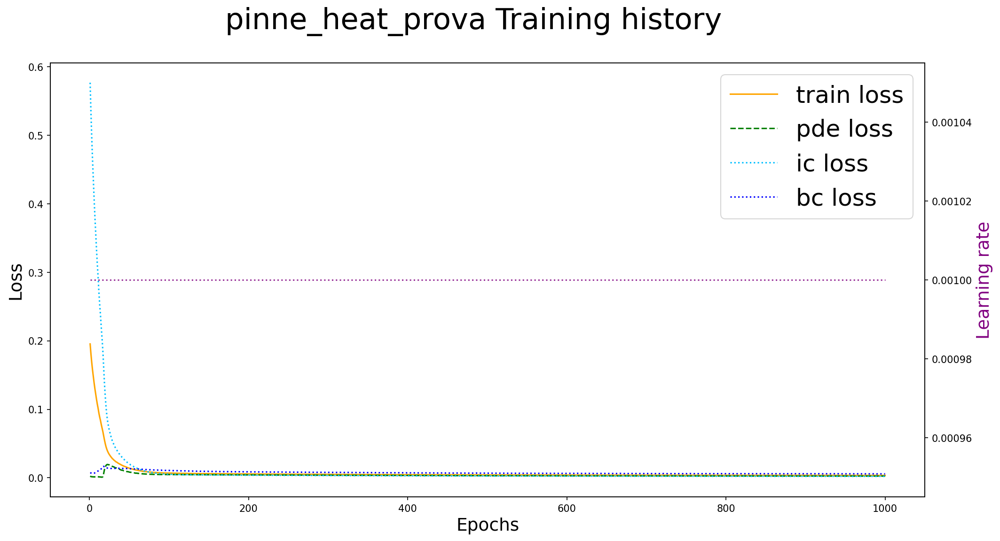

In [ ]:
fig, ax = plt.subplots(figsize=(16, 8), dpi=150)
fig.suptitle(f"{pinn_model.model_name} Training history", fontsize=30)
ax.plot(range(1,len(pinn_model.training_loss)+1), pinn_model.training_loss, color='orange', linestyle='-', label='train loss')
# others
if pinn_model.use_rec:
    ax.plot(range(1,len(pinn_model.training_rec_loss)+1), pinn_model.training_rec_loss, color='red', linestyle='-.', label='rec loss')
ax.plot(range(1,len(pinn_model.training_pde_loss)+1), pinn_model.training_pde_loss, color='green', linestyle='--', label='pde loss')
ax.plot(range(1,len(pinn_model.training_ic_loss)+1), pinn_model.training_ic_loss, color='deepskyblue', linestyle=':', label='ic loss')
ax.plot(range(1,len(pinn_model.training_bc_loss)+1), pinn_model.training_bc_loss, color='blue', linestyle=':', label='bc loss')

ax.set_xlabel('Epochs',fontsize=18)
ax.set_ylabel('Loss',fontsize=18)

#ax.set_ylim(0.0, 0.9)

# plot LR
# twin object for two different y-axis on the sample plot
ax2=ax.twinx()
# make a plot with different y-axis using second axis object
ax2.plot(range(1,len(pinn_model.training_loss)+1), pinn_model.learning_rates, color='purple', linestyle=':', label='Learning rates', alpha=0.8)
ax2.set_ylabel("Learning rate", color="purple",fontsize=18)

ax.legend(fontsize=24)

fig.savefig(f"{pinn_model.BASE_PATH_TO_STORE}/{pinn_model.model_name}_training_history.pdf")

fig.show()

## 6. Test model

In [ ]:
# load the best model
pinn_model.load_best_model()

Loaded best model: ./model_data/pinne_heat_prova.pth at epoch: 988



PDE loss: 0.0027409913018345833


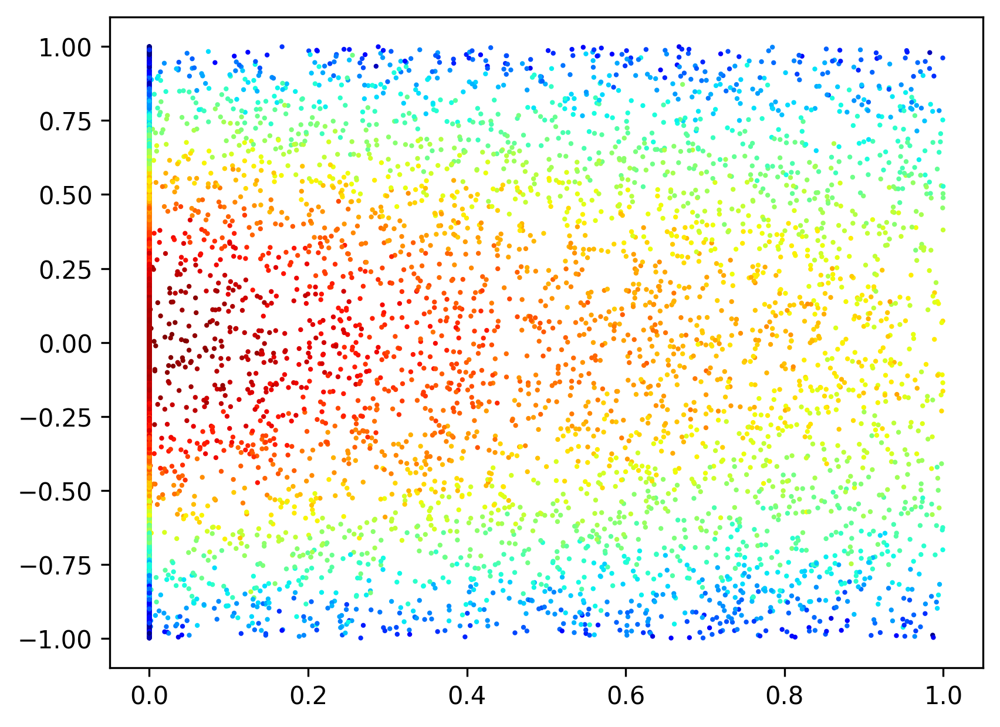

In [ ]:
coords, ic_coords, bc_coords = pinn_model.generate_coords()
X = Variable(coords, requires_grad=True)
pred_func = pinn_model.forward(X.to(pinn_model.device) ).cpu()

X_ic = Variable(ic_coords, requires_grad=True)
pred_func_ic = pinn_model.forward(X_ic.to(pinn_model.device) ).cpu()

heat_pred = pinn_model.pde_loss(X, pred_func)

print(f"PDE loss: {heat_pred.item()}")

plt.figure(dpi=300)
coords = coords.detach().cpu()
plt.scatter(coords[:, 0], coords[:, 1], c=pred_func.squeeze(-1).detach().cpu(), s=1, cmap='jet')
ic_coords = ic_coords.detach().cpu()
plt.scatter(ic_coords[:, 0], ic_coords[:, 1], c=pred_func_ic.squeeze(-1).detach().cpu(), s=1, cmap='jet', vmin=0, vmax=1)
plt.show()

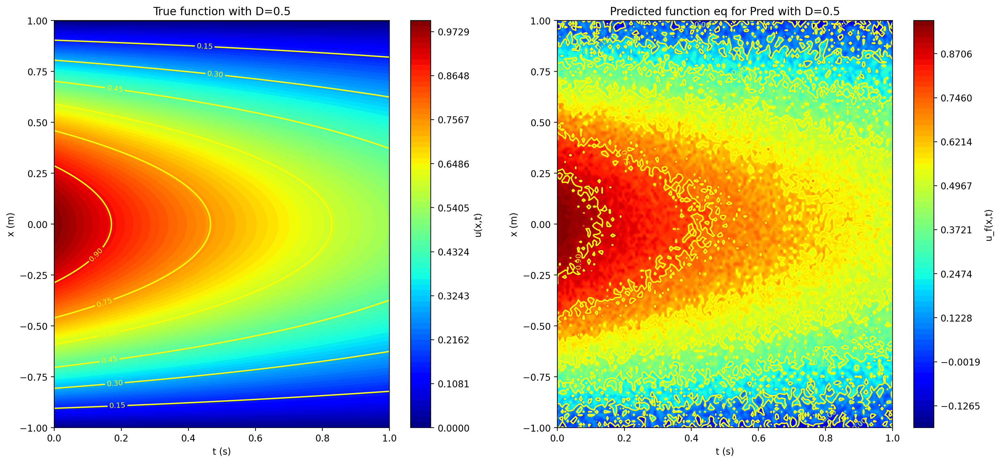

In [ ]:
import scipy.interpolate

N_POINTS = 128

USE_SAME_SCALE = not True

# Grid data
t = np.linspace(pinn_model._t_min, pinn_model._t_max, N_POINTS)
x = np.linspace(pinn_model._x_min, pinn_model._x_max, N_POINTS)

T, X = np.meshgrid(t,x)

# True
true_func = exact_solution_func_np(T.flatten(), X.flatten(), diffusion_param=pinn_model.diffusion_coefficient)
Z = true_func.reshape(128, 128)

# Pred
coords = np.zeros([N_POINTS**2, 2])
coords[:, 0] = T.flatten()
coords[:, 1] = X.flatten()
X_VAR = Variable(torch.tensor(coords), requires_grad=True).float()
pred_func = pinn_model.forward(X_VAR.to(pinn_model.device) ).cpu().squeeze(-1).detach().numpy()
Z_false = pred_func.reshape(128, 128)

# ===== Figure ======
fig, axs = plt.subplots(nrows=1, ncols=2, dpi=200, figsize=(18,8))
#and then comes the plot, with the colour-blind-friendly viridis colourmap
levels = np.linspace(true_func.min().item(), true_func.max().item(), 75)
im0 = axs[0].contourf(
    T, X, Z,
    levels=levels ,
    origin = 'lower',
    cmap='jet',
    alpha = 1.0
)
cbar0 = plt.colorbar(im0, ax=axs[0])
cbar0.set_label('u(x,t)')

#optional countour lines:
contours = axs[0].contour(T, X, Z, colors='yellow');
axs[0].clabel(contours, inline=True, fontsize=8)

axs[0].set_title(f"True function with D={pinn_model.diffusion_coefficient}")
axs[0].set_xlabel('t (s)')
axs[0].set_ylabel('x (m)')

levels_pred = np.linspace(pred_func.min().item(), pred_func.max().item(), 75)
im1 = axs[1].contourf(
    T, X, Z_false,
    levels=levels if USE_SAME_SCALE else levels_pred,
    origin = 'lower',
    cmap='jet',
    alpha = 1.0
)
cbar1 = plt.colorbar(im1, ax=axs[1])
cbar1.set_label('u_f(x,t)')

#optional countour lines:
contours = axs[1].contour(T, X, Z_false, colors='yellow');
axs[1].clabel(contours, inline=True, fontsize=8)

axs[1].set_title(f"Predicted function eq for Pred with D={pinn_model.diffusion_coefficient}")
axs[1].set_xlabel('t (s)')
axs[1].set_ylabel('x (m)')

fig.savefig(f"{pinn_model.BASE_PATH_TO_STORE}/{pinn_model.model_name}_pred_func.pdf")

plt.show()

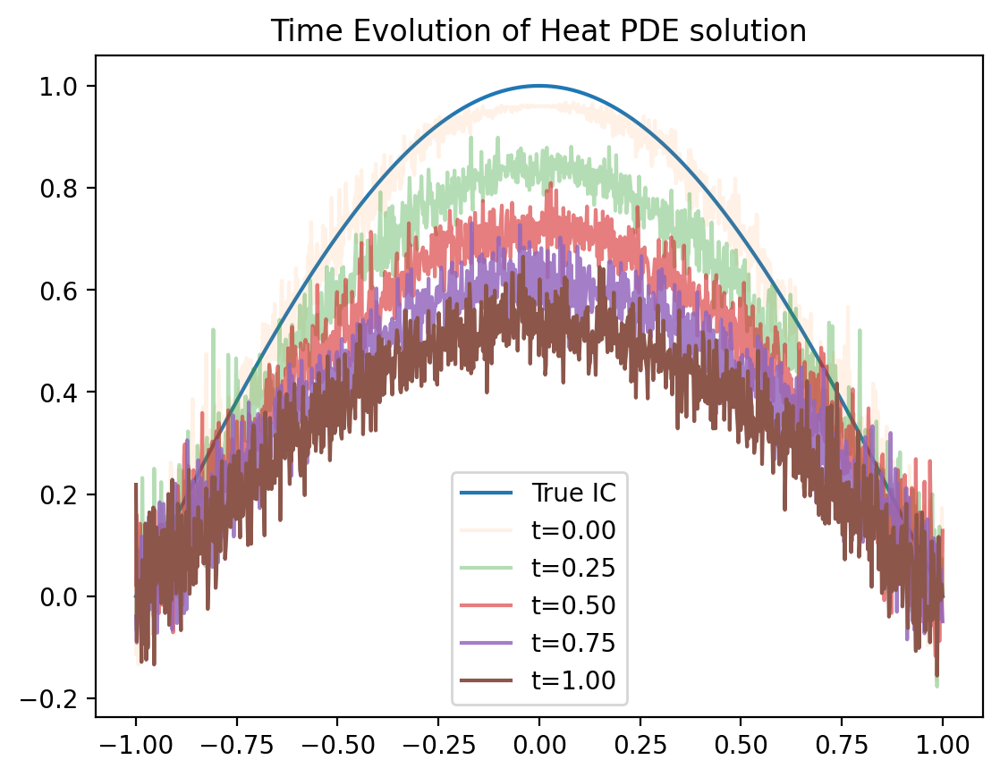

In [ ]:
plt.figure(dpi=200)
N_POINTS = 1024

for t in np.arange(0.0, 1.25, 0.25):
    coords = np.ones([N_POINTS, 2])
    coords[:, 1]  = np.linspace(pinn_model._x_min, pinn_model._x_max, N_POINTS)
    coords[:, 0] *= t
    if t==0:
        plt.plot(coords[:, 1], np.cos(np.pi*coords[:,1]/2), label=f"True IC")

    X_VAR = Variable(torch.tensor(coords), requires_grad=True).float()
    pred_functor = pinn_model.forward(X_VAR.to(pinn_model.device) )
    pred_func = pred_functor.cpu().squeeze(-1).detach().numpy()

    plt.plot(coords[:, 1], pred_func, label=f"t={t:.2f}", alpha=min(t + 0.1,1))

plt.title("Time Evolution of Heat PDE solution")
plt.legend()
plt.show()

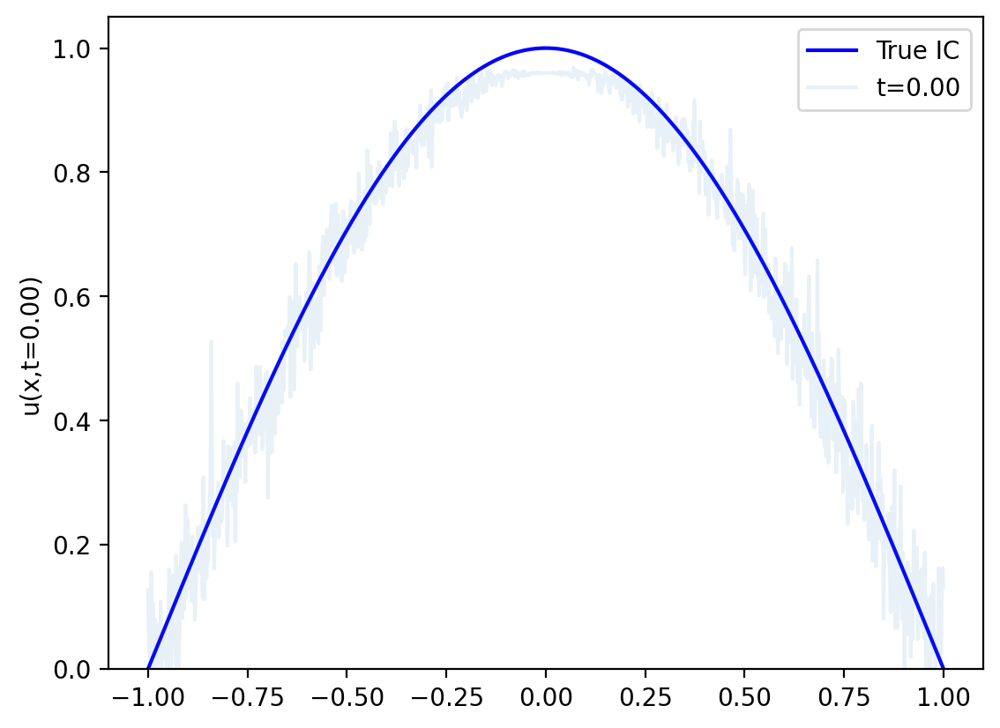

In [ ]:
from matplotlib.animation import FuncAnimation

fig, ax = plt.subplots(1,1, dpi=200)
N_POINTS = 1024
ax.set_title("Time Evolution of Heat PDE solution")
ax.set_xlabel('x')

num_steps = 10
_Delta = 1/num_steps

_time_range = np.arange(0.0, 1.0 + _Delta ,_Delta)


def update_plot(time_idx):
    ax.cla()
    t = _time_range[time_idx]
    coords = np.ones([N_POINTS, 2])
    coords[:, 1]  = np.linspace(pinn_model._x_min, pinn_model._x_max, N_POINTS)
    coords[:, 0] *= t


    X_VAR = Variable(torch.tensor(coords), requires_grad=True).float()
    pred_functor = pinn_model.forward(X_VAR.to(pinn_model.device) )
    pred_func = pred_functor.cpu().squeeze(-1).detach().numpy()

    ax.plot(coords[:, 1], np.cos(np.pi*coords[:,1]/2), label=f"True IC", c='b')

    ax.plot(coords[:, 1], pred_func, label=f"t={t:.2f}", alpha=min(t + 0.1,1))
    ax.set_ylabel(f'u(x,t={t:.2f})')

    ax.set_ylim(bottom=0.0, top=1.05)

    ax.legend()

ani = FuncAnimation(fig = fig, func = update_plot, frames = num_steps, interval = 100)

In [ ]:
from IPython.display import HTML
HTML(ani.to_jshtml())